In [4]:
import tensorflow as tf
import os
import pathlib
import time
import datetime
import tqdm
import scipy.io
from matplotlib import pyplot as plt
from IPython import display
os.environ["CUDA_VISIBLE_DEVICES"]="0"
# specify the data size, batch size, and buffer size
BATCH_SIZE = 1 # batch size of 1 has given the best results
DATA_HEIGHT = 192
DATA_WIDTH = 64
DATA_DEPTH = 64
# resize both anatomy and flow to a larger size
def resize(anatomy,flow,height,width):
    anatomy = tf.image.resize(anatomy,[height,width],method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    flow = tf.image.resize(flow,[height,width],method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return anatomy,flow
# randomly crop the enlarged data to its original size
def random_crop(anatomy,flow):
    stacked_data = tf.stack([tf.squeeze(anatomy),tf.squeeze(flow)],axis=0)
    cropped_data = tf.image.random_crop(stacked_data,
                                        size=[2,DATA_HEIGHT,DATA_WIDTH,DATA_DEPTH])
    return tf.expand_dims(cropped_data[0],axis=-1),tf.expand_dims(cropped_data[1],axis=-1)
@tf.function()
def random_jitter(anatomy,flow):
    anatomy,flow = resize(anatomy,flow,DATA_HEIGHT+30,DATA_WIDTH+30) # resize
    anatomy,flow = random_crop(anatomy,flow) # crop back to the original size
    if tf.random.uniform(()) > 0.5:
        anatomy = tf.image.flip_left_right(anatomy)
        flow = tf.image.flip_left_right(flow)
    return anatomy,flow
@tf.function
def center_crop(image, size):
    if not isinstance(size, (tuple, list)):
        size = [size, ize]
    offset_height = (tf.shape(image)[-3]-size[0])//2
    offset_width = (tf.shape(image)[-2]-size[1])//2
    return tf.image.crop_to_bounding_box(image,offset_height,offset_width,size[0],size[1])
def parser_train(tfrecord):
    feature = tf.io.parse_single_example(tfrecord,{'A': tf.io.FixedLenFeature(shape=[], dtype=tf.string),
              'B' : tf.io.FixedLenFeature(shape=[], dtype=tf.string),
              'height' : tf.io.FixedLenFeature(shape=[], dtype=tf.int64),
              'width'  : tf.io.FixedLenFeature(shape=[], dtype=tf.int64),
              'depth'  : tf.io.FixedLenFeature(shape=[], dtype=tf.int64)})
    height = tf.cast(feature["height"], tf.int32)
    width  = tf.cast(feature["width"], tf.int32)
    depth  = tf.cast(feature["depth"], tf.int32)
    A = tf.io.decode_raw(feature['A'], tf.float32) 
    A = tf.reshape(A, [height, width, depth])
    A = center_crop(A, [DATA_HEIGHT,DATA_WIDTH])
    B = tf.io.decode_raw(feature['B'], tf.float32) 
    B = tf.reshape(B, [height, width, depth])
    B = center_crop(B, [DATA_HEIGHT,DATA_WIDTH])
    return random_jitter(A, B)
def parser_test(tfrecord):
    feature = tf.io.parse_single_example(tfrecord,{'A': tf.io.FixedLenFeature(shape=[], dtype=tf.string),
              'B' : tf.io.FixedLenFeature(shape=[], dtype=tf.string),
              'height' : tf.io.FixedLenFeature(shape=[], dtype=tf.int64),
              'width'  : tf.io.FixedLenFeature(shape=[], dtype=tf.int64),
              'depth'  : tf.io.FixedLenFeature(shape=[], dtype=tf.int64)})
    height = tf.cast(feature["height"], tf.int32)
    width  = tf.cast(feature["width"], tf.int32)
    depth  = tf.cast(feature["depth"], tf.int32)
    A = tf.io.decode_raw(feature['A'], tf.float32) 
    A = tf.reshape(A, [height, width, depth])
    A = center_crop(A, [DATA_HEIGHT,DATA_WIDTH])
    B = tf.io.decode_raw(feature['B'], tf.float32) 
    B = tf.reshape(B, [height, width, depth])
    B = center_crop(B, [DATA_HEIGHT,DATA_WIDTH])
    return tf.expand_dims(A,axis=-1),tf.expand_dims(B,axis=-1)
tfrecord_path = 'anatomay2flow_train_pix2pix.tfrecords'
dataset_train = tf.data.TFRecordDataset(tfrecord_path)
DATA_SIZE = len(list(dataset_train))
BUFFER_SIZE = DATA_SIZE
dataset_train = dataset_train.map(map_func=parser_train,num_parallel_calls=tf.data.AUTOTUNE)
dataset_train = dataset_train.shuffle(buffer_size=BUFFER_SIZE)
dataset_train = dataset_train.batch(BATCH_SIZE)
# create a set of test samples
tfrecord_path = 'anatomay2flow_test_pix2pix.tfrecords'
dataset_test = tf.data.TFRecordDataset(tfrecord_path)
dataset_test = dataset_test.map(map_func=parser_test,num_parallel_calls=tf.data.AUTOTUNE)
dataset_test = dataset_test.batch(BATCH_SIZE)
dataset_test = iter(dataset_test);
Asample = list()
Bsample = list()
ii = 1
for a,b in dataset_test:
    Asample.append(a)
    Bsample.append(b)
    ii+=1
    if ii>10:
        print(a.shape)
        break

(1, 192, 64, 64, 1)


Shape of the inputs of a downsampler with 3 filters:  (1, 192, 64, 64, 1)
Shape of the output of a downsampler with 3 filters:  (1, 96, 32, 32, 3)
Shape of the output of a up-sampler with 3 filters:  (1, 192, 64, 64, 3)
This is the generator model summary
Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 192, 64, 64  0           []                               
                                , 1)]                                                             
                                                                                                  
 sequential_34 (Sequential)     (None, 96, 32, 32,   4096        ['input_3[0][0]']                
                                64)                                                               
                                  

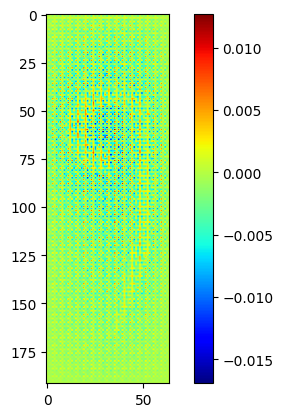

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_image (InputLayer)       [(None, 192, 64, 64  0           []                               
                                , 1)]                                                             
                                                                                                  
 target_image (InputLayer)      [(None, 192, 64, 64  0           []                               
                                , 1)]                                                             
                                                                                                  
 concatenate_17 (Concatenate)   (None, 192, 64, 64,  0           ['input_image[0][0]',            
                                 2)                               'target_image[0][0]']     

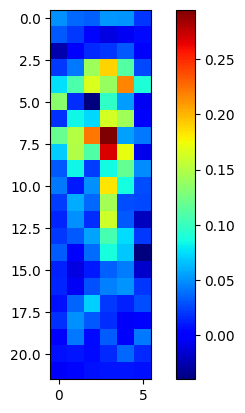

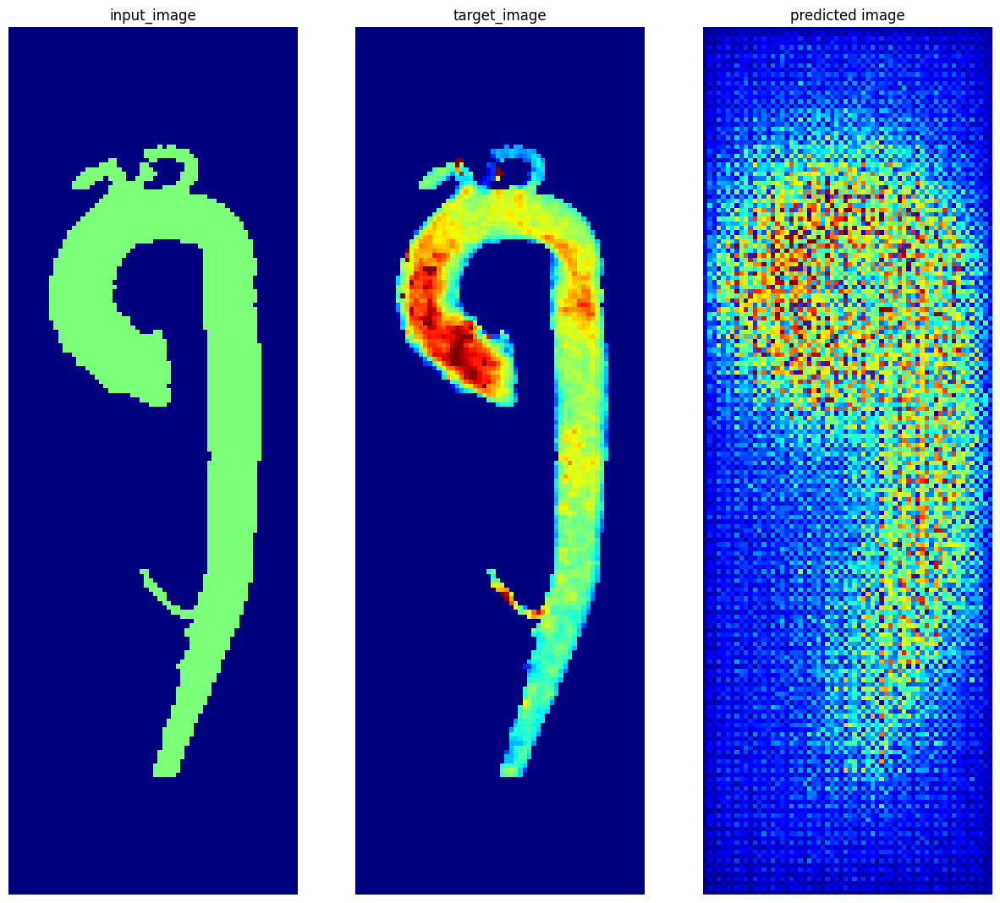

In [22]:
# define the generator downsampler
def downsample(filters,size,apply_batchnorm=True):
    initializer=tf.random_normal_initializer(0,0.02)
    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv3D(filters,size,strides=2,padding='same',
                                    kernel_initializer=initializer,use_bias=False))
    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())
    result.add(tf.keras.layers.LeakyReLU())
    return result
down_model = downsample(3,4)
A = Asample[0]
print("Shape of the inputs of a downsampler with 3 filters: ",A.shape)
down_result = down_model(A)
print("Shape of the output of a downsampler with 3 filters: ",down_result.shape)
# define the generator upsampler
def upsample(filters,size,apply_dropout=False):
    initializer = tf.random_normal_initializer(0,0.02)
    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv3DTranspose(filters,size,strides=2,padding='same',
                                       kernel_initializer=initializer,use_bias=False))
    result.add(tf.keras.layers.BatchNormalization())
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    result.add(tf.keras.layers.ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print("Shape of the output of a up-sampler with 3 filters: ",up_result.shape)
# defined the generator using the pre-defined down- and up-samplers
def Generator(OUTPUT_CHANNELS=1):
    inputs = tf.keras.layers.Input(shape=[DATA_HEIGHT,DATA_WIDTH,DATA_DEPTH,1])
    down_stack=[downsample(64,4,apply_batchnorm=False), #(1,96,32,32,64)
               downsample(128,4), #(1,48,16,16,128)
               downsample(256,4), #(1,24,8,8,256)
               downsample(512,4), #(1,12,4,4,512)
               downsample(512,4), #(1,6,2,2,512)
               downsample(512,4),# (1,3,1,1,512)
               ]
    up_stack=[upsample(512,4,apply_dropout=True),
             upsample(512,4,apply_dropout=True),
             upsample(256,4), 
             upsample(128,4),
             upsample(64,4), 
             ]
    initializer=tf.random_normal_initializer(0,0.02)
    last = tf.keras.layers.Conv3DTranspose(OUTPUT_CHANNELS,4,strides=2,padding='same',
                                          kernel_initializer=initializer,activation='linear')
                                          
    x = inputs
    skips=[]
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])
    for up,skip in zip(up_stack,skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x,skip])
    x = last(x)
    return tf.keras.Model(inputs=inputs,outputs=x)
generator = Generator()
print("This is the generator model summary")
generator.summary()
print("This a the plot of the generator model")
tf.keras.utils.plot_model(generator,show_shapes=True,dpi=64)
gen_output = generator(Asample[0],training=False)
print("This is an example of how the output of generator would look like:")
plt.imshow(tf.reduce_mean(tf.squeeze(gen_output),axis=-1),cmap='jet')
plt.colorbar()
plt.show()
# definition of the discriminator's loss
LAMBDA = 100
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)
def generator_loss(disc_generated_output,gen_ouptput,target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output),disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target-gen_output))
    total_gan_loss = gan_loss+(LAMBDA*l1_loss)
    return total_gan_loss,gan_loss,l1_loss
# build the discriminator model
def Discriminator():
    initializer = tf.random_normal_initializer(0.,0.02)
    anatomy = tf.keras.layers.Input(shape=([DATA_HEIGHT,DATA_WIDTH,DATA_DEPTH,1]),
                                   name='input_image')
    flow = tf.keras.layers.Input(shape=([DATA_HEIGHT,DATA_WIDTH,DATA_DEPTH,1]),
                                name='target_image')
    x = tf.keras.layers.concatenate([anatomy,flow]) 
    down1 = downsample(64,4,False)(x)  
    down2 = downsample(128,4)(down1) 
    down3 = downsample(256,4)(down2)  
    zero_pad1 = tf.keras.layers.ZeroPadding3D()(down3) 
    conv = tf.keras.layers.Conv3D(512,4,strides=1,
                                 kernel_initializer=initializer,
                                 use_bias=False)(zero_pad1) 
    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)
    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)
    zero_pad2 = tf.keras.layers.ZeroPadding3D()(leaky_relu) 
    last = tf.keras.layers.Conv3D(1,4,strides=1,
                                 kernel_initializer=initializer)(zero_pad2)
    return tf.keras.Model(inputs=[anatomy,flow],outputs=last)
# visualize the discriminator model
discriminator = Discriminator()
discriminator.summary()
tf.keras.utils.plot_model(discriminator,show_shapes=True,dpi=64)
# visualize an example output of the discriminator model
disc_out = discriminator([Asample[0],gen_output],training=False)
plt.imshow(tf.reduce_mean(tf.squeeze(disc_out),axis=-1),cmap='jet')
plt.colorbar()
plt.show()
# define the discriminator loss
def discriminator_loss(disc_real_output,disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output),disc_real_output)
    generated_loss = loss_object(tf.zeros_like(disc_generated_output),disc_generated_output)
    total_disc_loss = real_loss+generated_loss
    return total_disc_loss
# define the optimizers and chekpoint-saver
generator_optimizer = tf.keras.optimizers.Adam(2e-4,beta_1=0.5)
discriminator_optimizer=tf.keras.optimizers.Adam(2e-4,beta_1=0.5)
output_dir = './pix2pix_output' # the directory to save the model outputs
if not tf.io.gfile.isdir(output_dir):
    tf.io.gfile.mkdir(output_dir) # if the output directory does not exist, creates it
checkpoint_dir = tf.io.gfile.join(output_dir,'training_checkpoints') # where to save model ch
checkpoint_prefix = tf.io.gfile.join(checkpoint_dir,"ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                discrimnator_optimizer=discriminator_optimizer,
                                generator=generator,
                                discriminator=discriminator)
# generate images over the test dataset
def generate_images(model,test_input,tar):
    prediction = model(test_input,training=True)
    plt.figure(figsize=(15,15))
    display_list = [test_input[0],tar[0],prediction[0]]
    title=['input_image','target_image','predicted image']
    for i in range(3):
        plt.subplot(1,3,i+1)
        plt.title(title[i])
        plt.imshow(tf.reduce_max(tf.squeeze(display_list[i]),axis=-1),cmap='jet',clim=[0,2])
        plt.axis('off')
    plt.show()
generate_images(generator,Asample[0],Bsample[0])
# training
# log_dir = tf.io.gfile.join(output_dir,'logs')
# summary_writer = tf.summary.create_file_writer(
# log_dir+"fit/"+datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
@tf.function
def train_step(anatomy,flow):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(anatomy,training=True)
        disc_real_output = discriminator([anatomy,flow],training=True)
        disc_generated_output = discriminator([anatomy,gen_output],training=True)
        gen_total_loss,gen_gan_loss,gen_l1_loss = generator_loss(disc_generated_output,
                                                                gen_output,
                                                                flow)
        disc_loss = discriminator_loss(disc_real_output,disc_generated_output)
    generator_gradients = gen_tape.gradient(gen_total_loss,
                                           generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                                discriminator.trainable_variables)
    generator_optimizer.apply_gradients(zip(generator_gradients,generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,discriminator.trainable_variables))
#     with summary_writer.as_default():
#         tf.summary.scalar('gen_total_loss',gen_total_loss,step=step//1000)
#         tf.summary.scalar('gen_gan_loss',gen_gan_loss,step=step//1000)
#         tf.summary.scalar('gen_l1_loss',gen_l1_loss,step=step//1000)
#         tf.summary.scalar('disc_loss',disc_loss,step=step//1000)


Restored the model from epoch 2


Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 09:10:07.796743: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 834 of 909
2023-01-05 09:10:08.699313: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:48,  7.50it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:36,  7.43it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.38it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.36it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.37it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.32it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.40it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.37it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.40it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.80it/s]


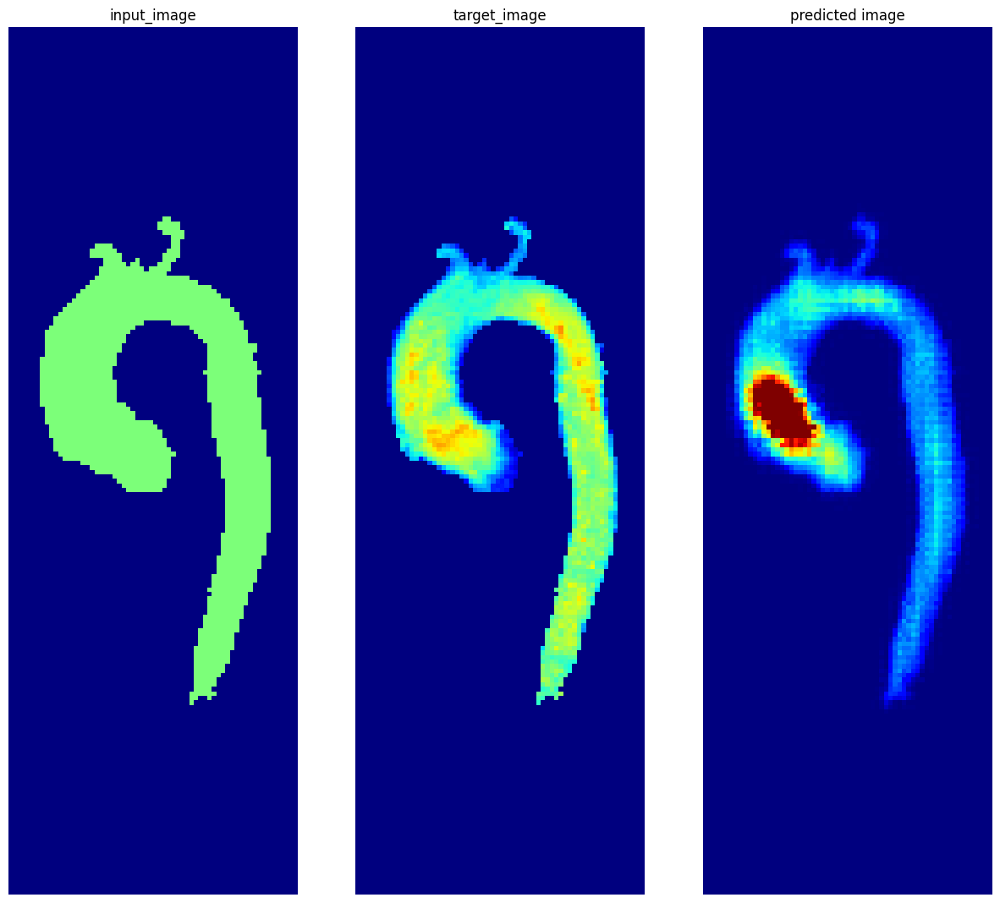

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 09:12:39.017023: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 854 of 909
2023-01-05 09:12:39.599912: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:50,  7.40it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.37it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.39it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:57,  7.42it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.39it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.37it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.41it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.35it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.80it/s]


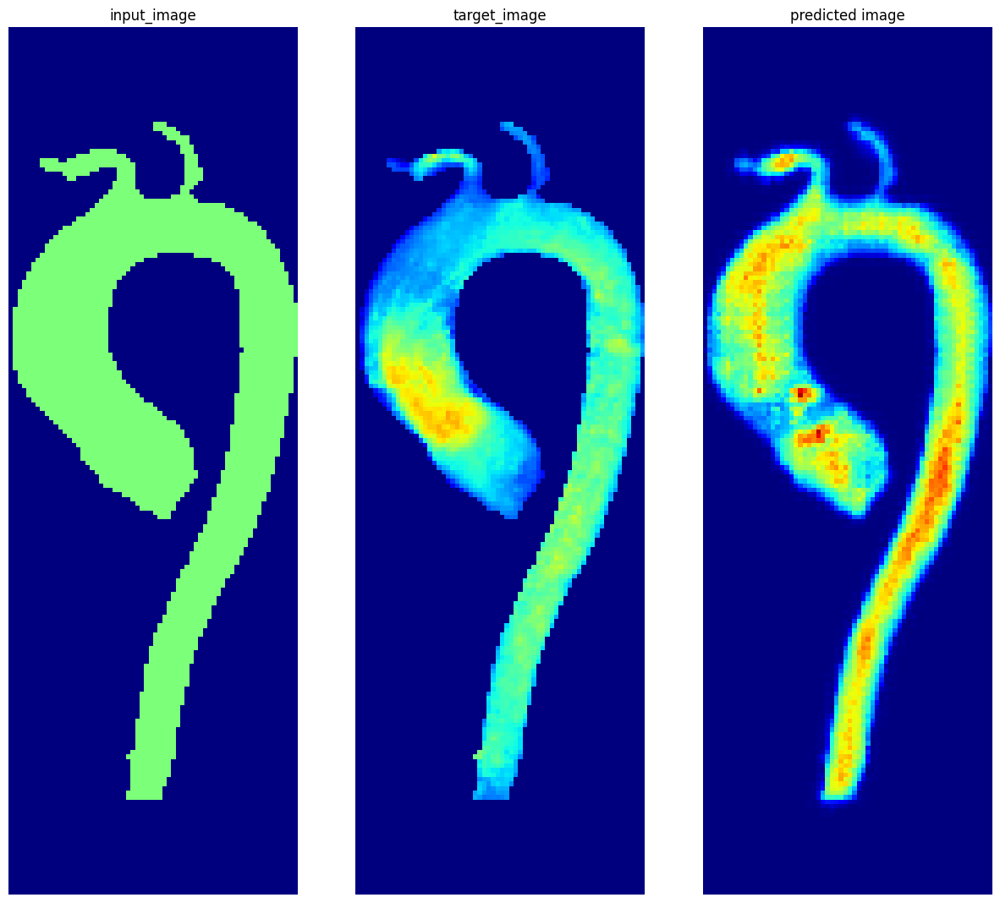

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 09:15:10.444970: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 892 of 909
2023-01-05 09:15:10.604772: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:50,  7.42it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.38it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:24,  7.33it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:01<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:14<00:58,  7.39it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.40it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.39it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.38it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.37it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.82it/s]


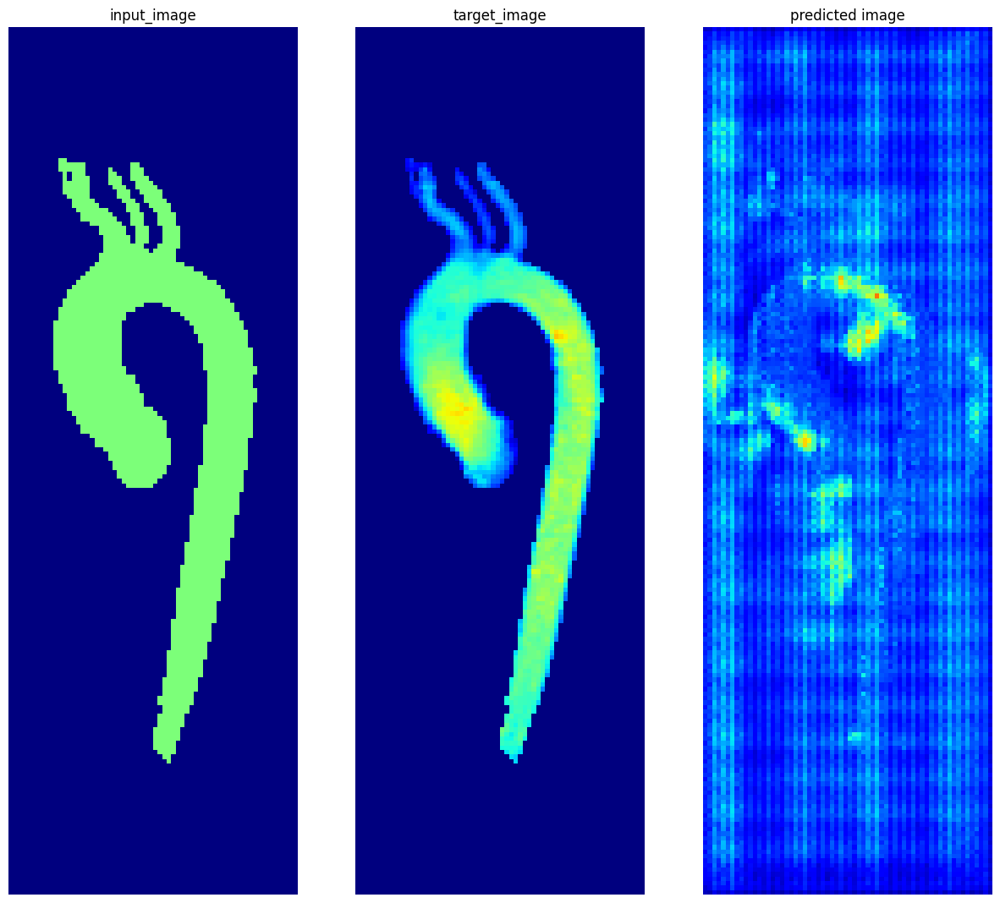

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 09:17:41.171918: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 903 of 909
2023-01-05 09:17:41.227878: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:49,  7.47it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.41it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:24,  7.39it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:01<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:14<00:58,  7.35it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.35it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.37it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.33it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.38it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.83it/s]


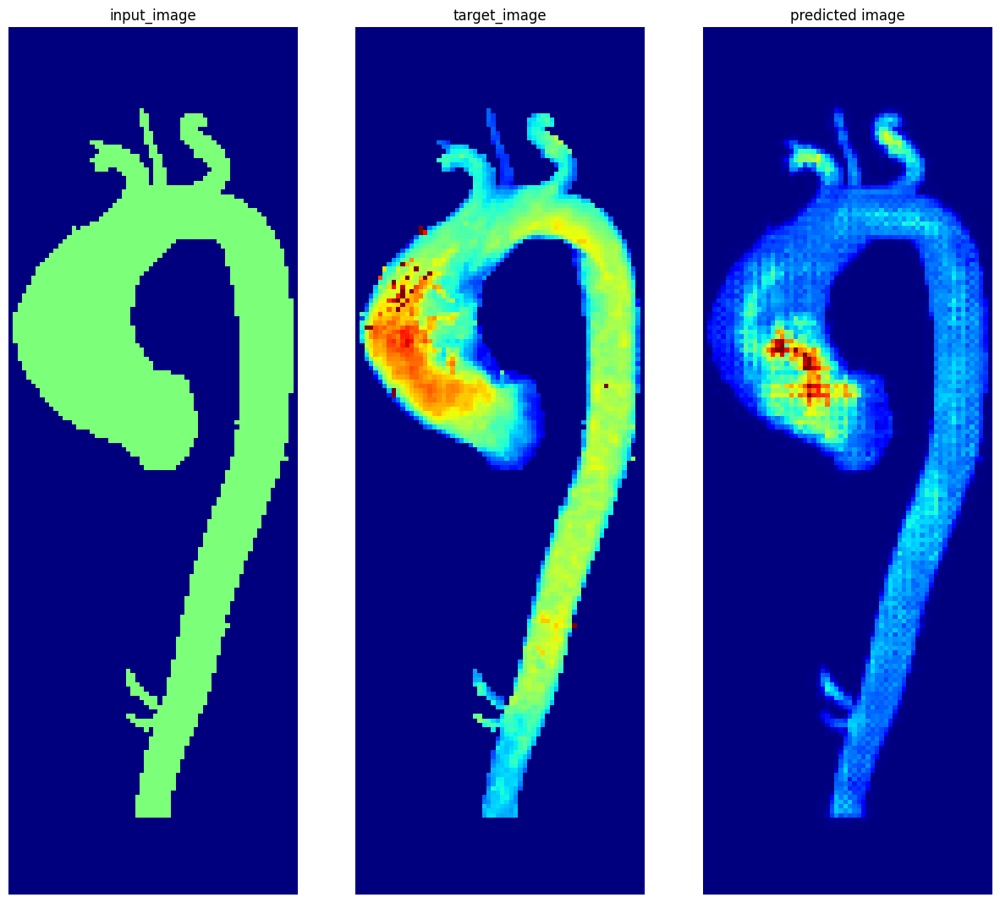

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 09:20:11.752815: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 866 of 909
2023-01-05 09:20:12.269505: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:49,  7.44it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.36it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.39it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.40it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.37it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.37it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.37it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.36it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.36it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.81it/s]


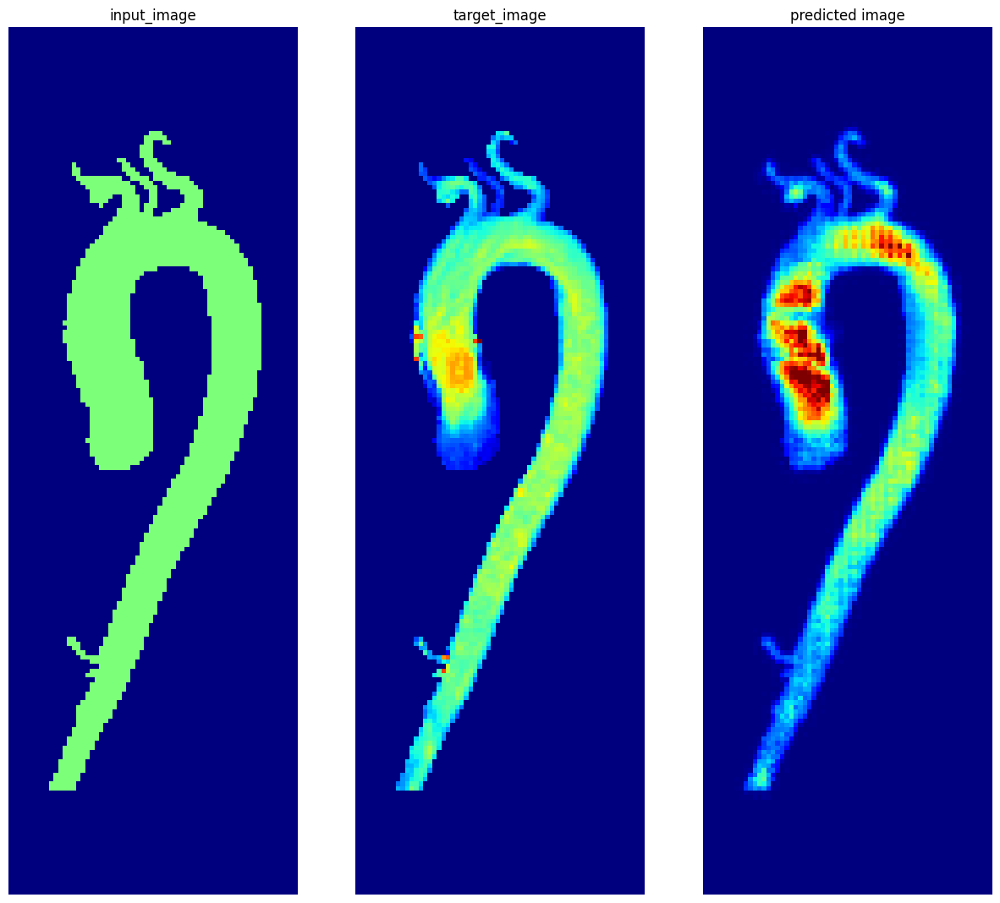

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 09:22:42.750917: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 901 of 909
2023-01-05 09:22:42.832284: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:50,  7.41it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:36,  7.43it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:24,  7.41it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:01<01:11,  7.34it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:14<00:58,  7.39it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.27it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.37it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.41it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.40it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.83it/s]


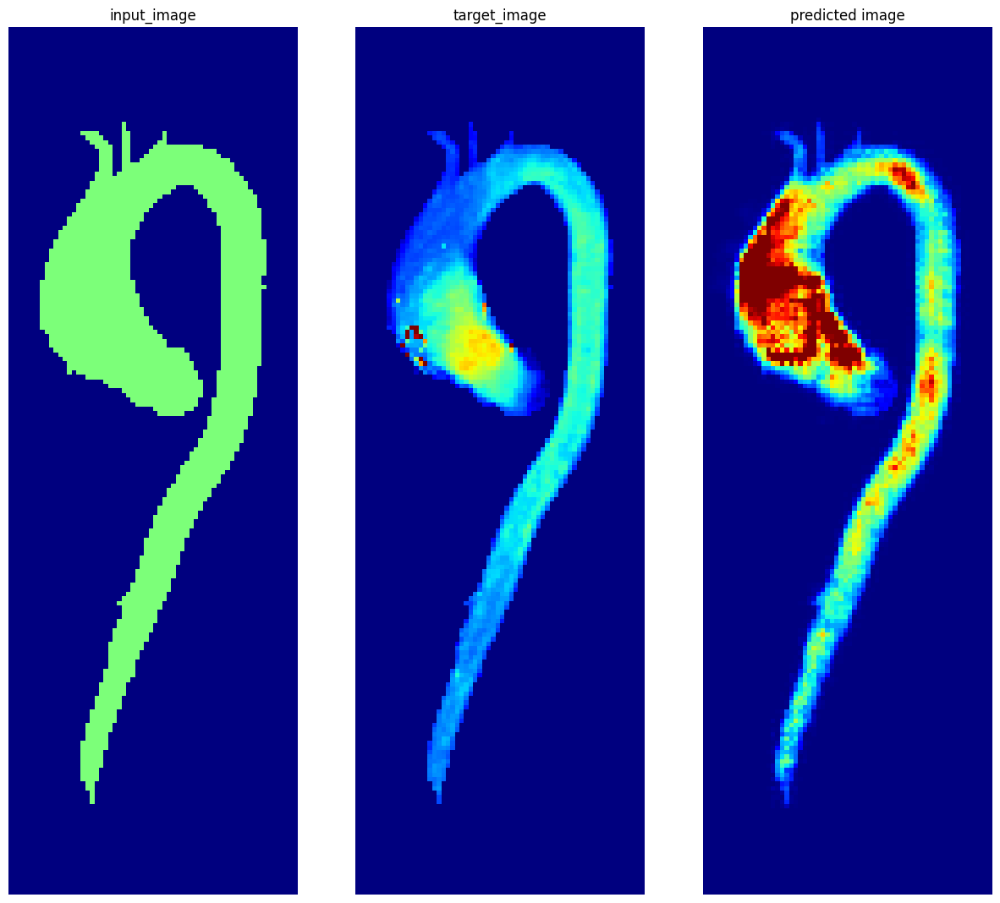

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 09:25:12.801791: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 828 of 909
2023-01-05 09:25:13.618354: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:50,  7.42it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.41it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.36it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.39it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.35it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.39it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.79it/s]


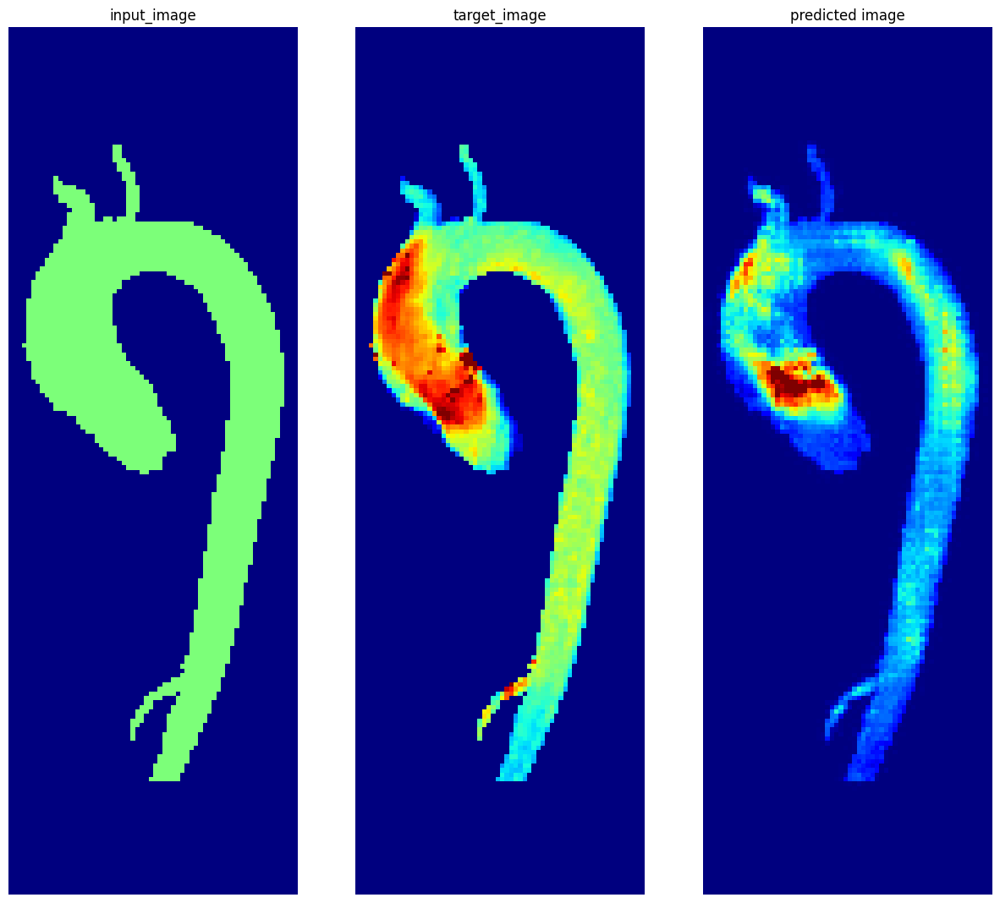

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 09:27:44.261334: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 839 of 909
2023-01-05 09:27:44.975253: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:49,  7.46it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.40it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.39it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.36it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.36it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.39it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.38it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.38it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.37it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.80it/s]


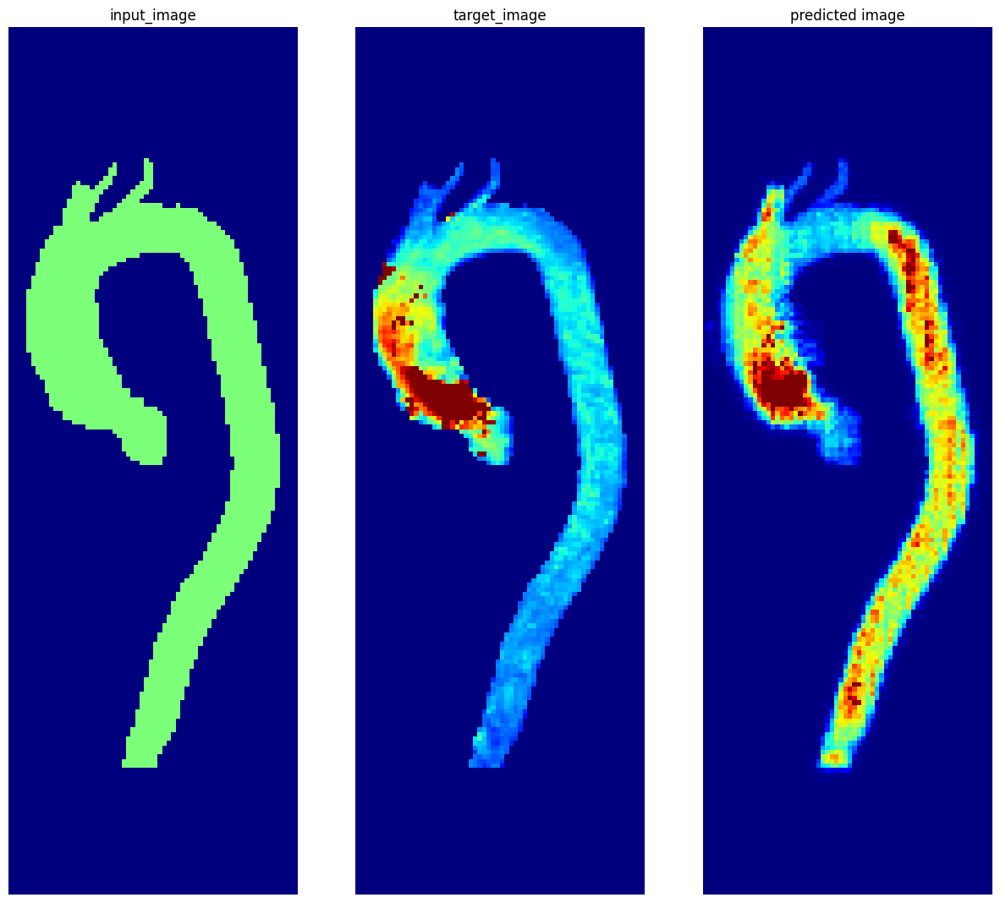

Inner Epoch:  10%|███                          | 95/909 [00:22<01:49,  7.41it/s]


Inner Epoch:  21%|█████▉                      | 192/909 [00:35<01:36,  7.40it/s]


Inner Epoch:  32%|████████▉                   | 289/909 [00:48<01:24,  7.37it/s]


Inner Epoch:  42%|███████████▉                | 386/909 [01:01<01:11,  7.32it/s]


Inner Epoch:  53%|██████████████▉             | 483/909 [01:14<00:57,  7.37it/s]


Inner Epoch:  64%|█████████████████▊          | 580/909 [01:27<00:44,  7.39it/s]


Inner Epoch:  74%|████████████████████▊       | 677/909 [01:40<00:31,  7.39it/s]


Inner Epoch:  85%|███████████████████████▊    | 774/909 [01:54<00:18,  7.40it/s]


Inner Epoch:  96%|██████████████████████████▊ | 871/909 [02:07<00:05,  7.39it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:12<00:00,  6.86it/s]


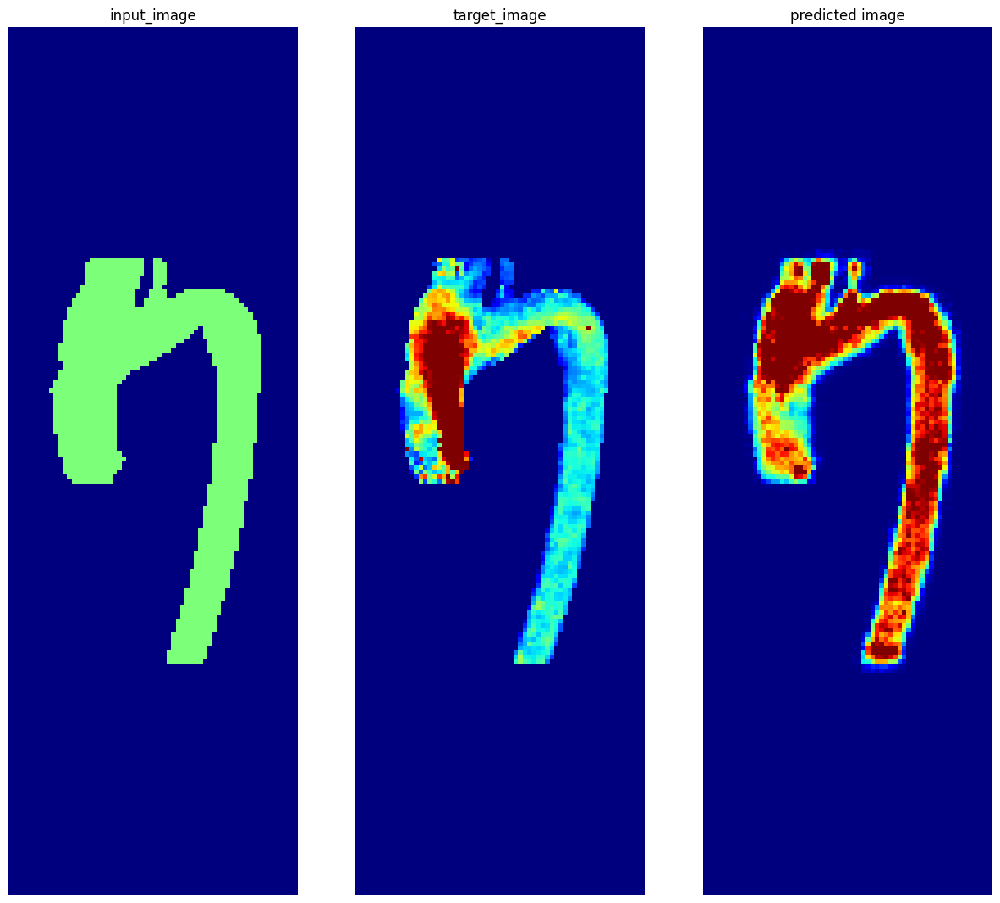

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 09:32:45.399642: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 904 of 909
2023-01-05 09:32:45.453219: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:50,  7.42it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.39it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:24,  7.38it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:01<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:14<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:27<00:45,  7.37it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.38it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.37it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.38it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.83it/s]


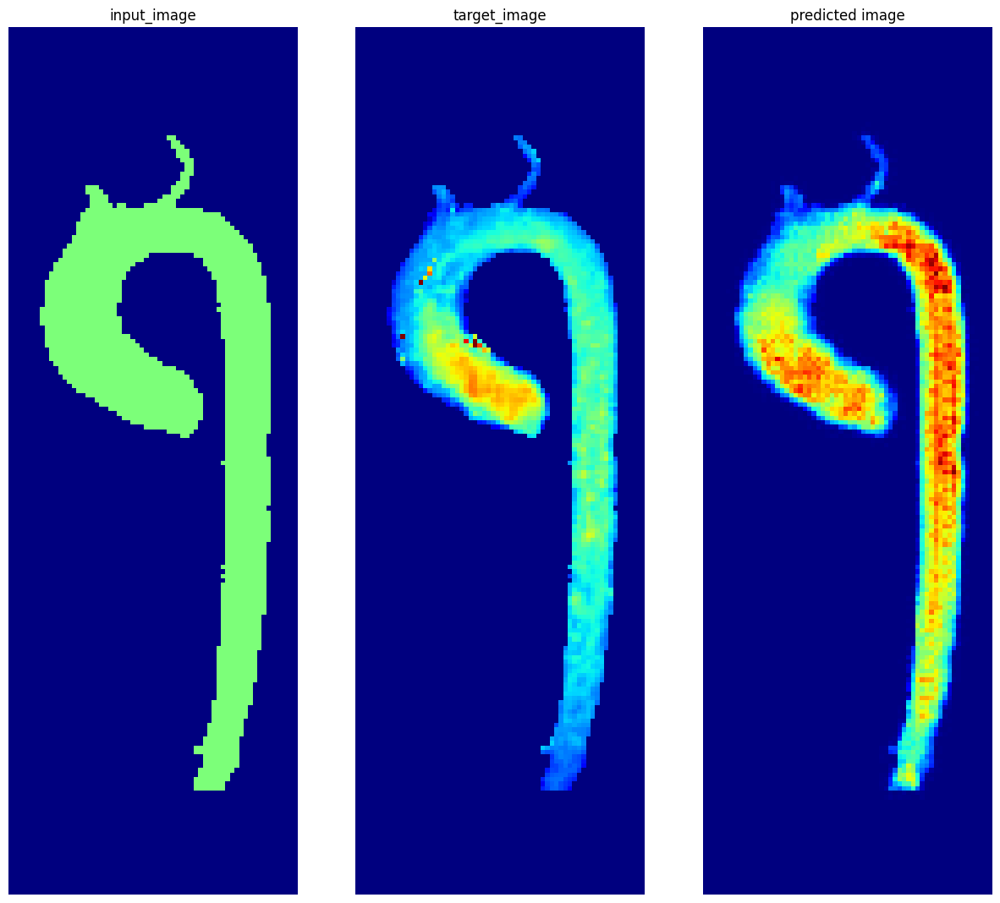

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 09:35:15.997279: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 831 of 909
2023-01-05 09:35:16.889513: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.47it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.39it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.39it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:10,  7.41it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.39it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.41it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.37it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.38it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.37it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.79it/s]


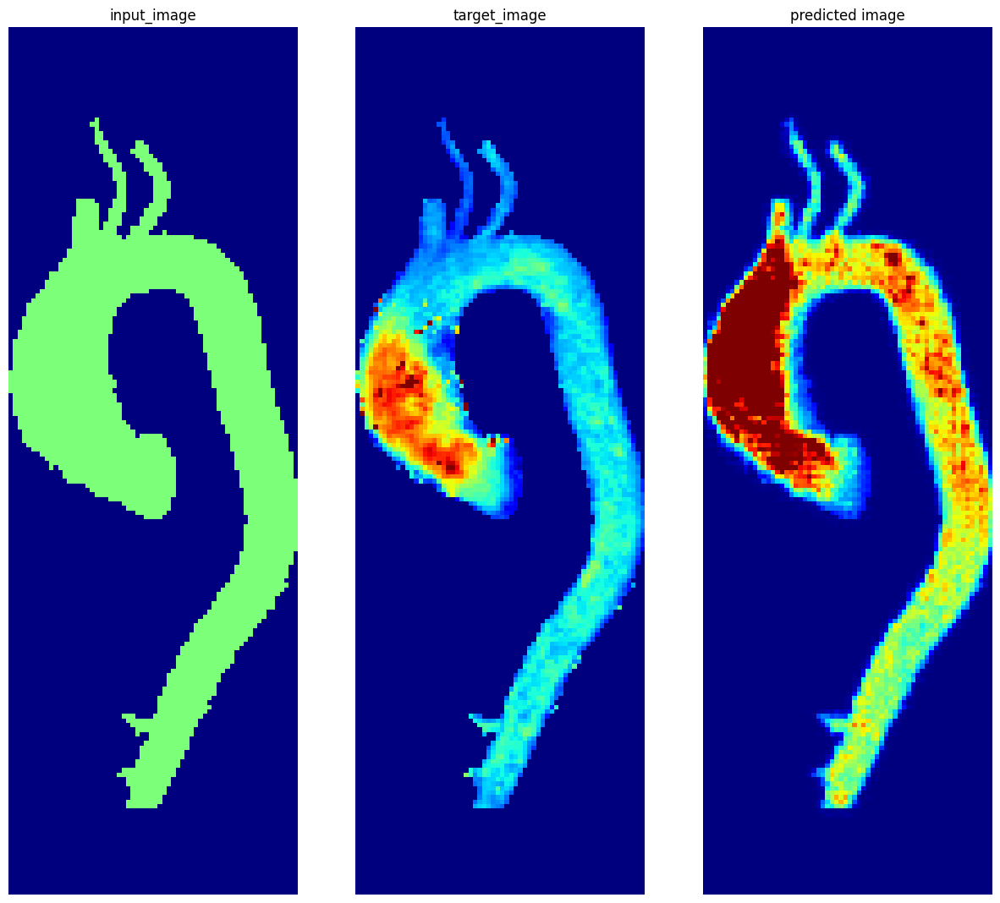

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 09:37:47.485981: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 819 of 909
2023-01-05 09:37:48.418115: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.44it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.39it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.36it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.39it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:57,  7.40it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.36it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.39it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.39it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.38it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.79it/s]


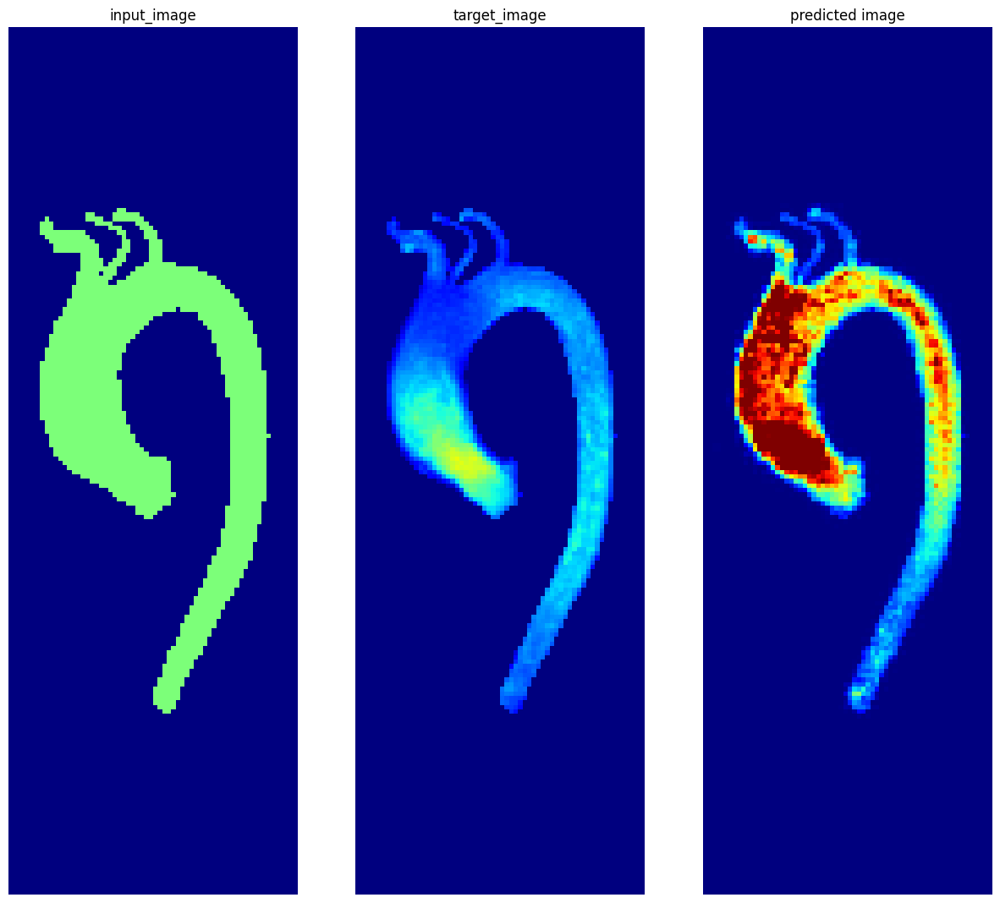

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 09:40:19.059889: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 881 of 909
2023-01-05 09:40:19.364454: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:50,  7.41it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.40it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:24,  7.36it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:01<01:11,  7.39it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:57,  7.41it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.36it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.38it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.40it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.42it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.82it/s]


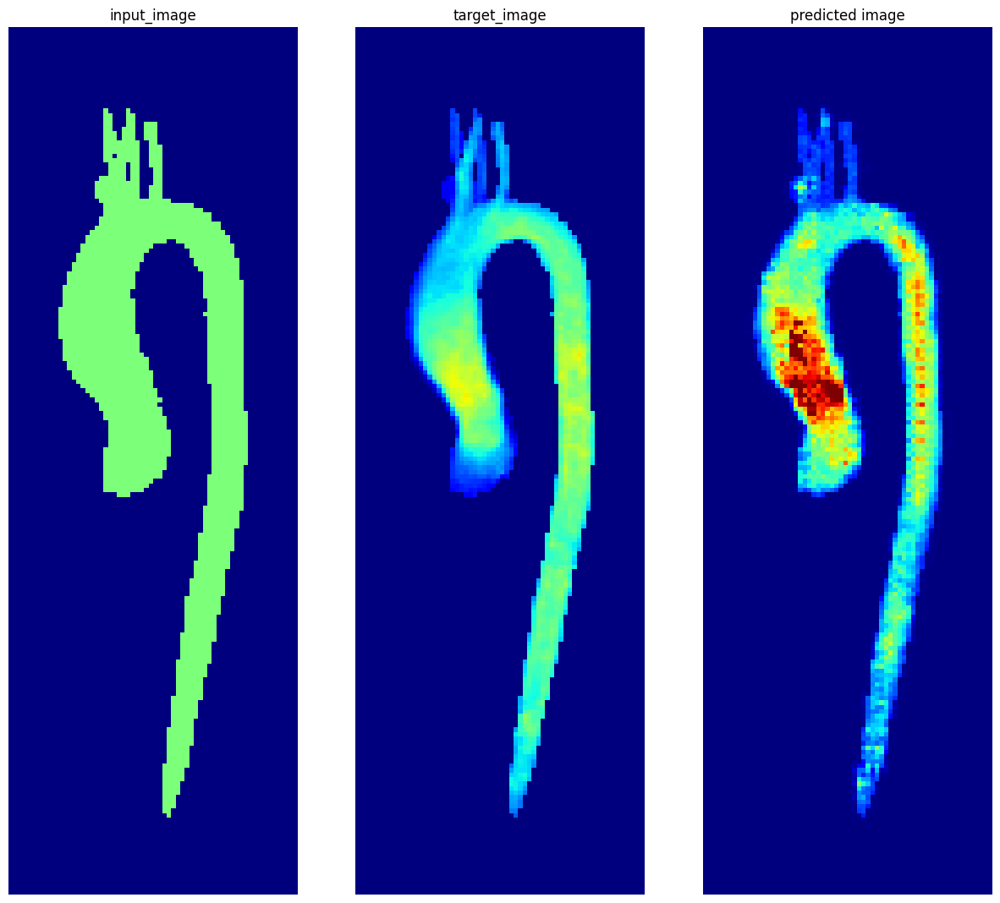

Inner Epoch:  10%|███                          | 95/909 [00:21<01:49,  7.42it/s]


Inner Epoch:  21%|█████▉                      | 192/909 [00:35<01:37,  7.39it/s]


Inner Epoch:  32%|████████▉                   | 289/909 [00:48<01:24,  7.34it/s]


Inner Epoch:  42%|███████████▉                | 386/909 [01:01<01:10,  7.39it/s]


Inner Epoch:  53%|██████████████▉             | 483/909 [01:14<00:58,  7.29it/s]


Inner Epoch:  64%|█████████████████▊          | 580/909 [01:27<00:44,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 677/909 [01:40<00:31,  7.39it/s]


Inner Epoch:  85%|███████████████████████▊    | 774/909 [01:53<00:18,  7.38it/s]


Inner Epoch:  96%|██████████████████████████▊ | 871/909 [02:07<00:05,  7.39it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:12<00:00,  6.87it/s]


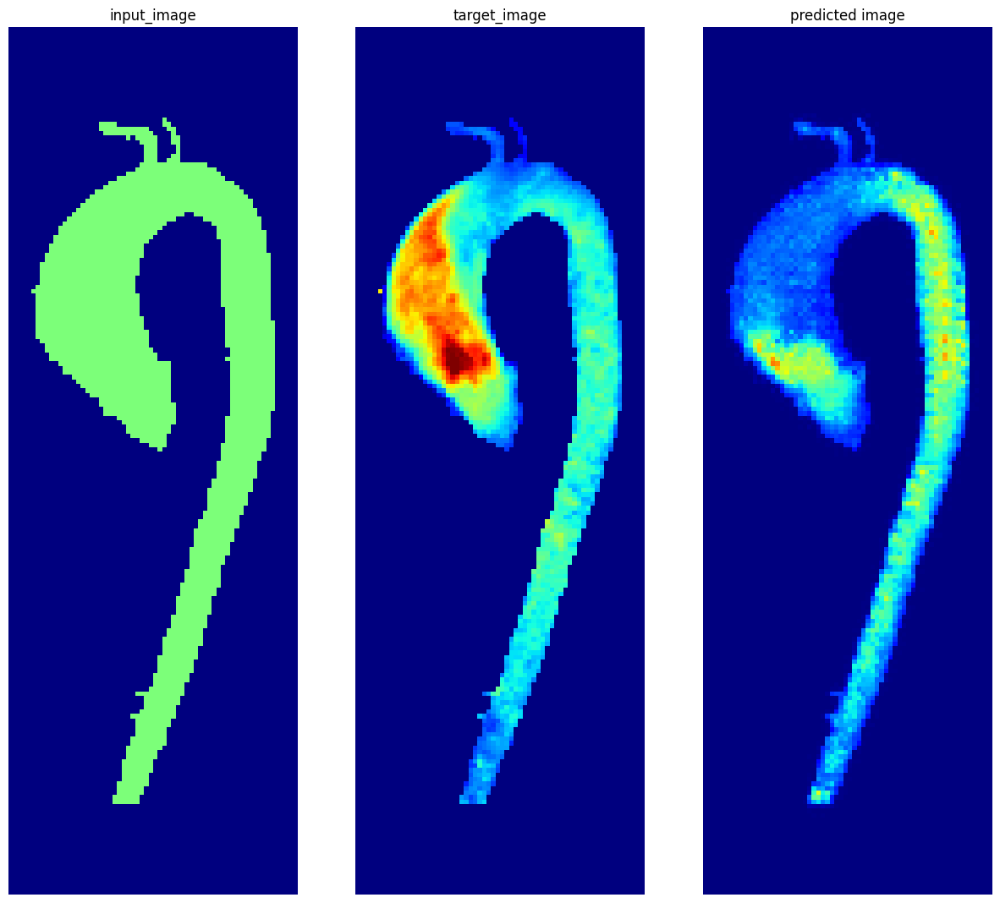

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 09:45:20.900080: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 846 of 909
2023-01-05 09:45:21.624758: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:49,  7.44it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.42it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.34it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.40it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:57,  7.41it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.36it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.40it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.37it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.42it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.80it/s]


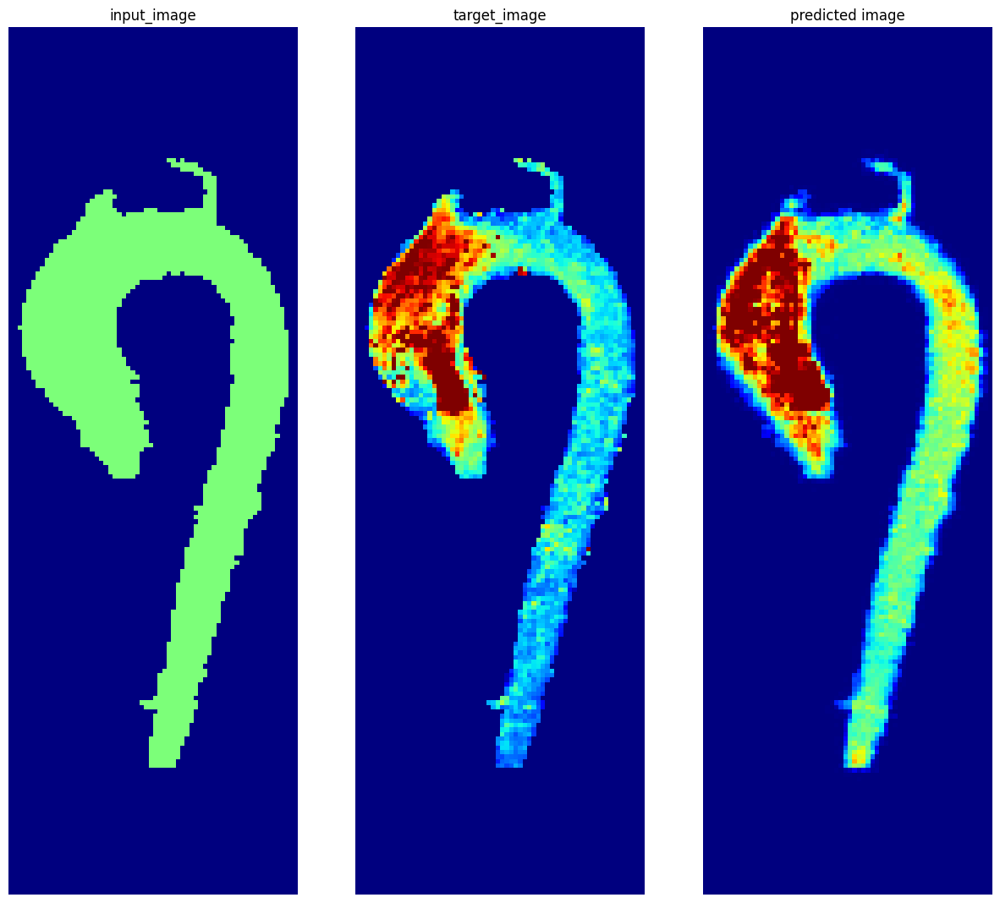

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 09:47:52.793526: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 855 of 909
2023-01-05 09:47:53.376452: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:49,  7.44it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.36it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:25,  7.29it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:59,  7.27it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.36it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:32,  7.29it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.39it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.37it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.81it/s]


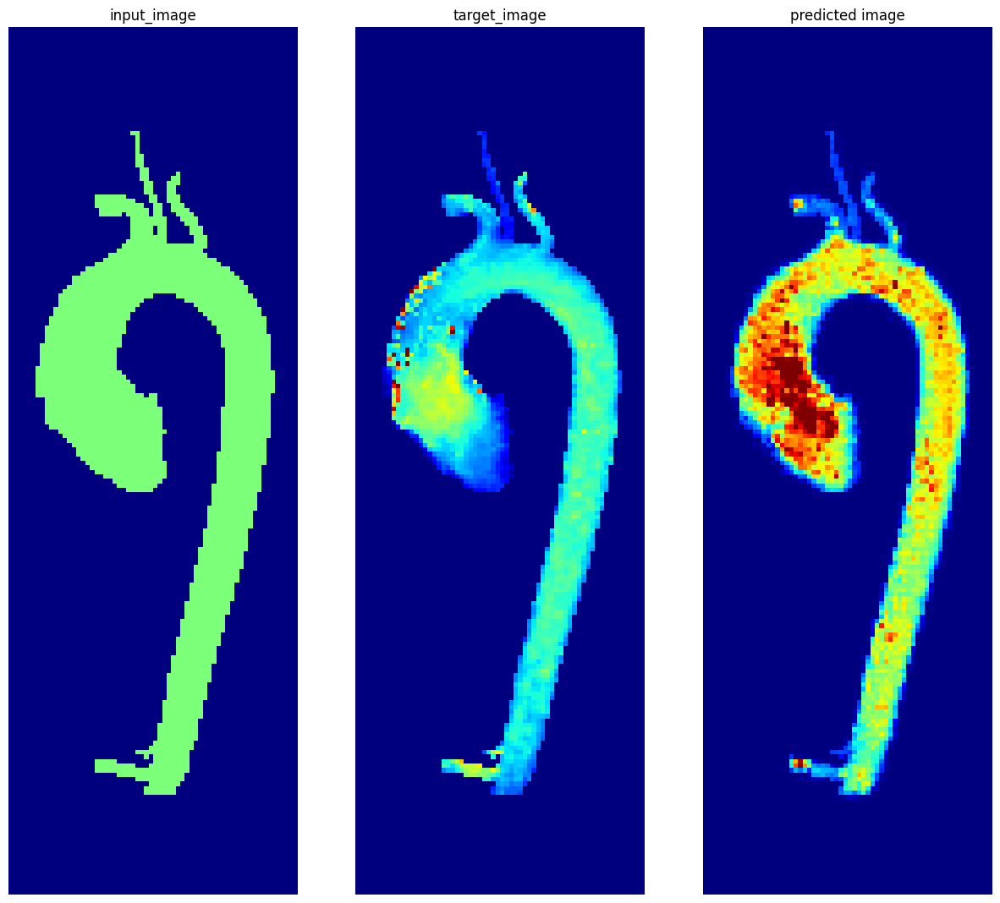

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 09:50:24.355498: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 886 of 909
2023-01-05 09:50:24.611003: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:49,  7.44it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.38it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:24,  7.36it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:01<01:11,  7.35it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.31it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.39it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.41it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.38it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.38it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.82it/s]


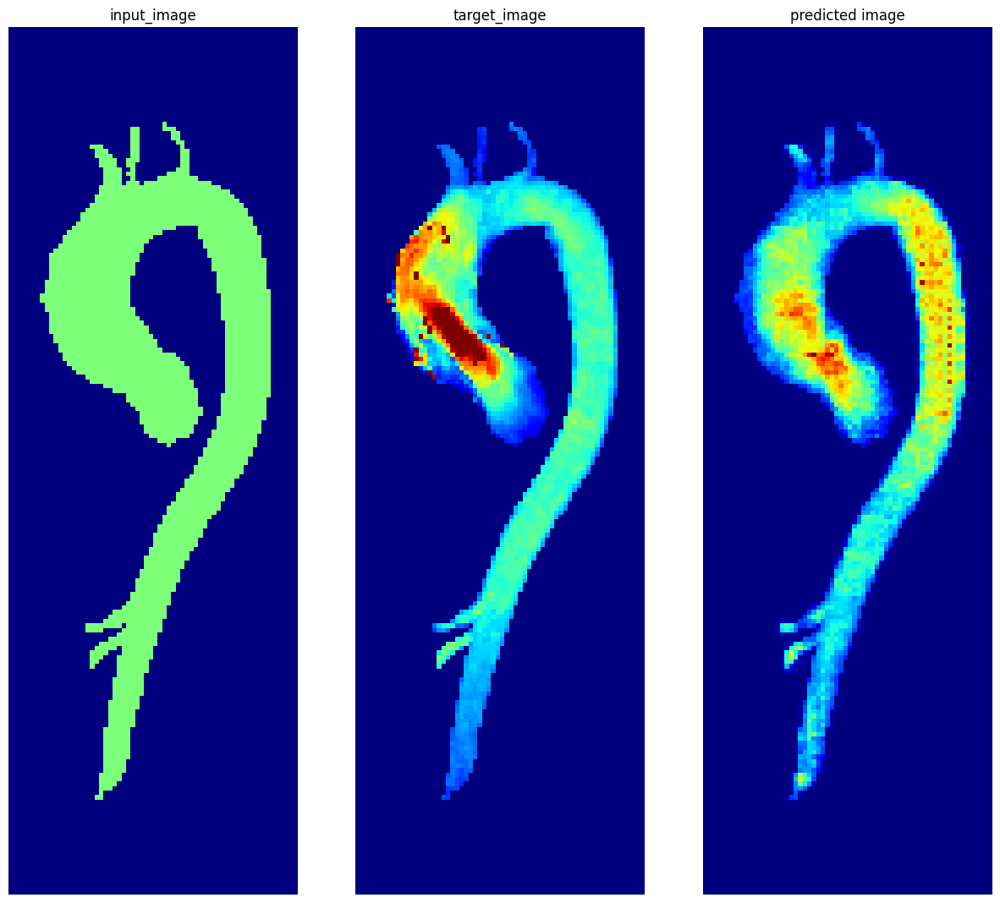

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 09:52:55.275671: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 846 of 909
2023-01-05 09:52:55.985844: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:50,  7.42it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.36it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:25,  7.30it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.37it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.47it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.38it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.37it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.80it/s]


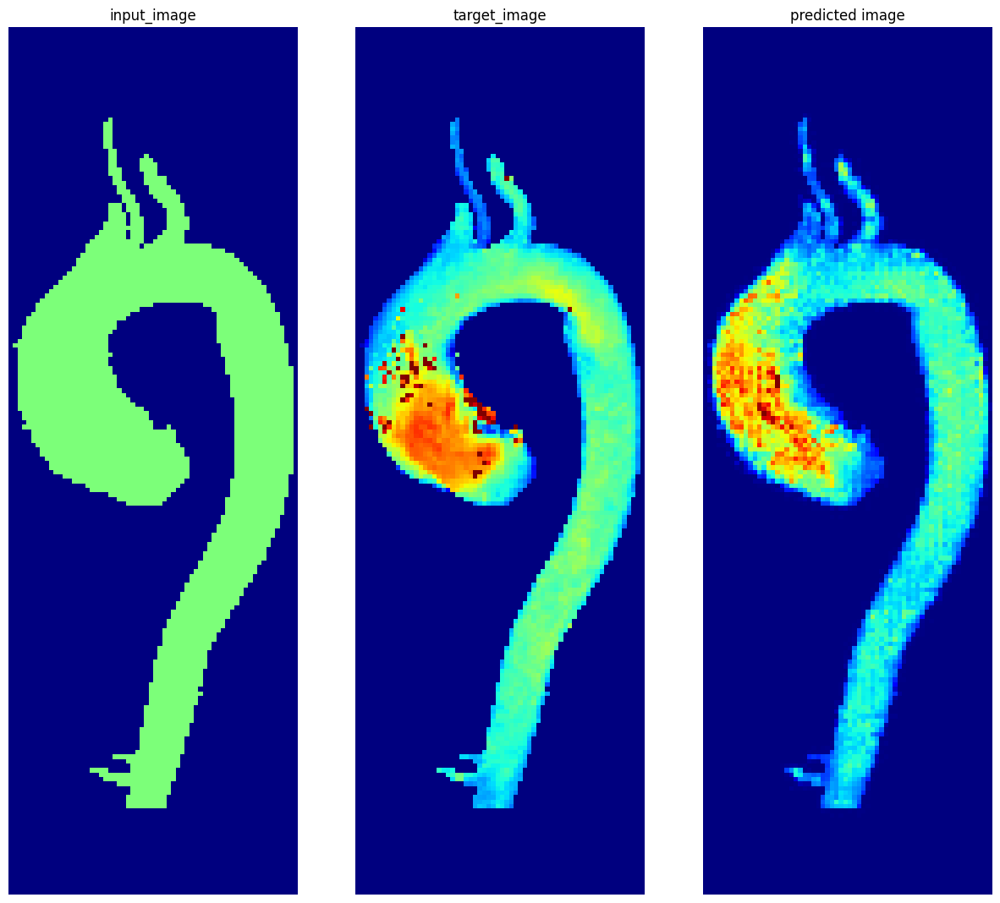

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 09:55:26.427721: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 827 of 909
2023-01-05 09:55:27.444293: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:50,  7.41it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.40it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.41it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:10,  7.43it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.39it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.36it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.32it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.36it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.79it/s]


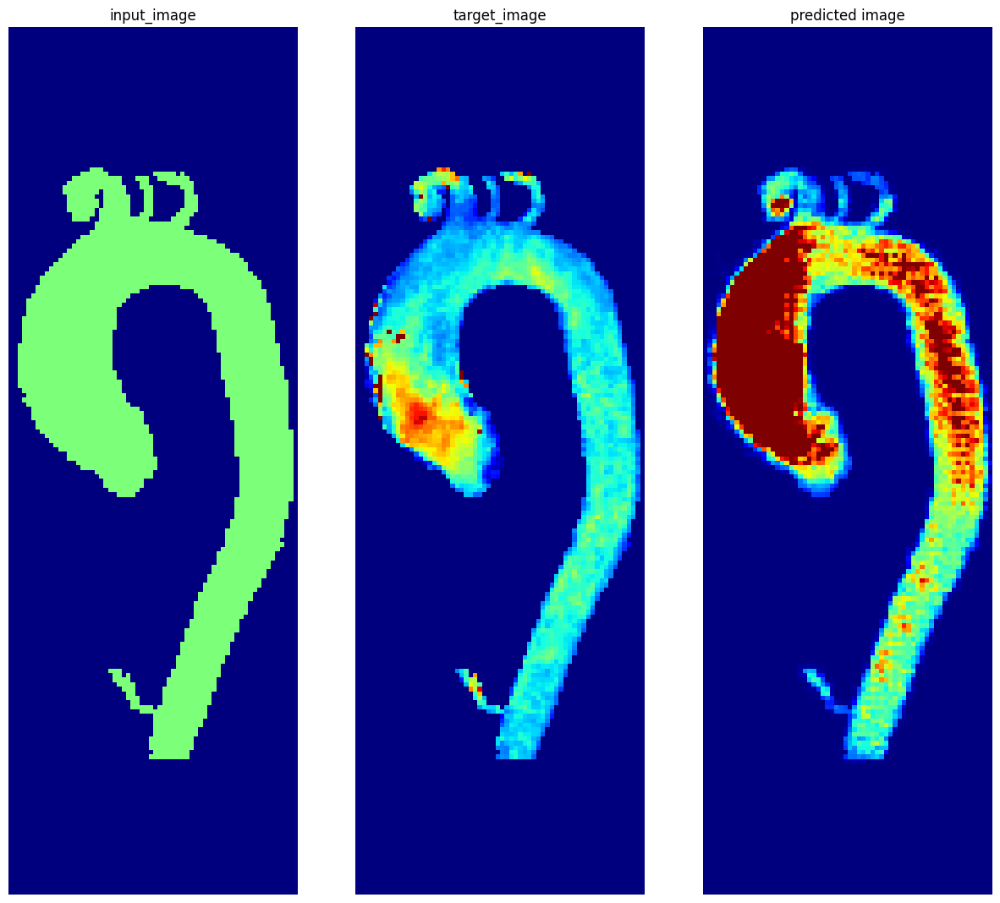

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 09:57:58.055778: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 834 of 909
2023-01-05 09:57:58.893338: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:50,  7.42it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.38it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.41it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.39it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.37it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.37it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.38it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.80it/s]


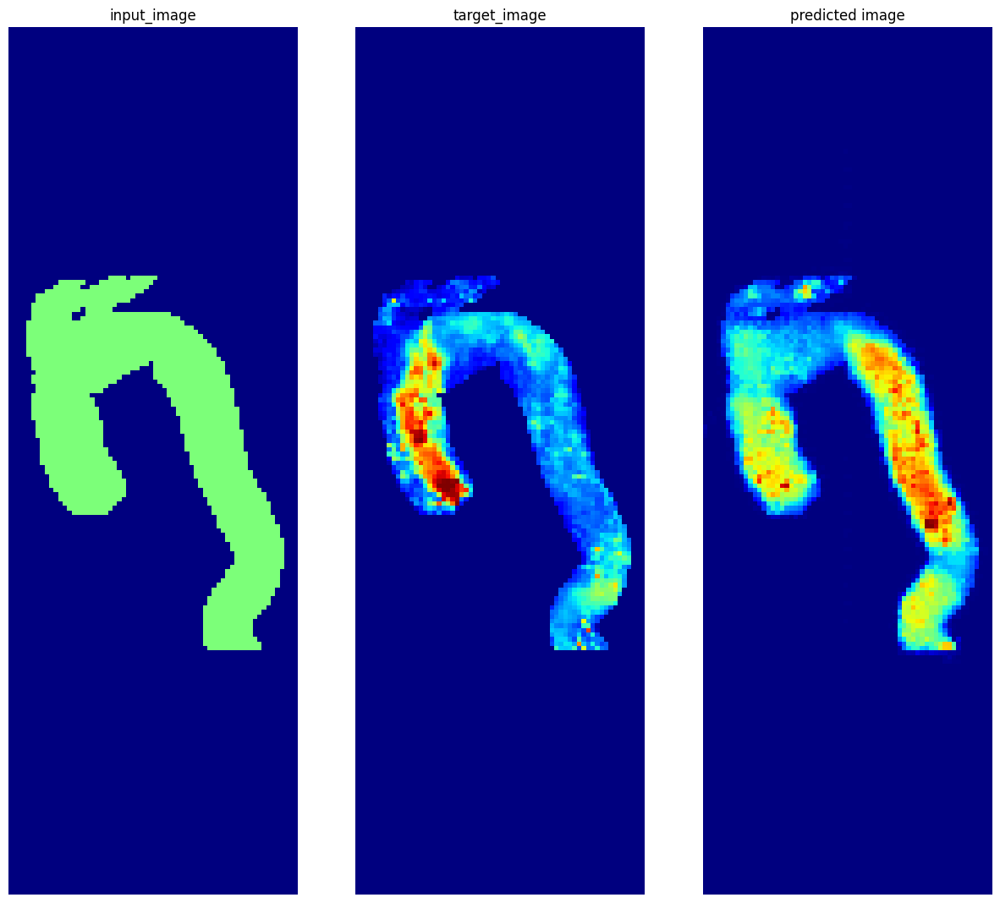

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 10:00:29.422894: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 835 of 909
2023-01-05 10:00:30.356666: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.43it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.41it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.40it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:12,  7.30it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:57,  7.41it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.39it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.38it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.38it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.79it/s]


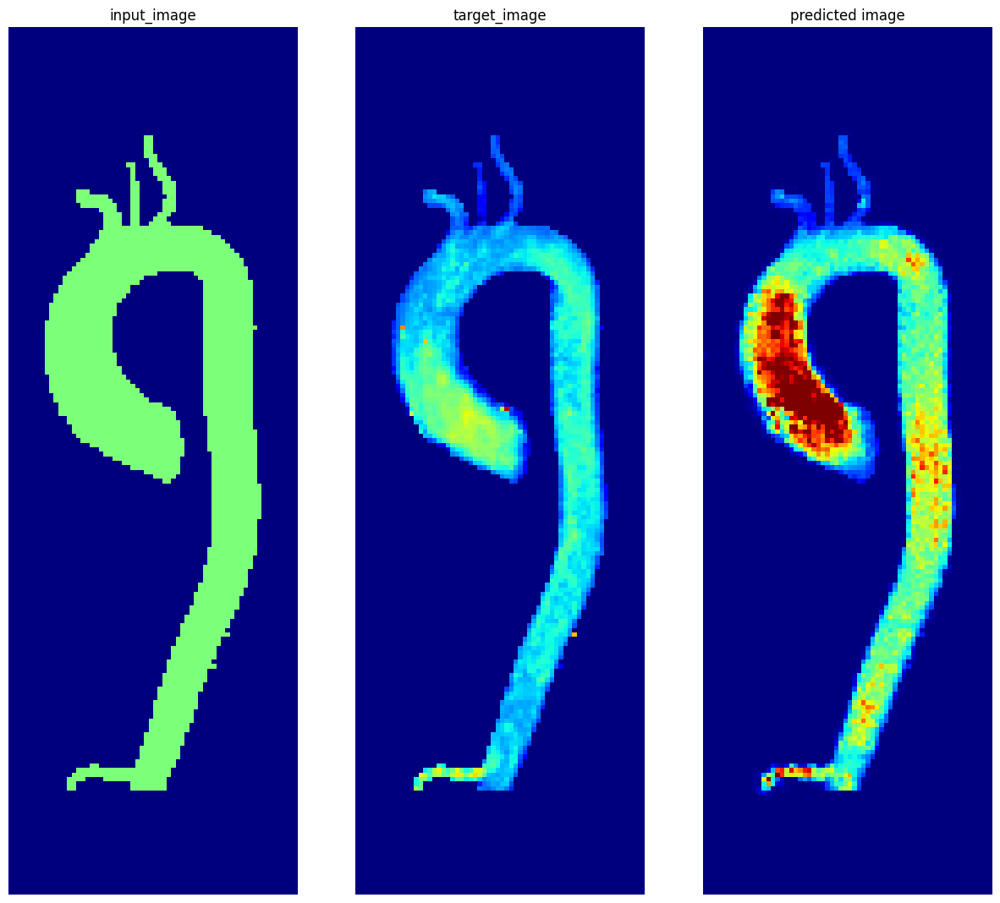

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 10:03:01.016908: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 809 of 909
2023-01-05 10:03:02.185645: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:50,  7.42it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.41it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.38it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:29<00:44,  7.39it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.38it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.42it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.37it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:14<00:00,  6.78it/s]


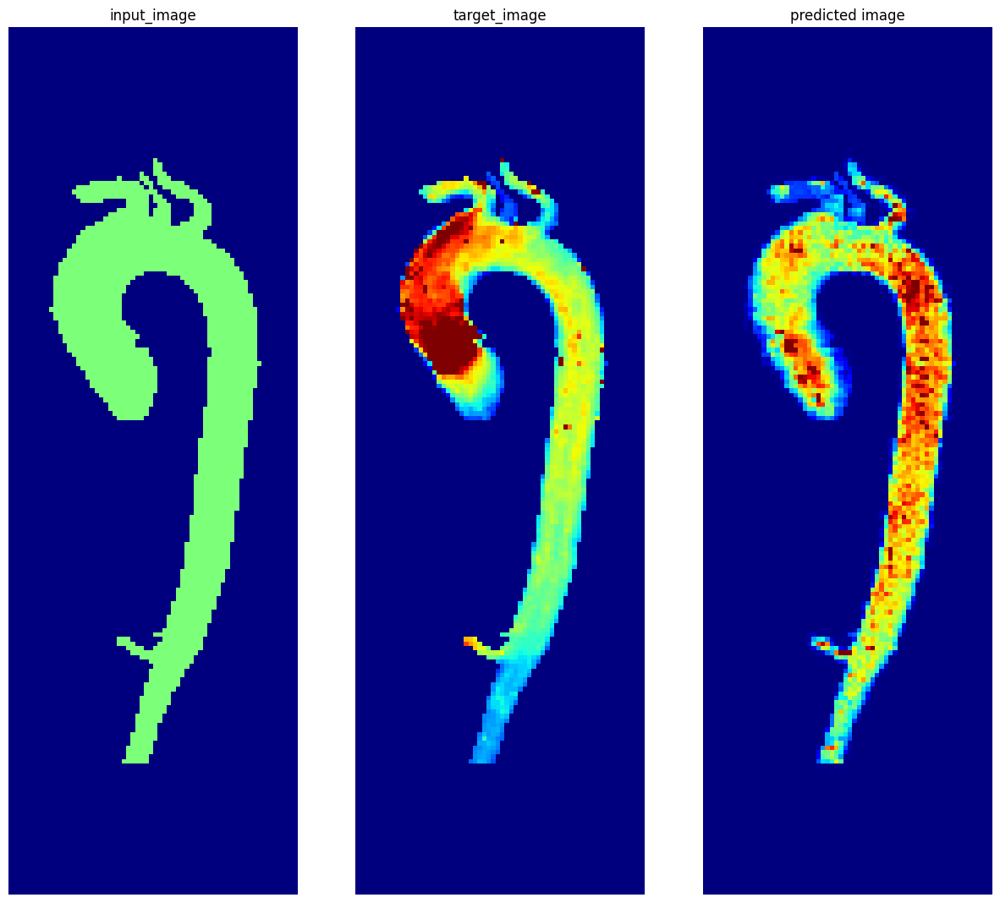

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 10:05:32.779304: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 815 of 909
2023-01-05 10:05:33.850381: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:50,  7.42it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.38it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.39it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:29<00:45,  7.37it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.39it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.35it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.37it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:14<00:00,  6.78it/s]


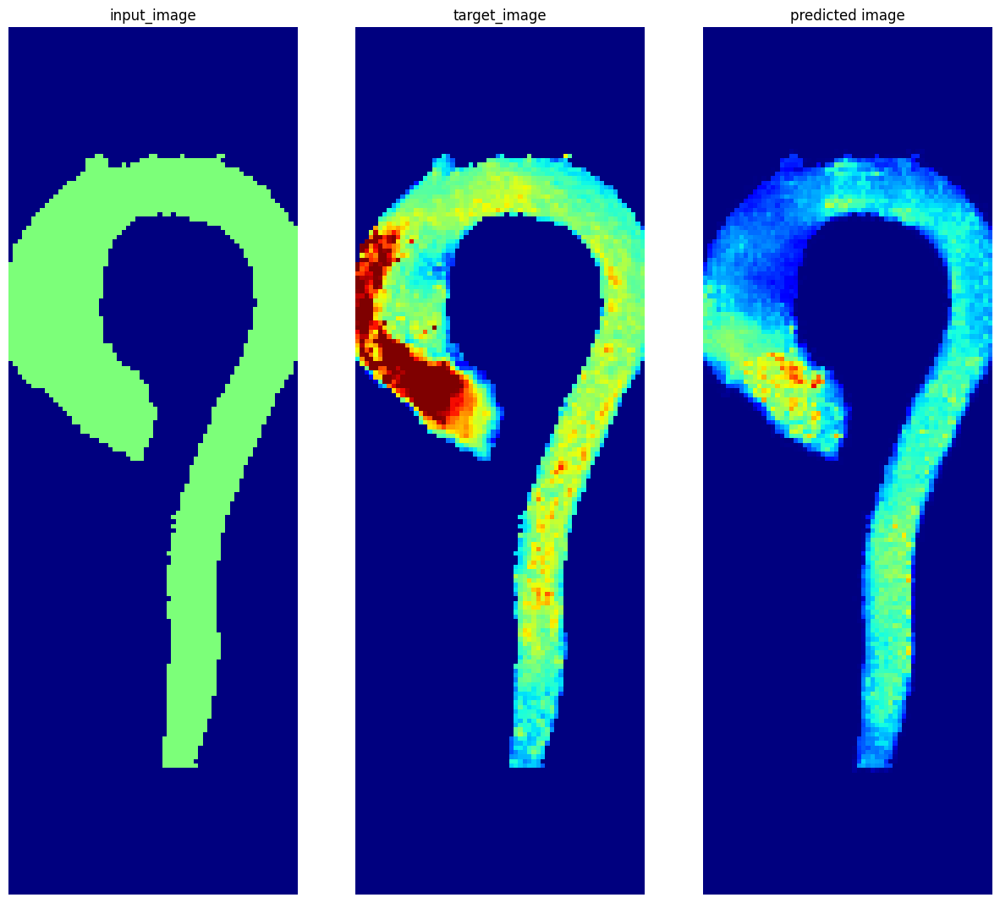

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 10:08:04.404715: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 796 of 909
2023-01-05 10:08:05.776767: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:50,  7.41it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.38it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.38it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:03<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:16<00:57,  7.44it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:29<00:45,  7.37it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.37it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.35it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.37it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:14<00:00,  6.77it/s]


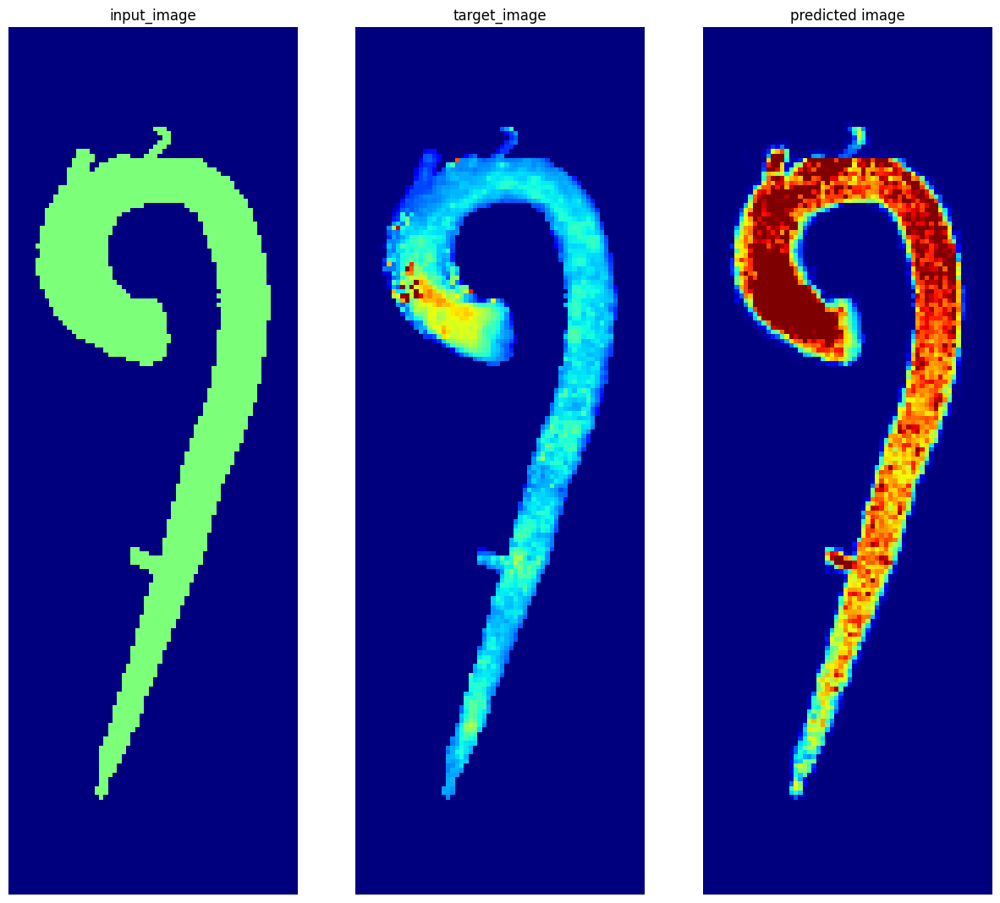

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 10:10:36.420820: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 885 of 909
2023-01-05 10:10:36.689833: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:50,  7.43it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.38it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:25,  7.28it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:01<01:11,  7.40it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.36it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.39it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.38it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:19,  7.25it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.37it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.82it/s]


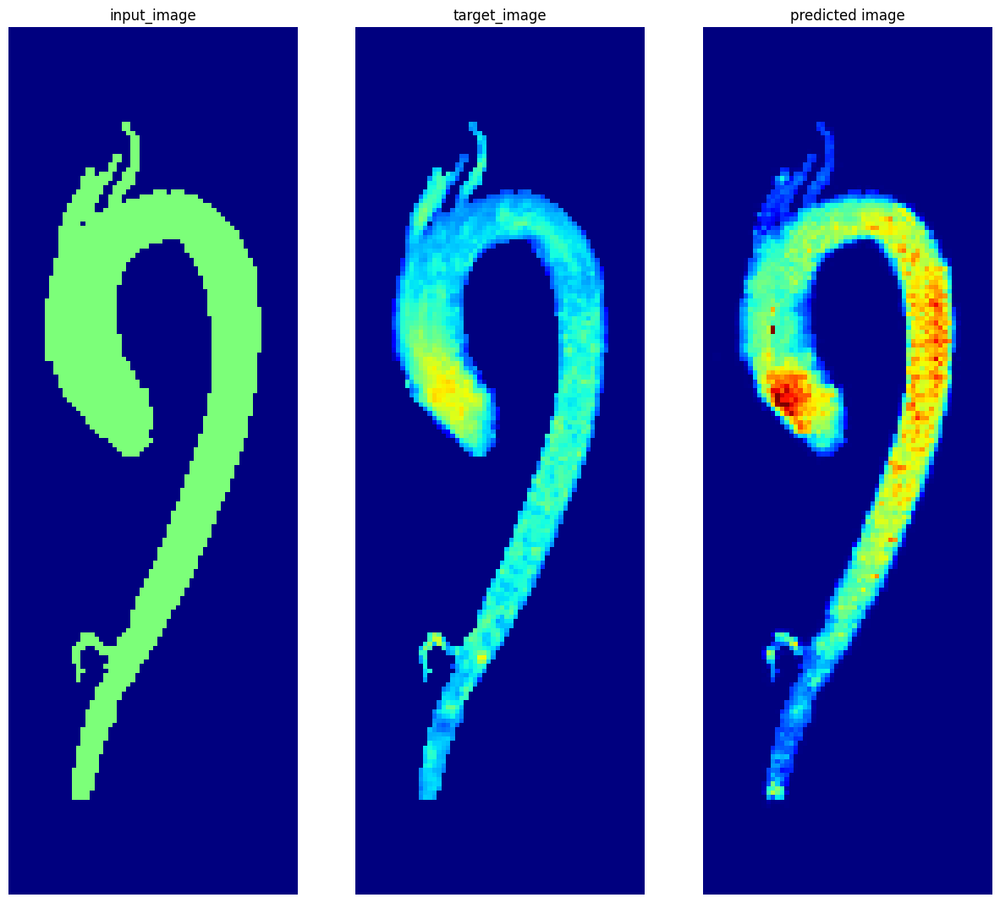

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 10:13:07.195490: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 835 of 909
2023-01-05 10:13:08.029636: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.44it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.35it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.40it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:10,  7.41it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.37it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.38it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.40it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.79it/s]


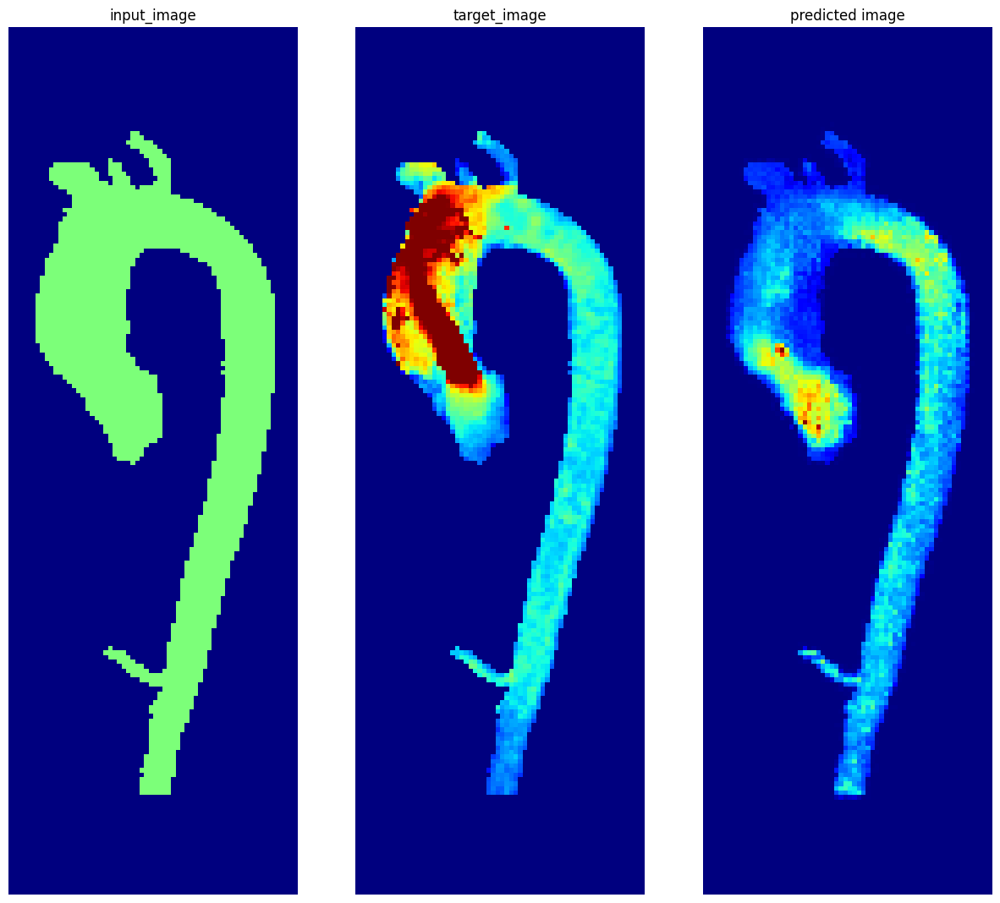

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 10:15:39.608102: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 818 of 909
2023-01-05 10:15:40.869532: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.44it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.40it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.39it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.41it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:16<00:58,  7.37it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:29<00:44,  7.39it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.39it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.37it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.38it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:14<00:00,  6.77it/s]


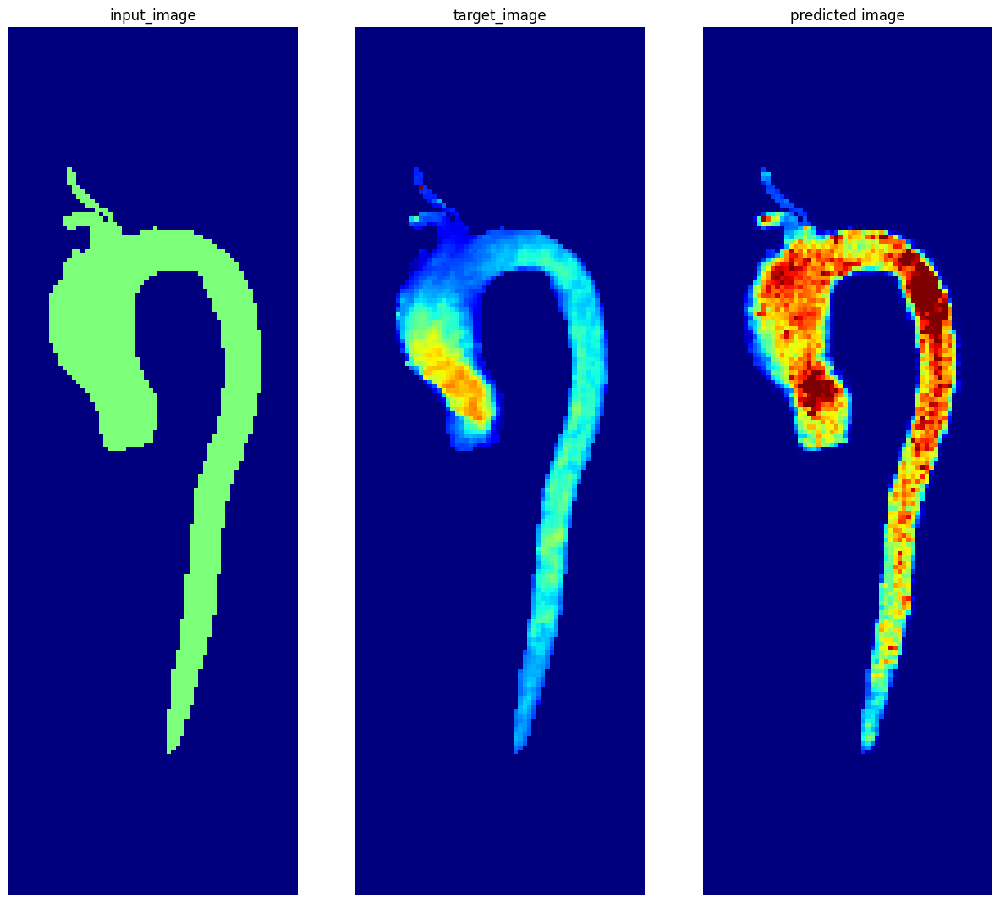

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 10:18:11.722959: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 812 of 909
2023-01-05 10:18:12.859369: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:50,  7.42it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.41it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:23,  7.44it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.37it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:29<00:44,  7.39it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.38it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.39it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.30it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:14<00:00,  6.78it/s]


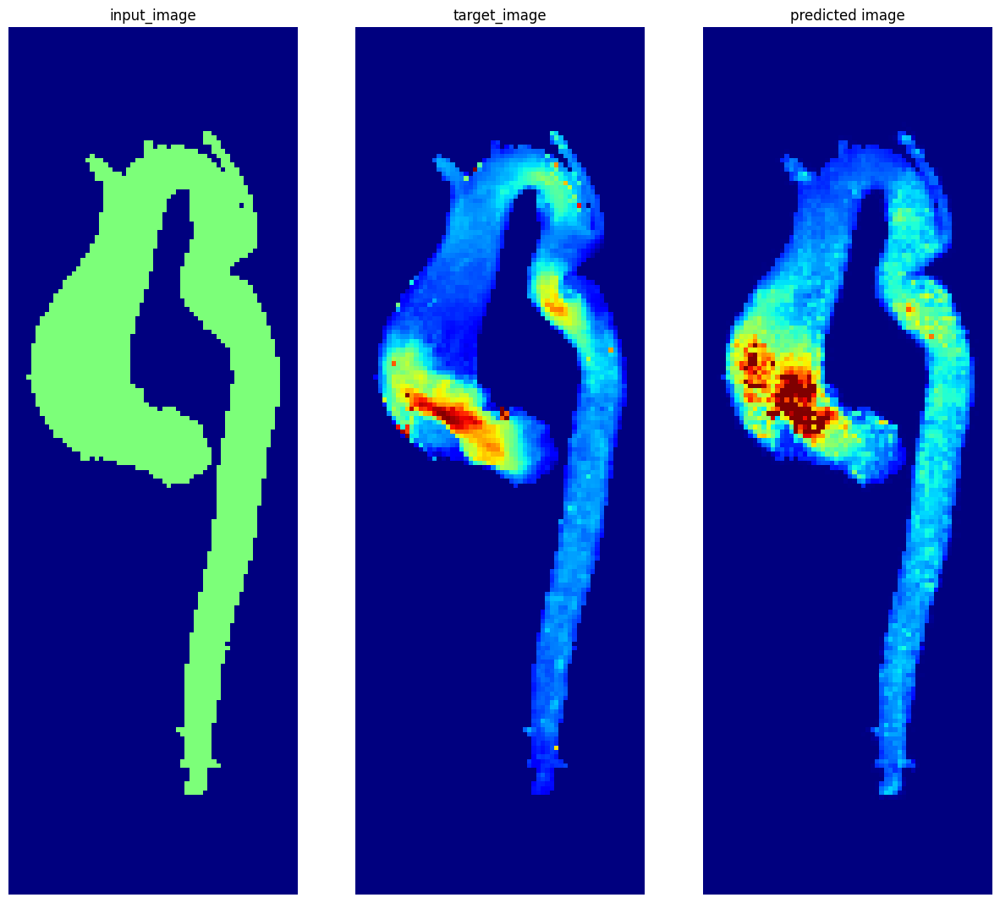

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 10:20:44.573562: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 805 of 909
2023-01-05 10:20:45.866289: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:50,  7.42it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.42it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.38it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.35it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:16<00:58,  7.39it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:29<00:44,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.40it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.40it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.39it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:14<00:00,  6.77it/s]


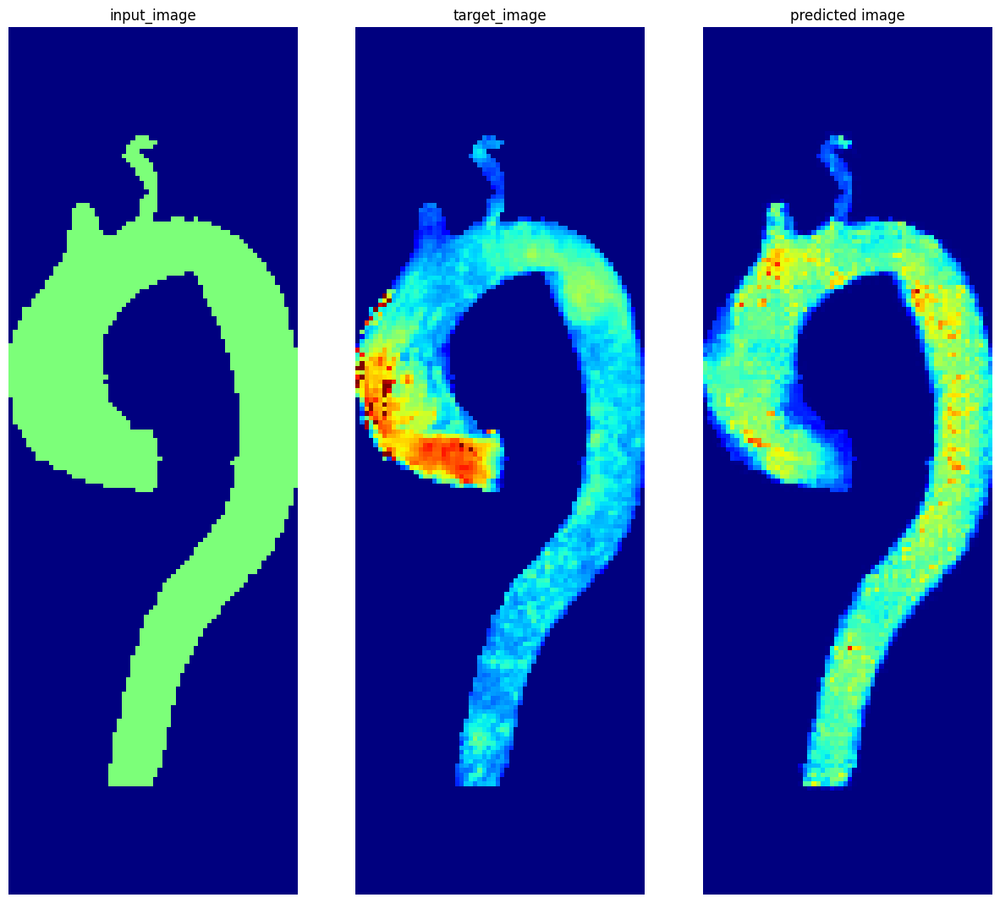

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 10:23:16.564633: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 901 of 909
2023-01-05 10:23:16.656427: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:49,  7.43it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.38it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:24,  7.39it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:01<01:11,  7.39it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:14<00:58,  7.37it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.35it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.37it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.37it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.83it/s]


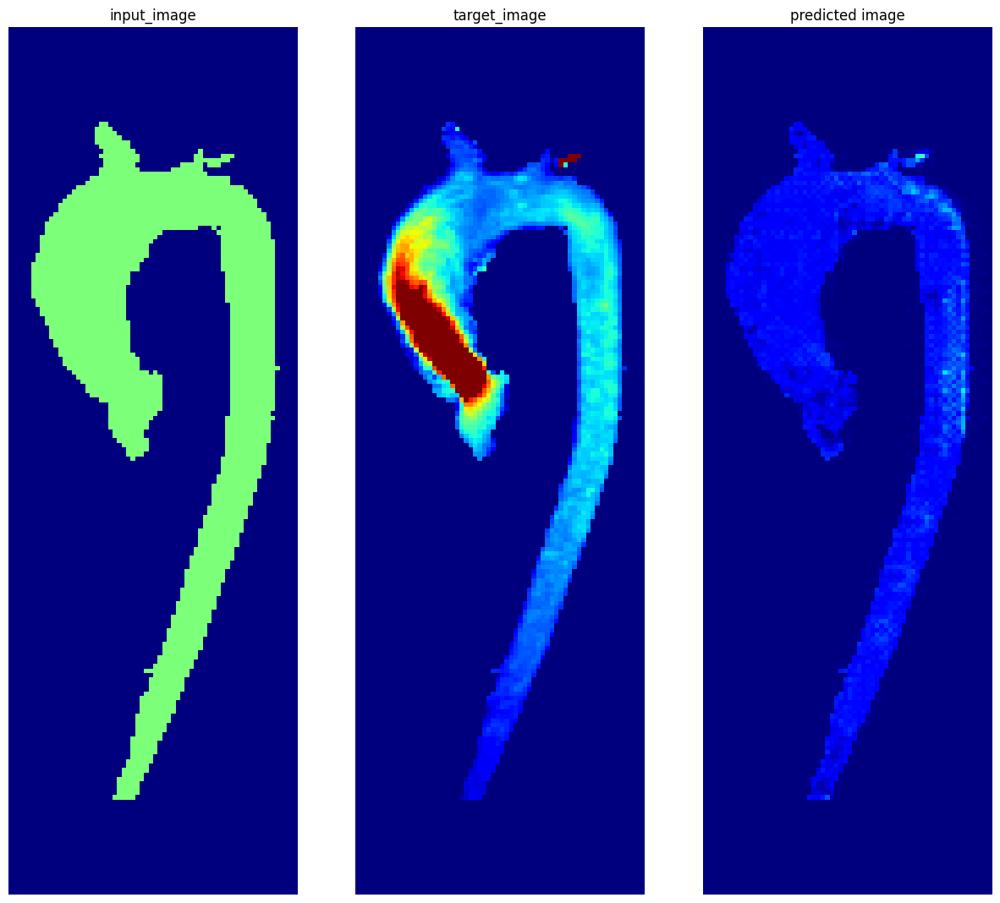

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 10:25:46.292711: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 848 of 909
2023-01-05 10:25:47.063116: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.44it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.37it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.39it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.36it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.28it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.43it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.80it/s]


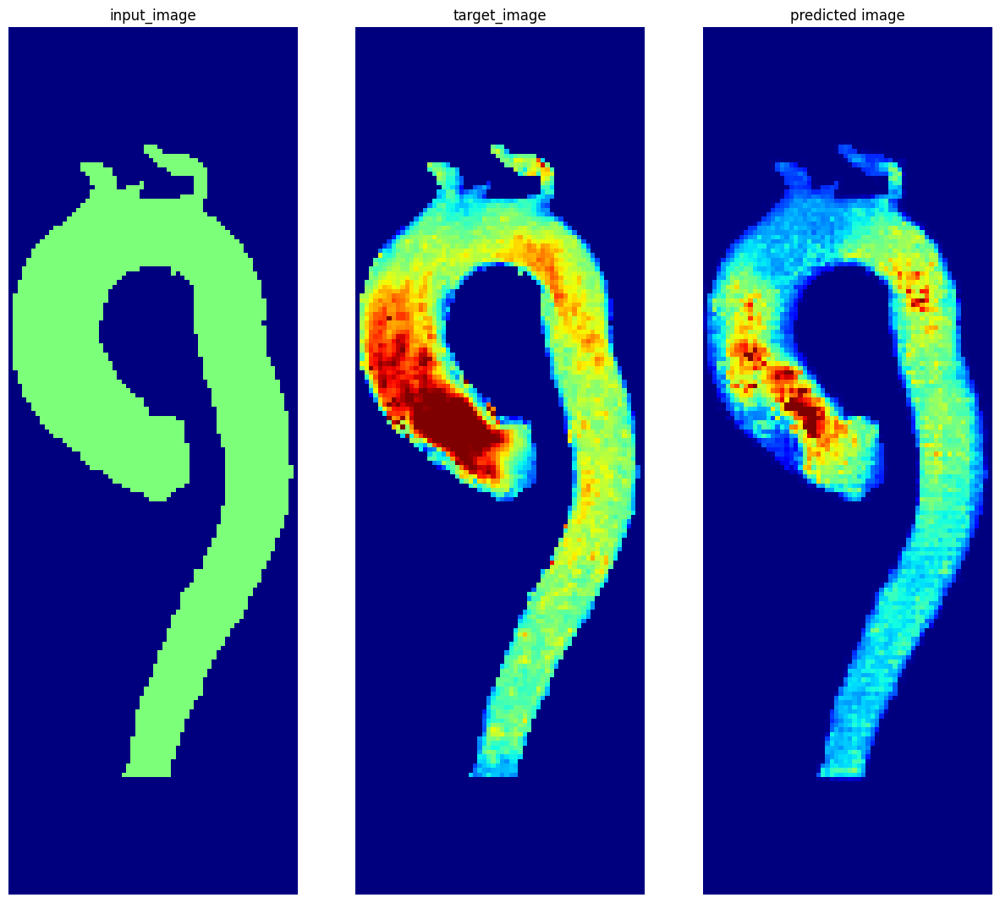

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 10:28:17.681652: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 865 of 909
2023-01-05 10:28:18.169671: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:51,  7.34it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.40it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:24,  7.37it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.39it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.39it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.38it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.37it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.37it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.81it/s]


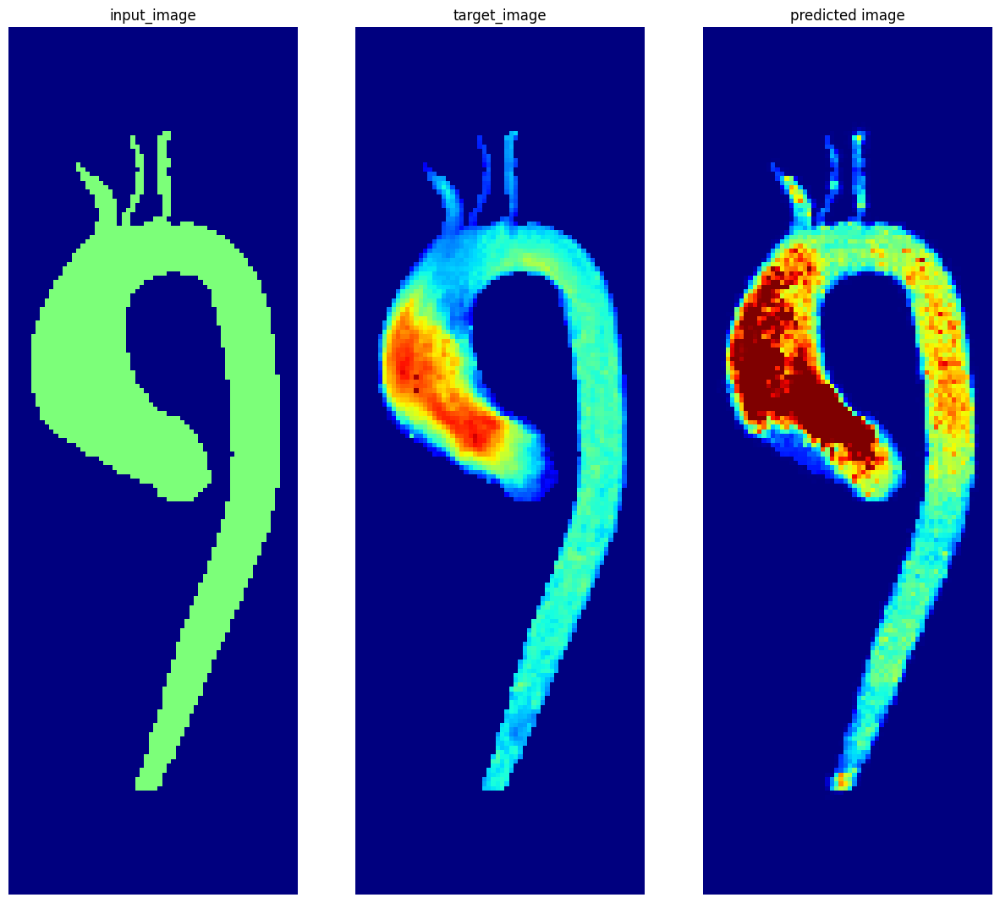

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 10:30:48.008406: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 888 of 909
2023-01-05 10:30:48.236144: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:50,  7.43it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.41it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:24,  7.35it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:01<01:11,  7.40it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:14<00:57,  7.42it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.40it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.37it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.37it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.35it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.83it/s]


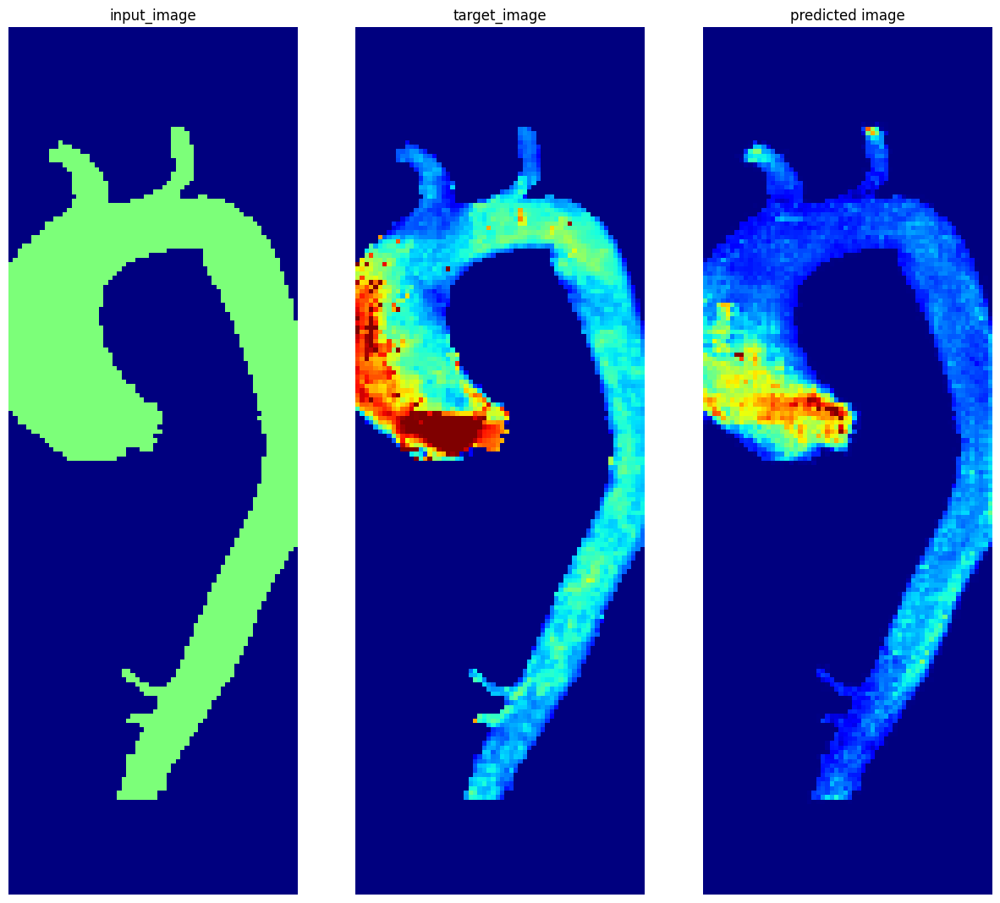

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 10:33:20.712021: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 878 of 909
2023-01-05 10:33:21.091068: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:50,  7.42it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.40it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:24,  7.35it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.33it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.41it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.34it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.38it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.36it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.82it/s]


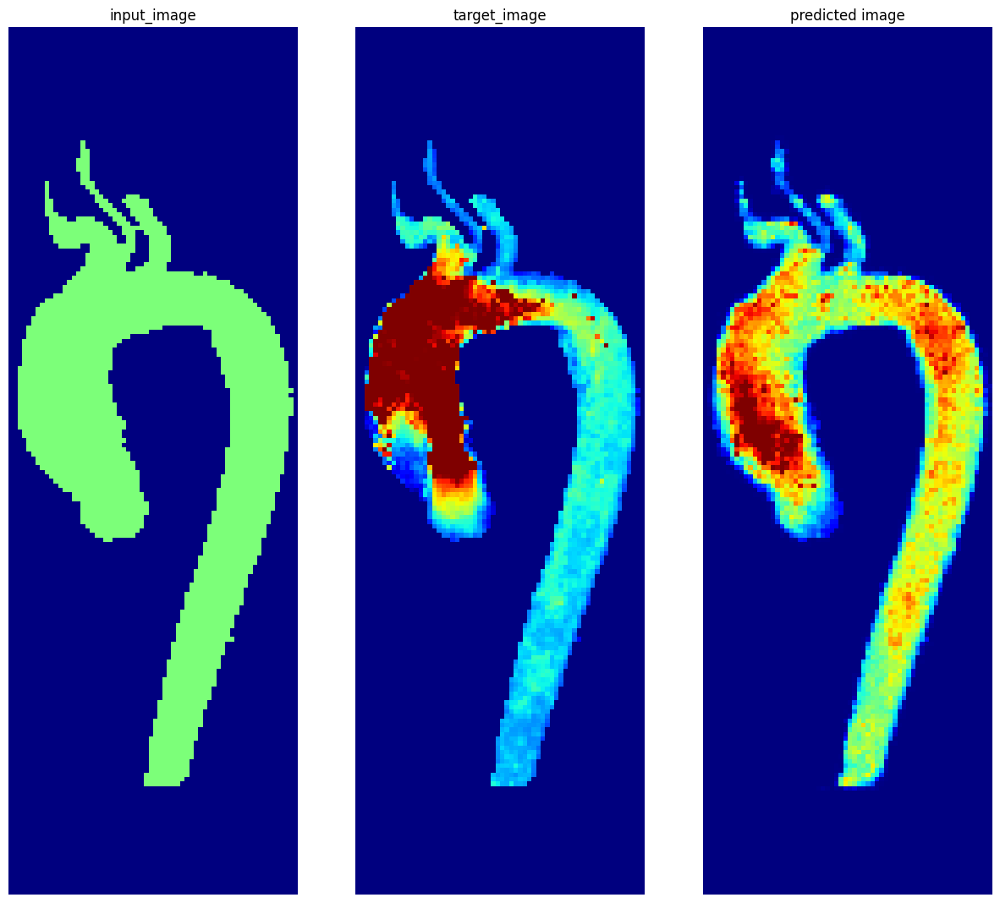

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 10:35:51.602974: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 841 of 909
2023-01-05 10:35:52.409342: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.44it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:36,  7.44it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.40it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:10,  7.42it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.30it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.43it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.33it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.38it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.79it/s]


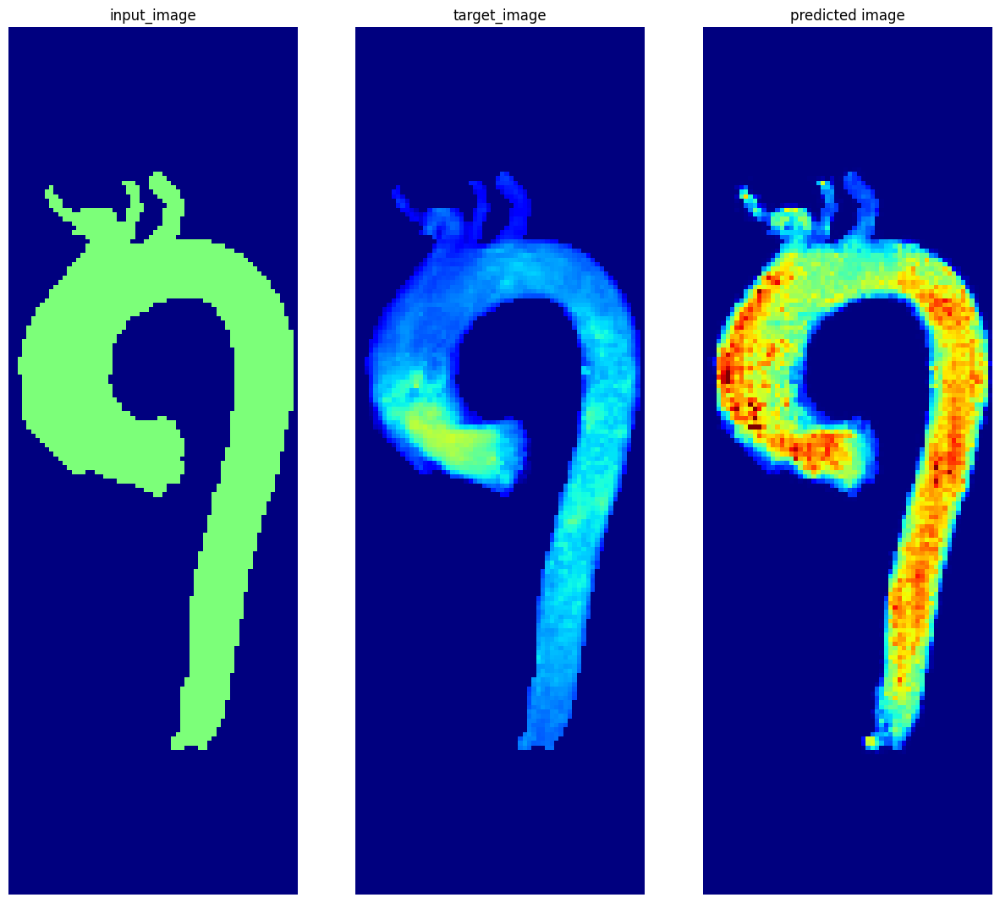

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 10:38:23.122319: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 897 of 909
2023-01-05 10:38:23.231316: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:49,  7.44it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.40it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:24,  7.40it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:01<01:11,  7.36it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:14<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.34it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.38it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.32it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.37it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.83it/s]


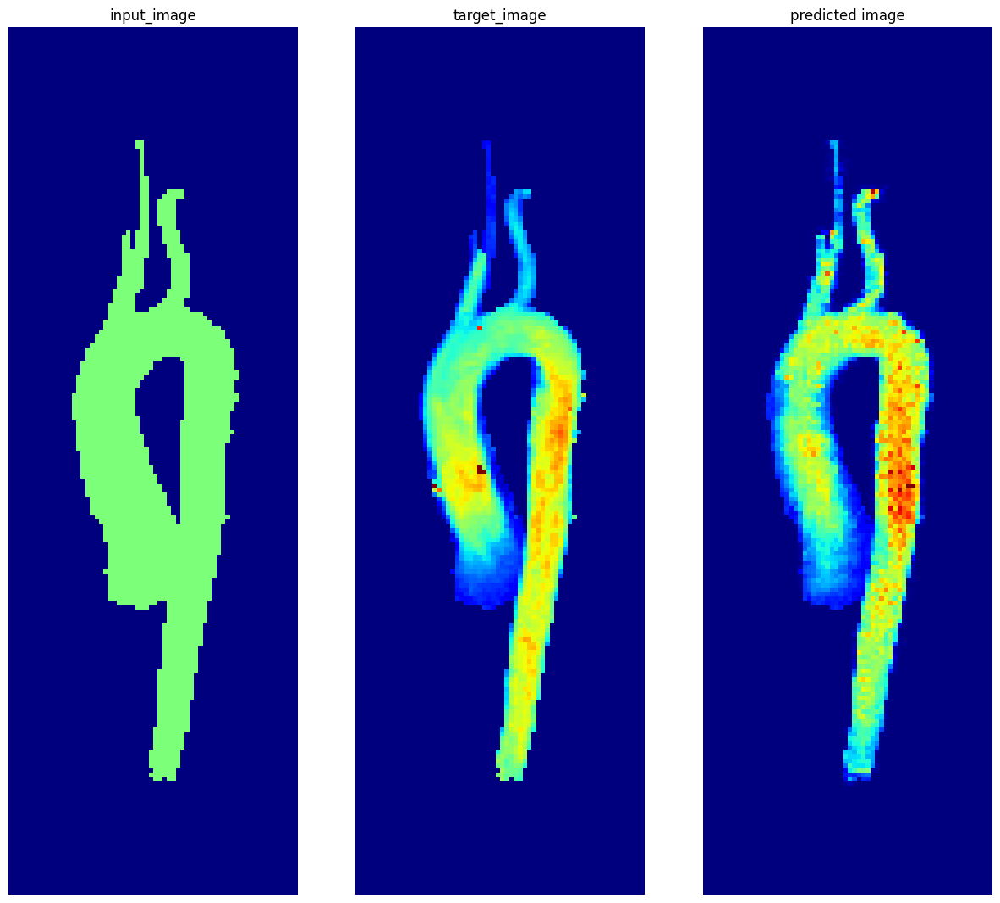

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 10:40:53.023398: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 870 of 909
2023-01-05 10:40:53.523787: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:50,  7.42it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.41it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:24,  7.40it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.37it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:57,  7.41it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.41it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.38it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.38it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.37it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.81it/s]


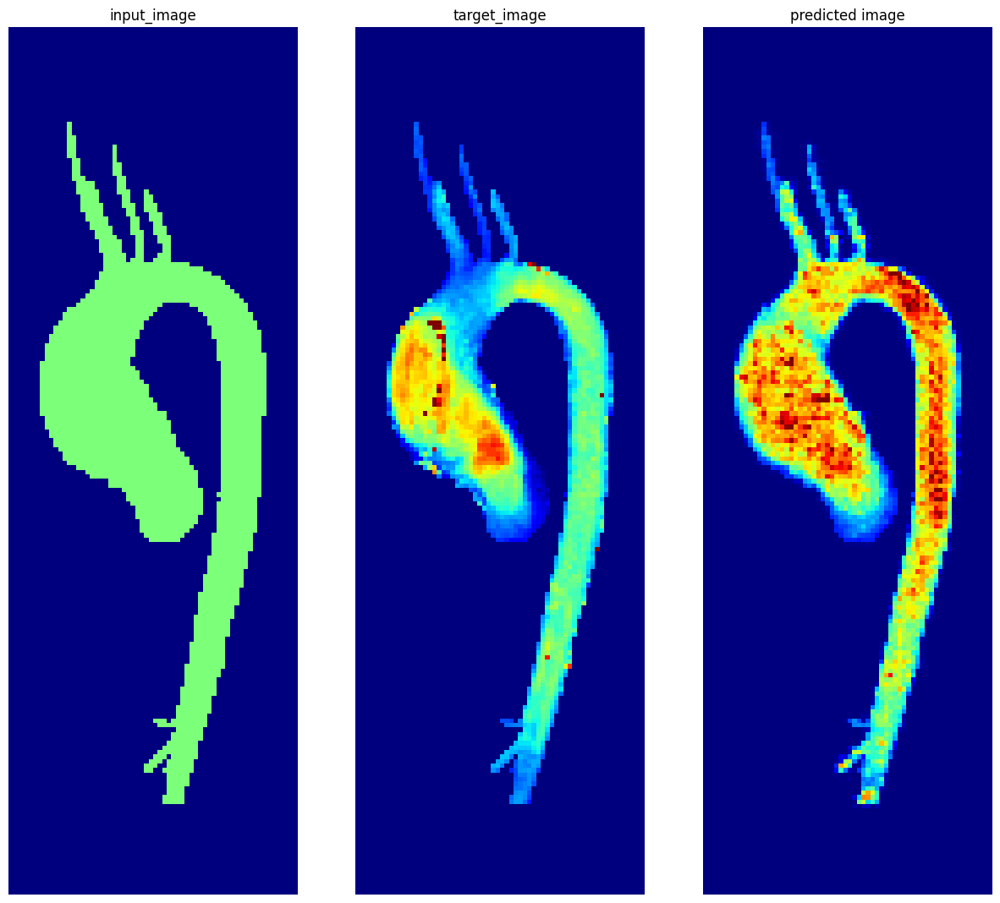

Inner Epoch:  10%|███                          | 95/909 [00:22<01:49,  7.42it/s]


Inner Epoch:  21%|█████▉                      | 192/909 [00:35<01:37,  7.37it/s]


Inner Epoch:  32%|████████▉                   | 289/909 [00:48<01:24,  7.36it/s]


Inner Epoch:  42%|███████████▉                | 386/909 [01:01<01:10,  7.38it/s]


Inner Epoch:  53%|██████████████▉             | 483/909 [01:14<00:57,  7.36it/s]


Inner Epoch:  64%|█████████████████▊          | 580/909 [01:28<00:44,  7.37it/s]


Inner Epoch:  74%|████████████████████▊       | 677/909 [01:41<00:31,  7.38it/s]


Inner Epoch:  85%|███████████████████████▊    | 774/909 [01:54<00:18,  7.34it/s]


Inner Epoch:  96%|██████████████████████████▊ | 871/909 [02:07<00:05,  7.38it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:12<00:00,  6.85it/s]


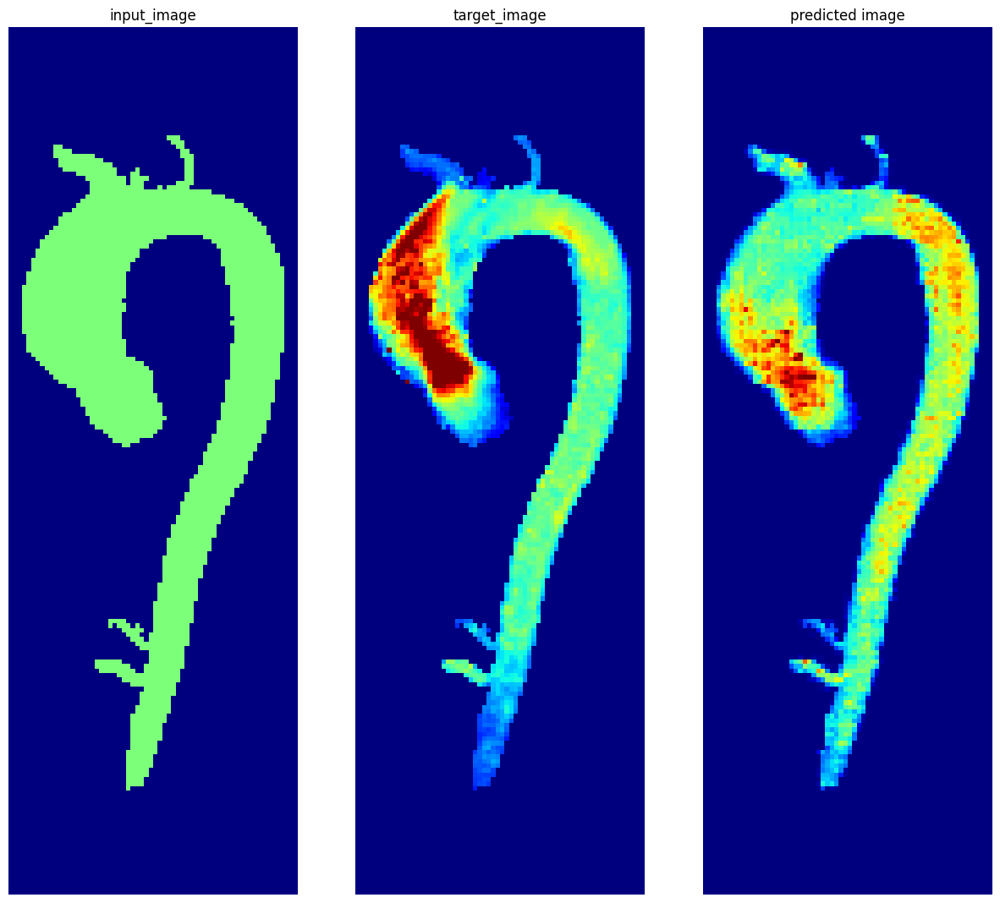

Inner Epoch:  10%|███                          | 95/909 [00:22<01:49,  7.44it/s]


Inner Epoch:  21%|█████▉                      | 192/909 [00:35<01:38,  7.32it/s]


Inner Epoch:  32%|████████▉                   | 289/909 [00:48<01:24,  7.31it/s]


Inner Epoch:  42%|███████████▉                | 386/909 [01:01<01:10,  7.40it/s]


Inner Epoch:  53%|██████████████▉             | 483/909 [01:14<00:57,  7.38it/s]


Inner Epoch:  64%|█████████████████▊          | 580/909 [01:27<00:44,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 677/909 [01:40<00:31,  7.41it/s]


Inner Epoch:  85%|███████████████████████▊    | 774/909 [01:54<00:18,  7.37it/s]


Inner Epoch:  96%|██████████████████████████▊ | 871/909 [02:07<00:05,  7.38it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:12<00:00,  6.87it/s]


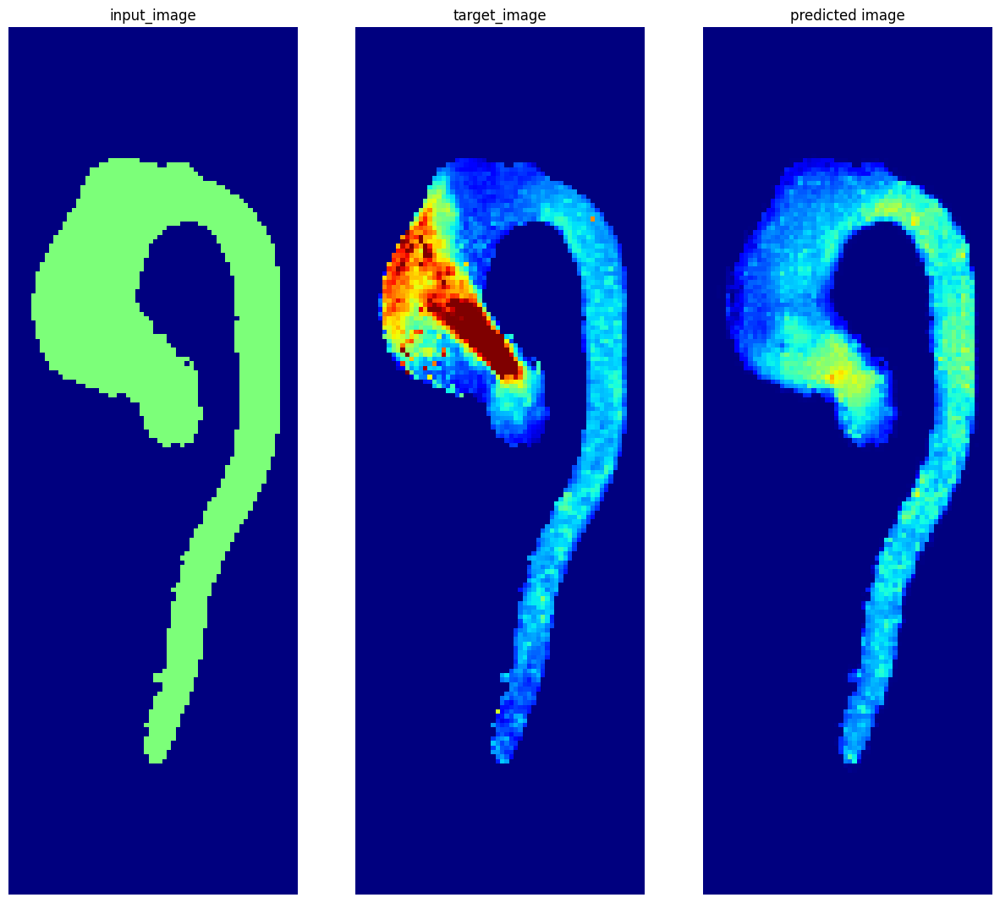

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 10:48:24.504464: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 831 of 909
2023-01-05 10:48:25.421463: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.44it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.41it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.38it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.37it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.37it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.39it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.39it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.79it/s]


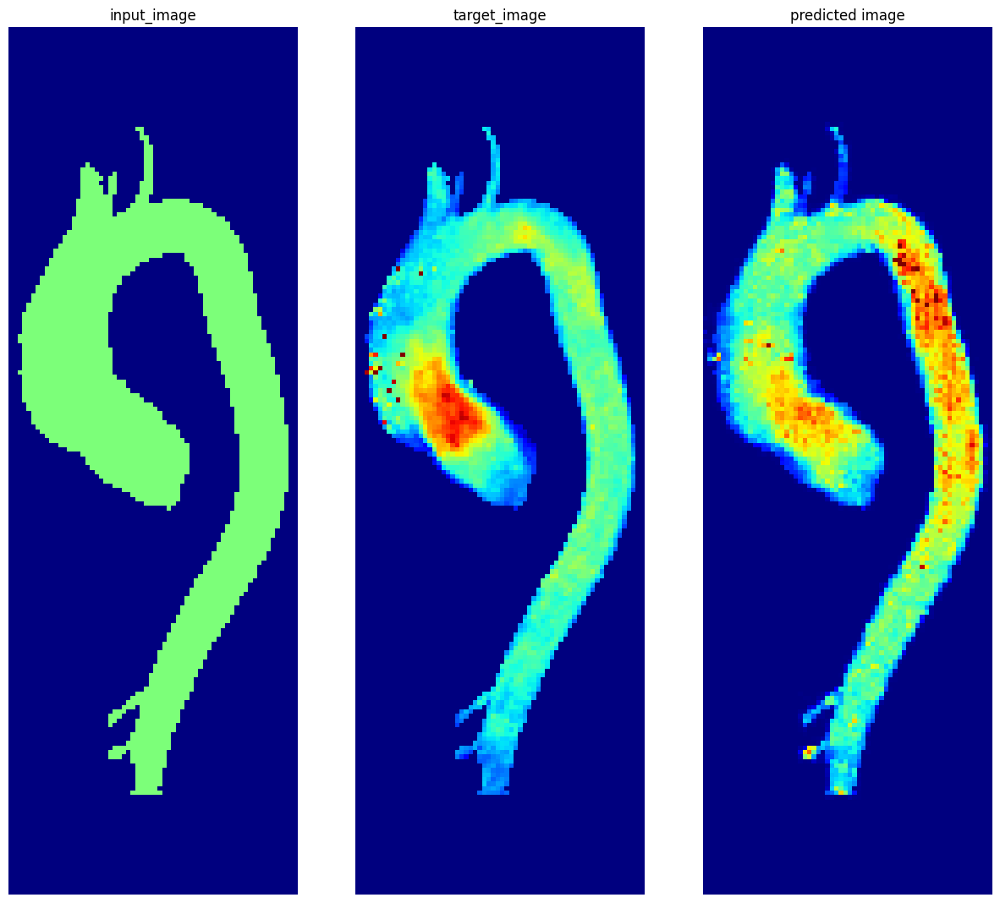

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 10:50:56.322387: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 850 of 909
2023-01-05 10:50:56.985875: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:49,  7.43it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.40it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.38it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.39it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:57,  7.40it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.34it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.38it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.39it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.80it/s]


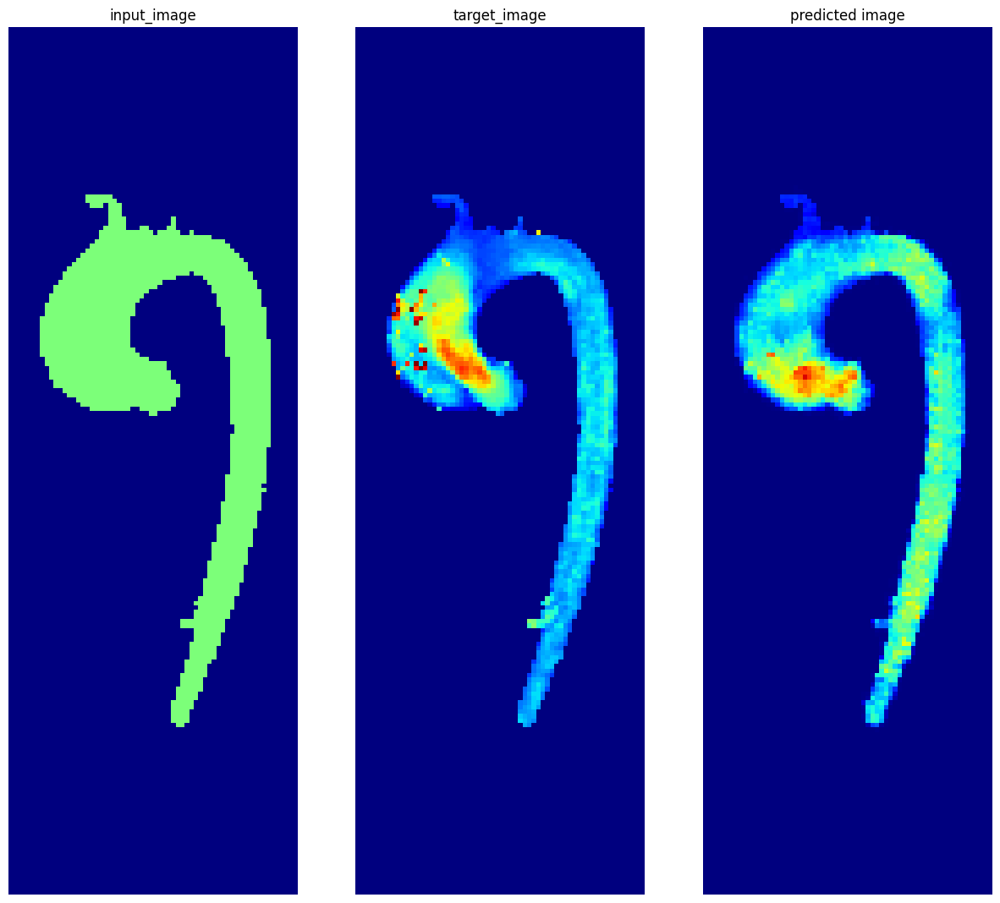

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 10:53:27.588456: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 886 of 909
2023-01-05 10:53:27.851311: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:49,  7.43it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.39it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:25,  7.30it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:01<01:11,  7.31it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.34it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.29it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.37it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.37it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.30it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.83it/s]


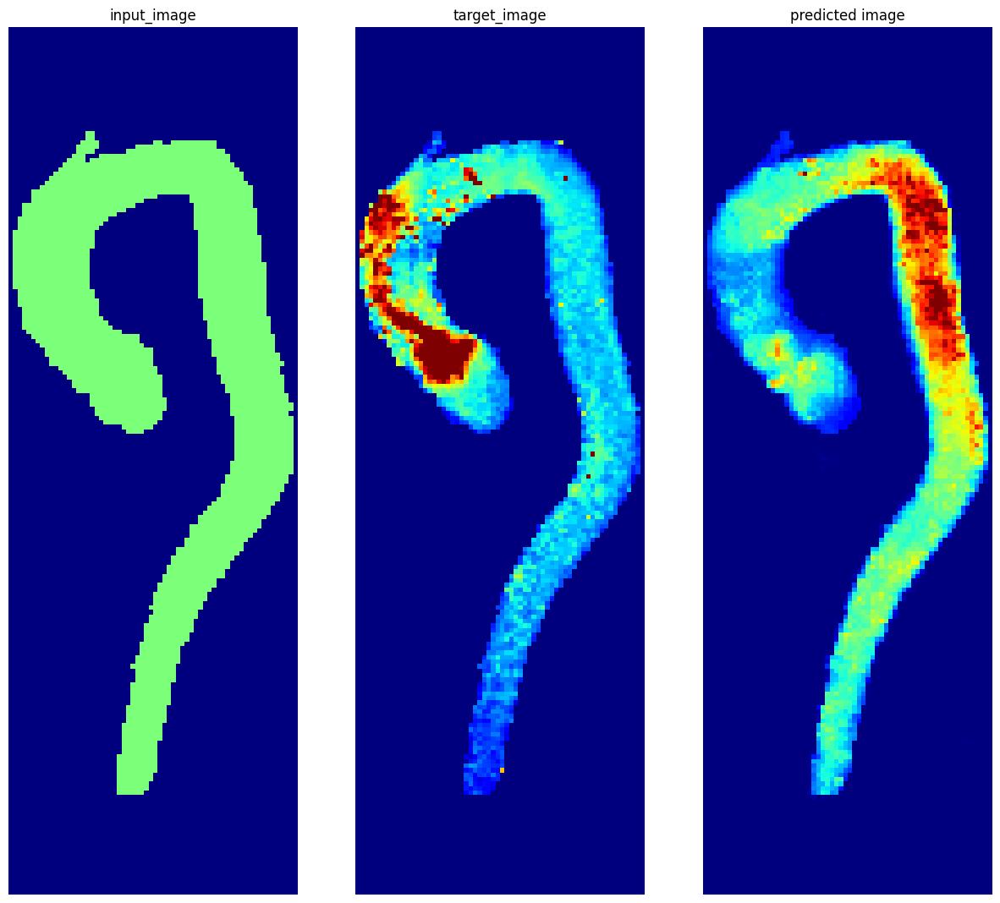

Inner Epoch:  10%|███                          | 95/909 [00:22<01:49,  7.42it/s]


Inner Epoch:  21%|█████▉                      | 192/909 [00:35<01:37,  7.36it/s]


Inner Epoch:  32%|████████▉                   | 289/909 [00:48<01:23,  7.39it/s]


Inner Epoch:  42%|███████████▉                | 386/909 [01:01<01:10,  7.40it/s]


Inner Epoch:  53%|██████████████▉             | 483/909 [01:14<00:57,  7.42it/s]


Inner Epoch:  64%|█████████████████▊          | 580/909 [01:28<00:44,  7.36it/s]


Inner Epoch:  74%|████████████████████▊       | 677/909 [01:41<00:31,  7.36it/s]


Inner Epoch:  85%|███████████████████████▊    | 774/909 [01:54<00:18,  7.38it/s]


Inner Epoch:  96%|██████████████████████████▊ | 871/909 [02:07<00:05,  7.38it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:12<00:00,  6.85it/s]


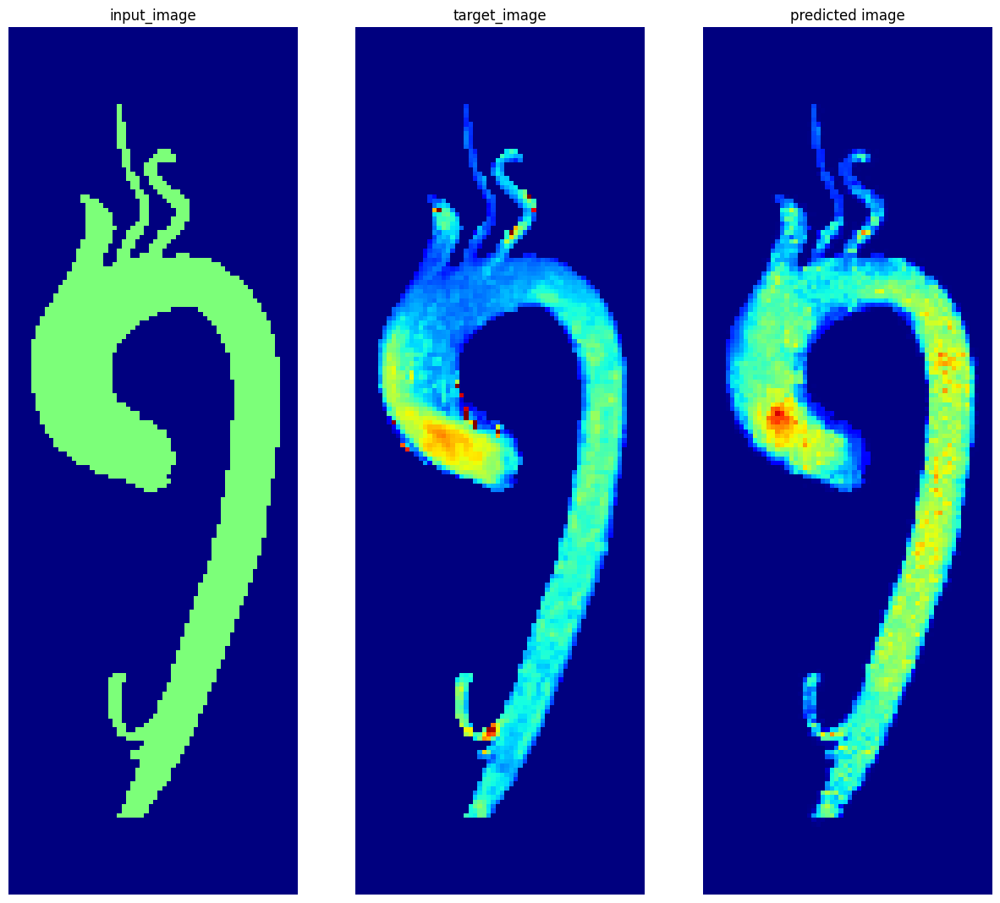

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 10:58:29.563017: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 836 of 909
2023-01-05 10:58:30.395194: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.44it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.39it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.39it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.39it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.37it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.37it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.39it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.37it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.37it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.79it/s]


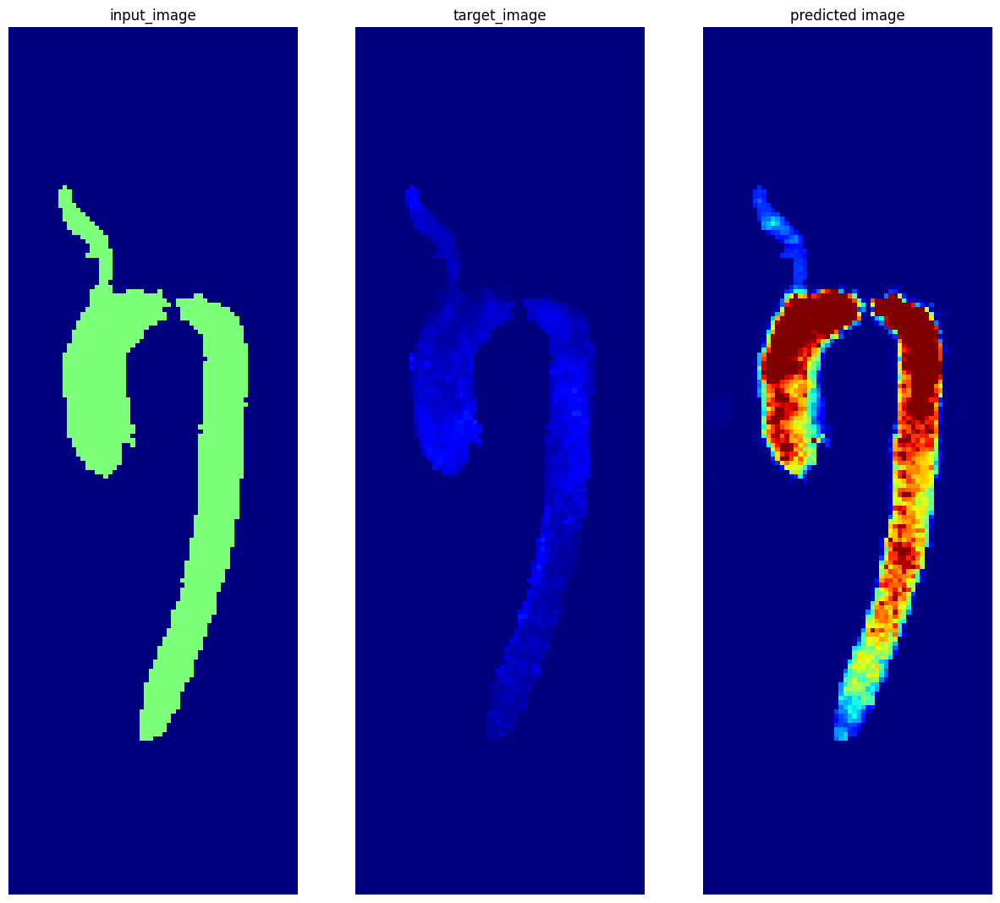

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 11:01:00.915027: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 892 of 909
2023-01-05 11:01:01.141322: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:49,  7.43it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:38,  7.34it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:24,  7.41it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:01<01:11,  7.39it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.33it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.36it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.39it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.38it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.40it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.83it/s]


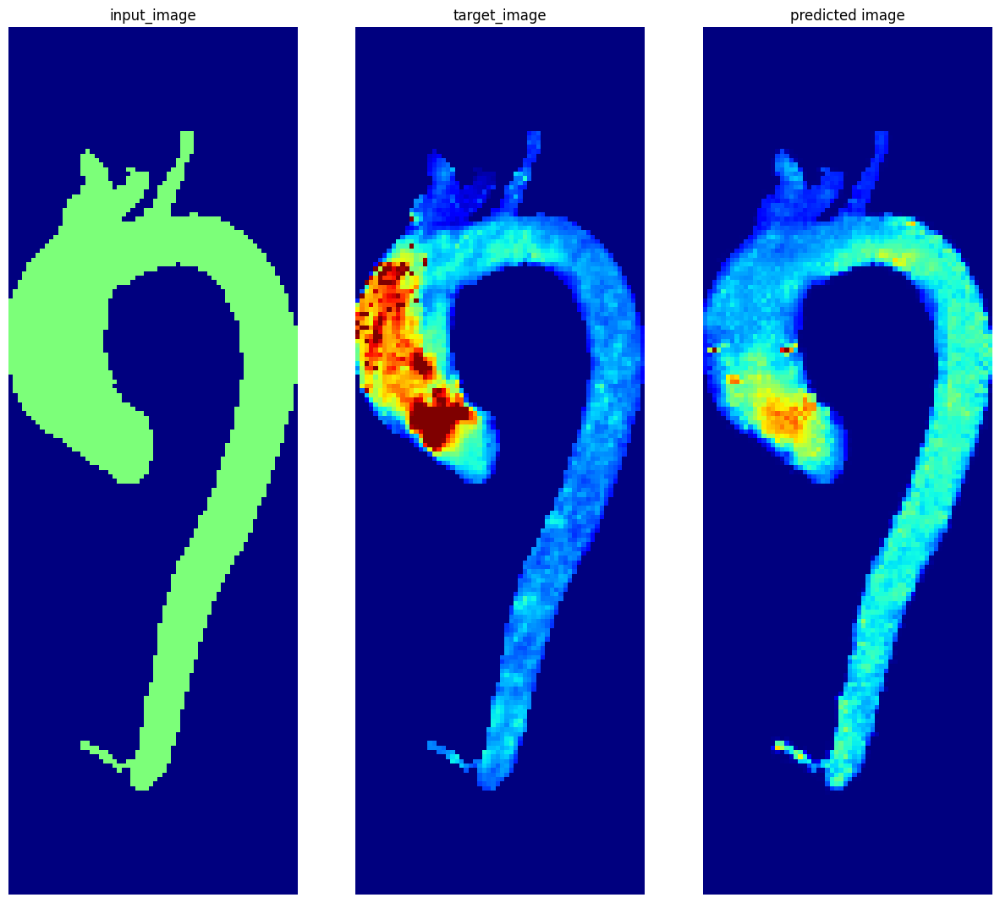

Inner Epoch:  10%|███                          | 95/909 [00:22<01:49,  7.42it/s]


Inner Epoch:  21%|█████▉                      | 192/909 [00:35<01:36,  7.39it/s]


Inner Epoch:  32%|████████▉                   | 289/909 [00:48<01:24,  7.36it/s]


Inner Epoch:  42%|███████████▉                | 386/909 [01:01<01:10,  7.37it/s]


Inner Epoch:  53%|██████████████▉             | 483/909 [01:14<00:57,  7.40it/s]


Inner Epoch:  64%|█████████████████▊          | 580/909 [01:28<00:44,  7.36it/s]


Inner Epoch:  74%|████████████████████▊       | 677/909 [01:41<00:31,  7.39it/s]


Inner Epoch:  85%|███████████████████████▊    | 774/909 [01:54<00:18,  7.38it/s]


Inner Epoch:  96%|██████████████████████████▊ | 871/909 [02:07<00:05,  7.40it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:12<00:00,  6.85it/s]


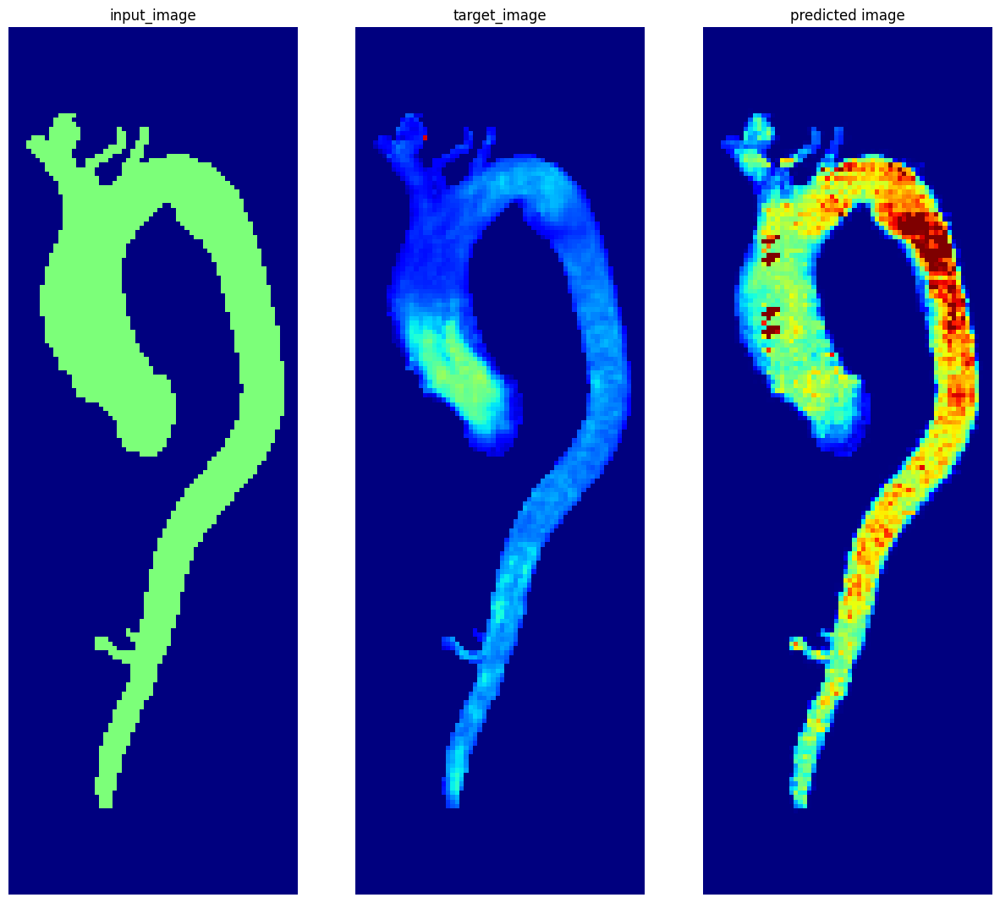

Inner Epoch:  10%|███                          | 95/909 [00:22<01:49,  7.44it/s]


Inner Epoch:  21%|█████▉                      | 192/909 [00:35<01:36,  7.41it/s]


Inner Epoch:  32%|████████▉                   | 289/909 [00:48<01:24,  7.34it/s]


Inner Epoch:  42%|███████████▉                | 386/909 [01:01<01:10,  7.38it/s]


Inner Epoch:  53%|██████████████▉             | 483/909 [01:14<00:57,  7.38it/s]


Inner Epoch:  64%|█████████████████▊          | 580/909 [01:27<00:44,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 677/909 [01:41<00:31,  7.37it/s]


Inner Epoch:  85%|███████████████████████▊    | 774/909 [01:54<00:18,  7.39it/s]


Inner Epoch:  96%|██████████████████████████▊ | 871/909 [02:07<00:05,  7.39it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:12<00:00,  6.86it/s]


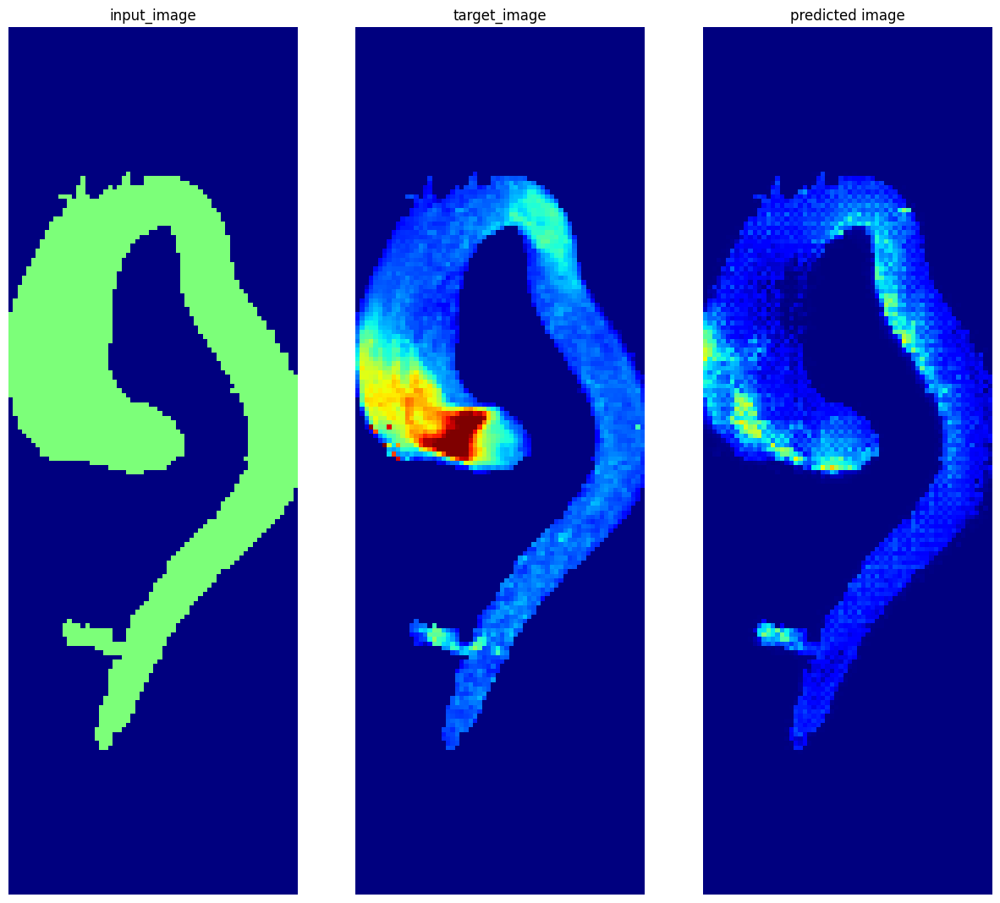

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 11:08:32.748246: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 864 of 909
2023-01-05 11:08:33.280766: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:49,  7.45it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.39it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.40it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.39it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:57,  7.41it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.40it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.40it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.37it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.39it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.81it/s]


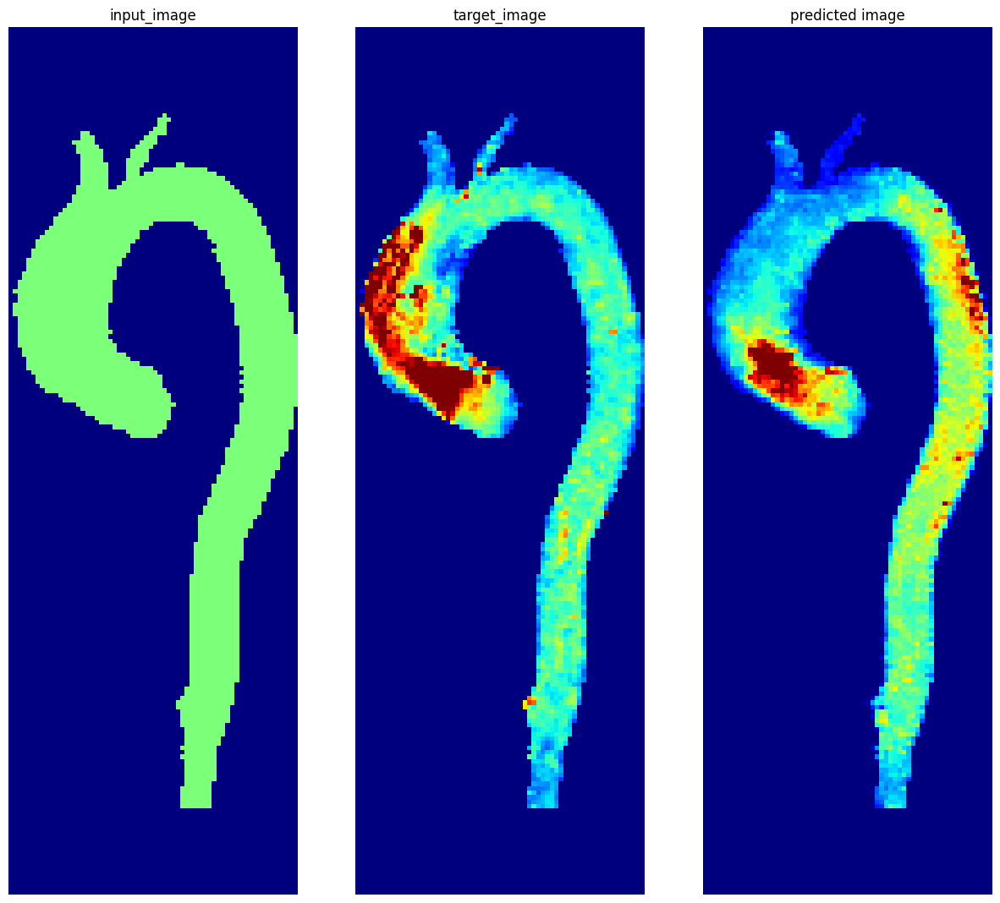

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 11:11:03.112113: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 818 of 909
2023-01-05 11:11:04.151583: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.44it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.38it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.35it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.37it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.32it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.35it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.37it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.32it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.78it/s]


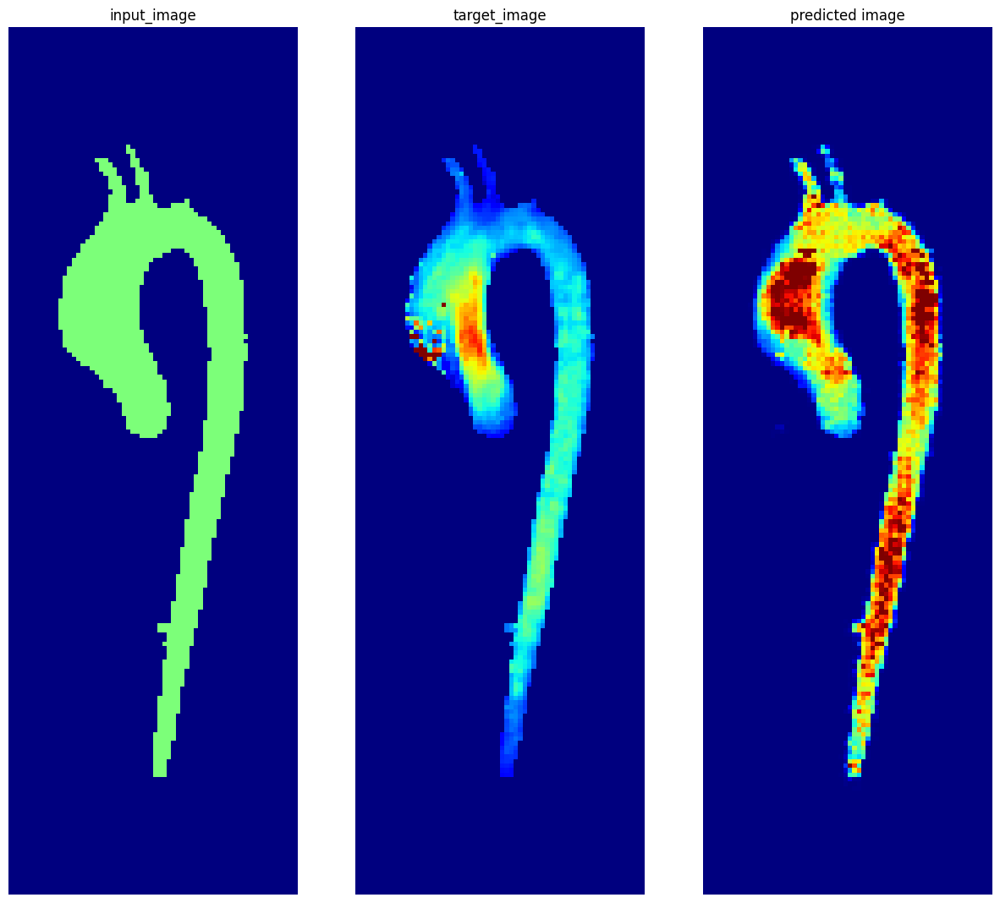

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 11:13:35.292972: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 873 of 909
2023-01-05 11:13:35.701955: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:50,  7.43it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.41it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:24,  7.37it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.37it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:57,  7.40it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:32,  7.23it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.37it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.36it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.81it/s]


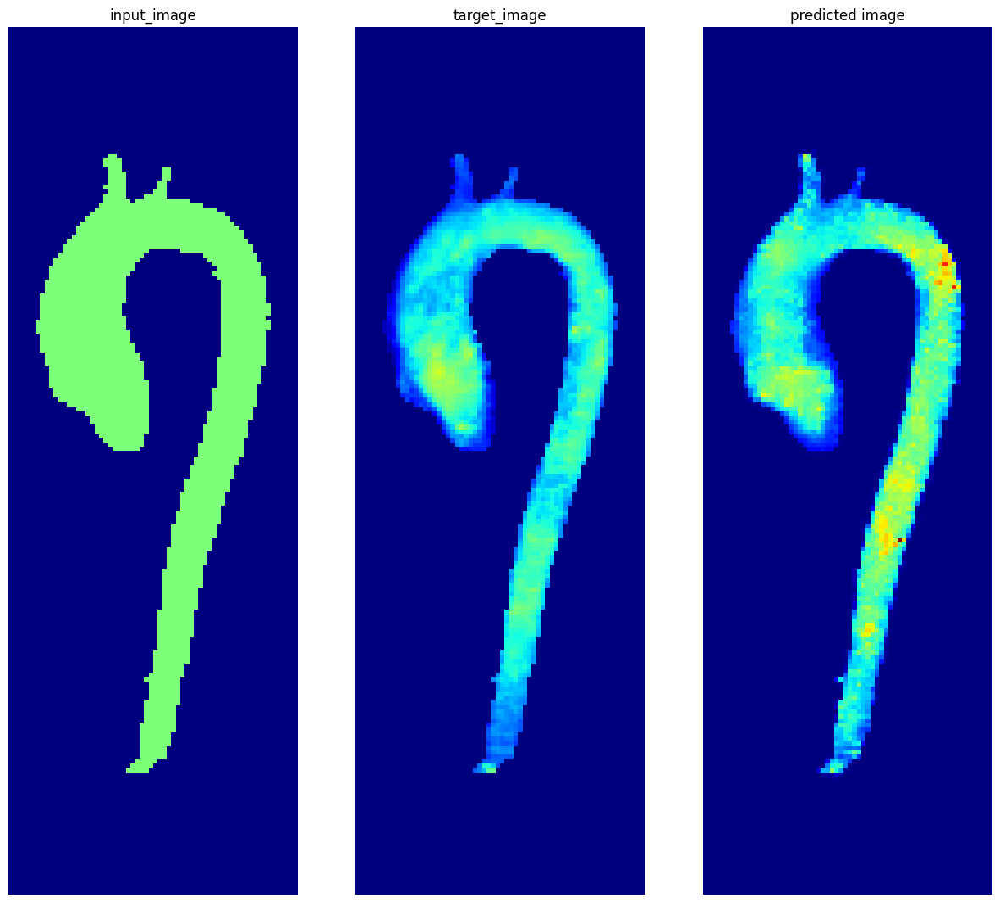

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 11:16:07.123265: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 850 of 909
2023-01-05 11:16:07.770831: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:49,  7.43it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.38it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:23,  7.42it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.35it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.38it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.39it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.81it/s]


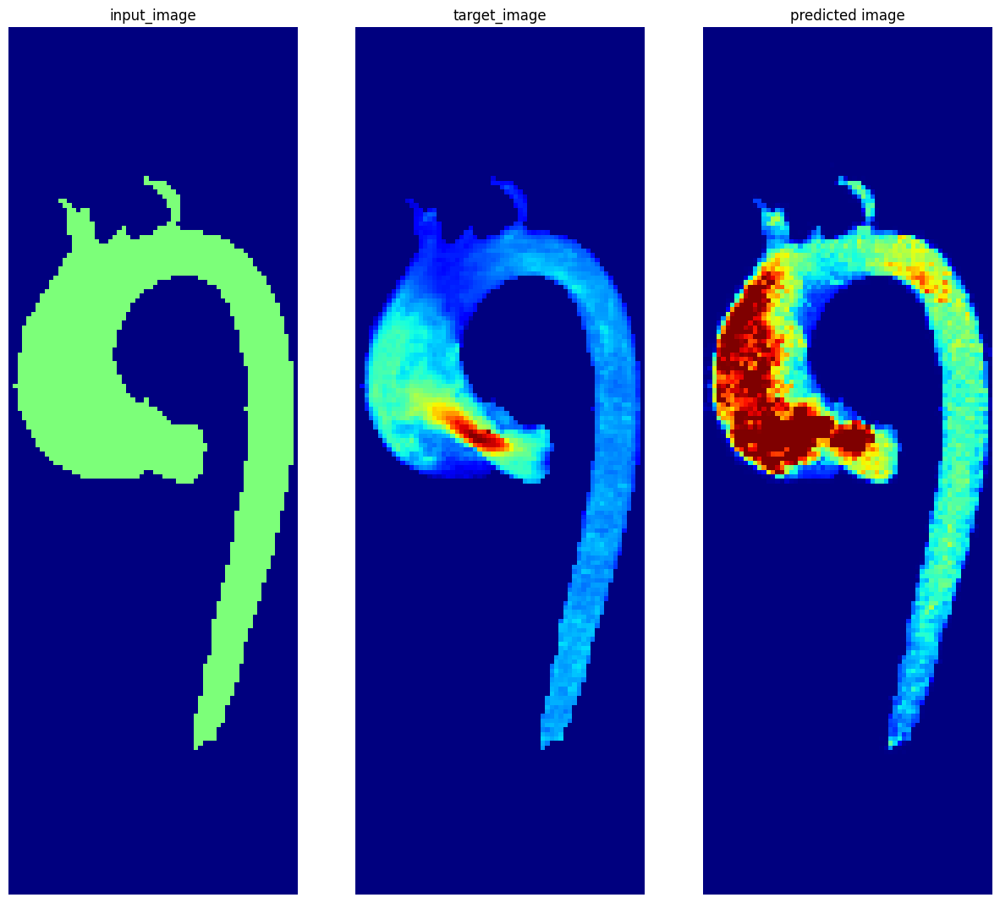

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 11:18:38.598513: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 830 of 909
2023-01-05 11:18:39.557504: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.44it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:36,  7.43it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.40it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.39it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.34it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.36it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.39it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.40it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.79it/s]


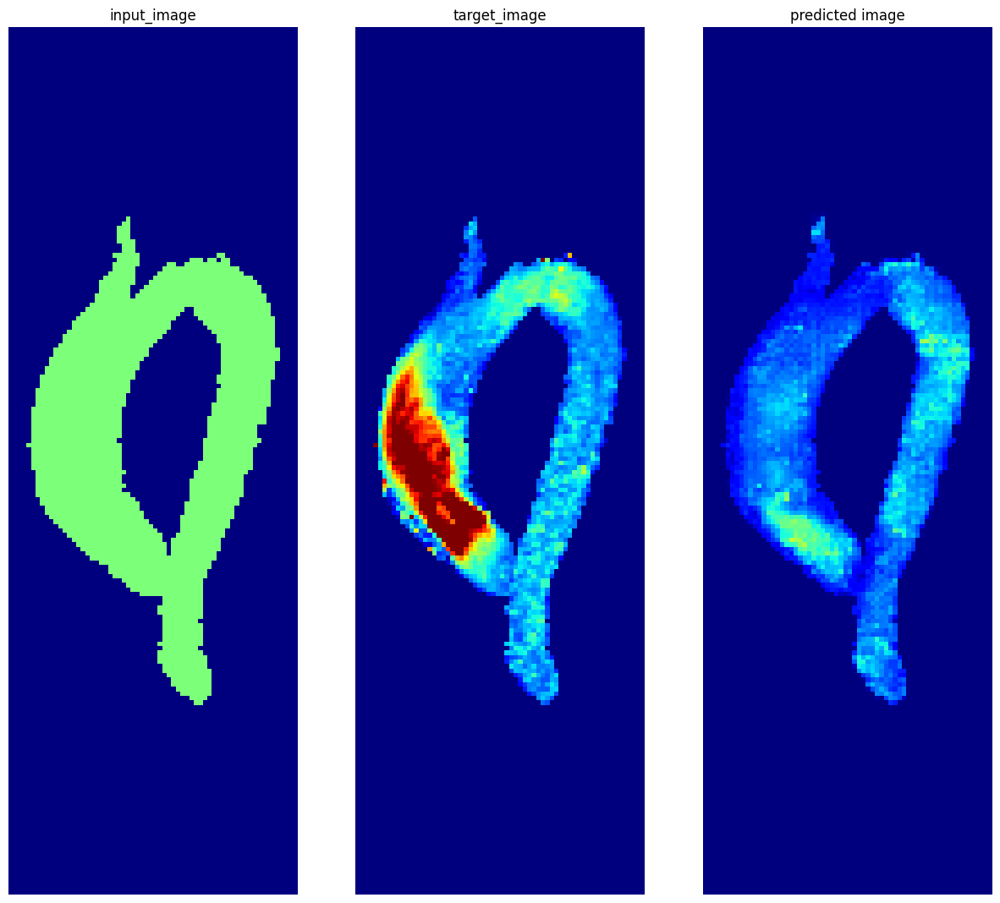

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 11:21:10.424094: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 835 of 909
2023-01-05 11:21:11.319128: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.43it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.36it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.39it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.35it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:57,  7.40it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.37it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.39it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.37it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.39it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.79it/s]


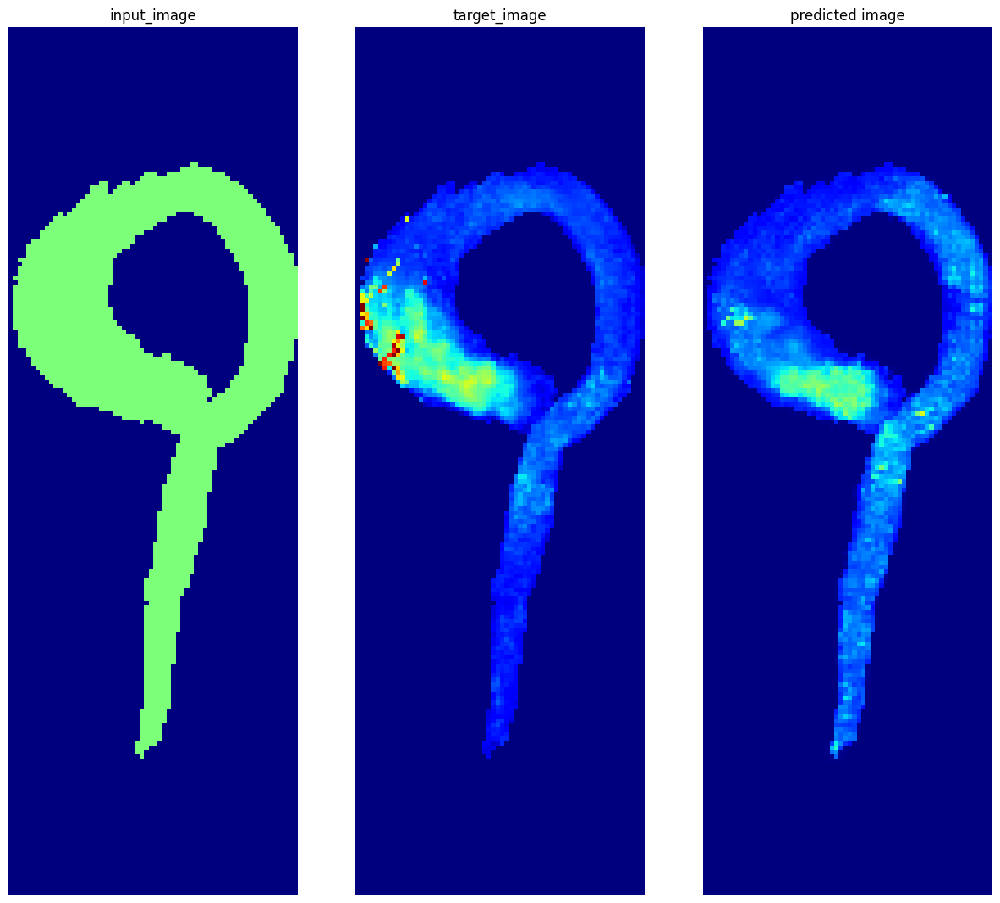

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 11:23:42.313116: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 840 of 909
2023-01-05 11:23:43.162649: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:50,  7.40it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.40it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.38it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:12,  7.26it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.37it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.36it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.39it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.38it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.42it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.79it/s]


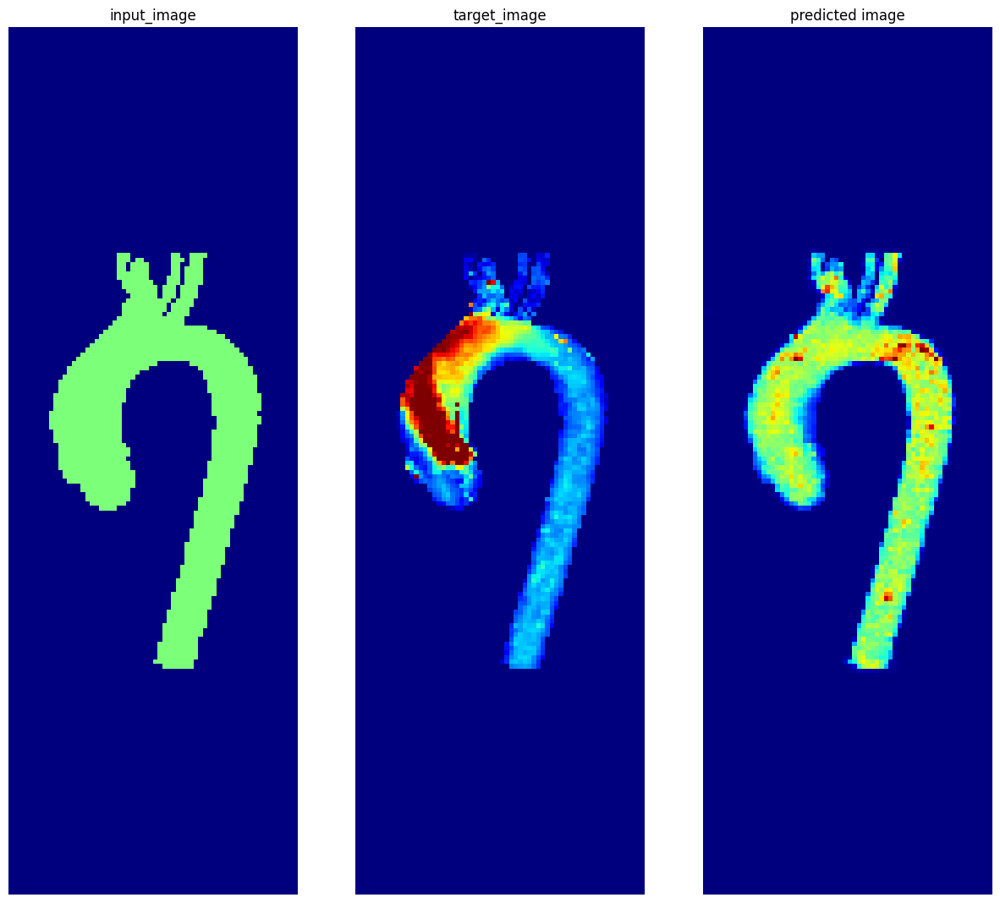

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 11:26:14.293078: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 791 of 909
2023-01-05 11:26:15.675766: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:50,  7.42it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.41it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.40it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:03<01:11,  7.36it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:16<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:29<00:44,  7.40it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.38it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.39it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.39it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:14<00:00,  6.77it/s]


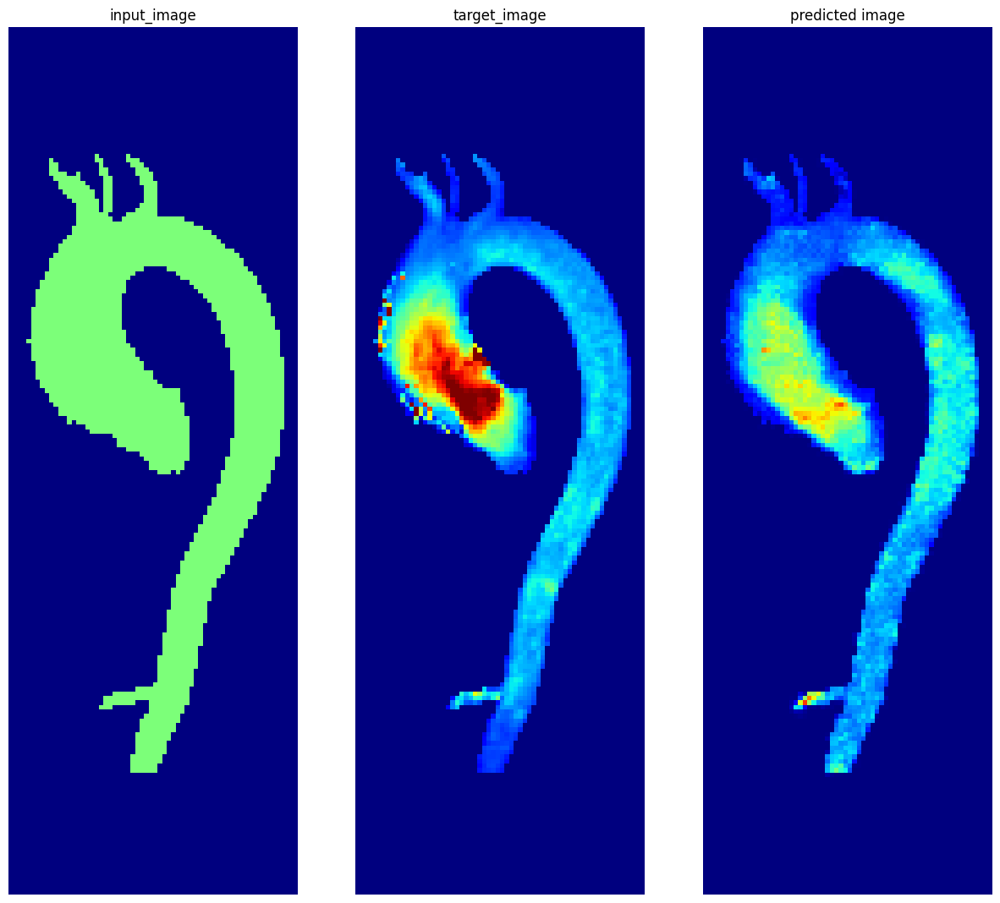

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 11:28:46.452937: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 868 of 909
2023-01-05 11:28:46.877078: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:50,  7.40it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.39it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:24,  7.38it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.35it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:57,  7.40it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.37it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.44it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.38it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.82it/s]


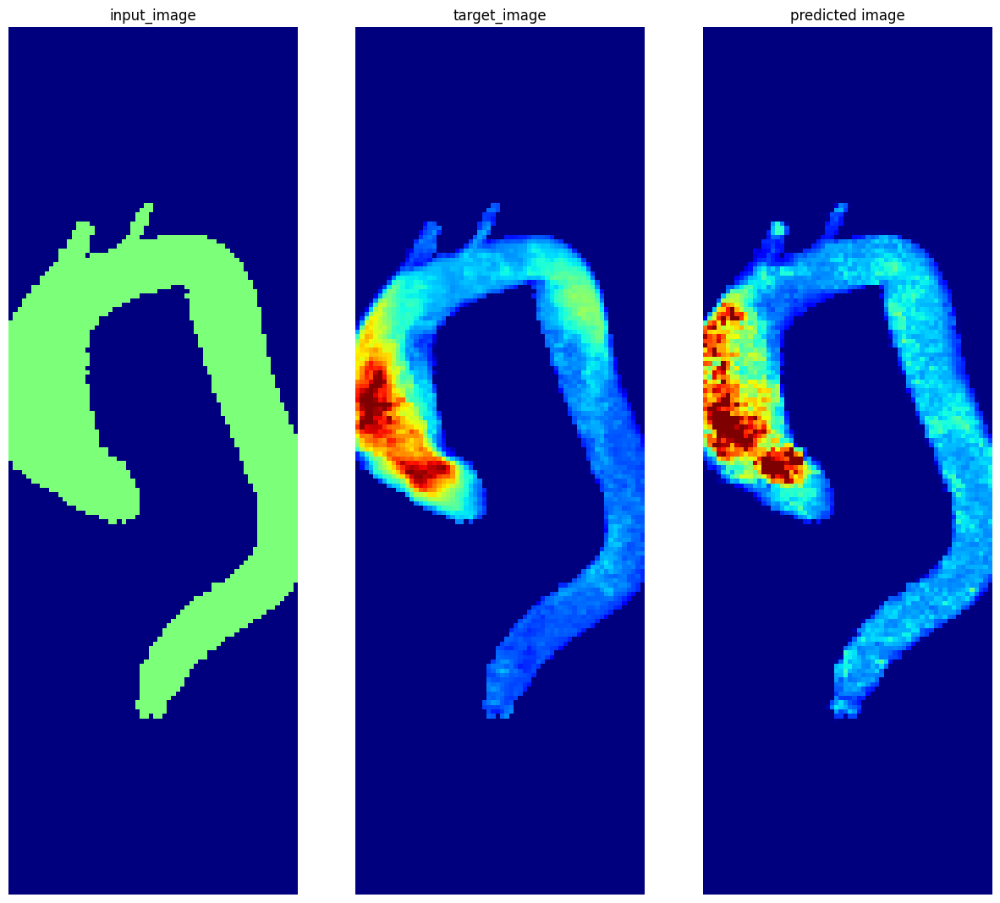

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 11:31:17.711041: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 845 of 909
2023-01-05 11:31:18.480667: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:50,  7.42it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.35it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.39it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.36it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.41it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.39it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.38it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.36it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.80it/s]


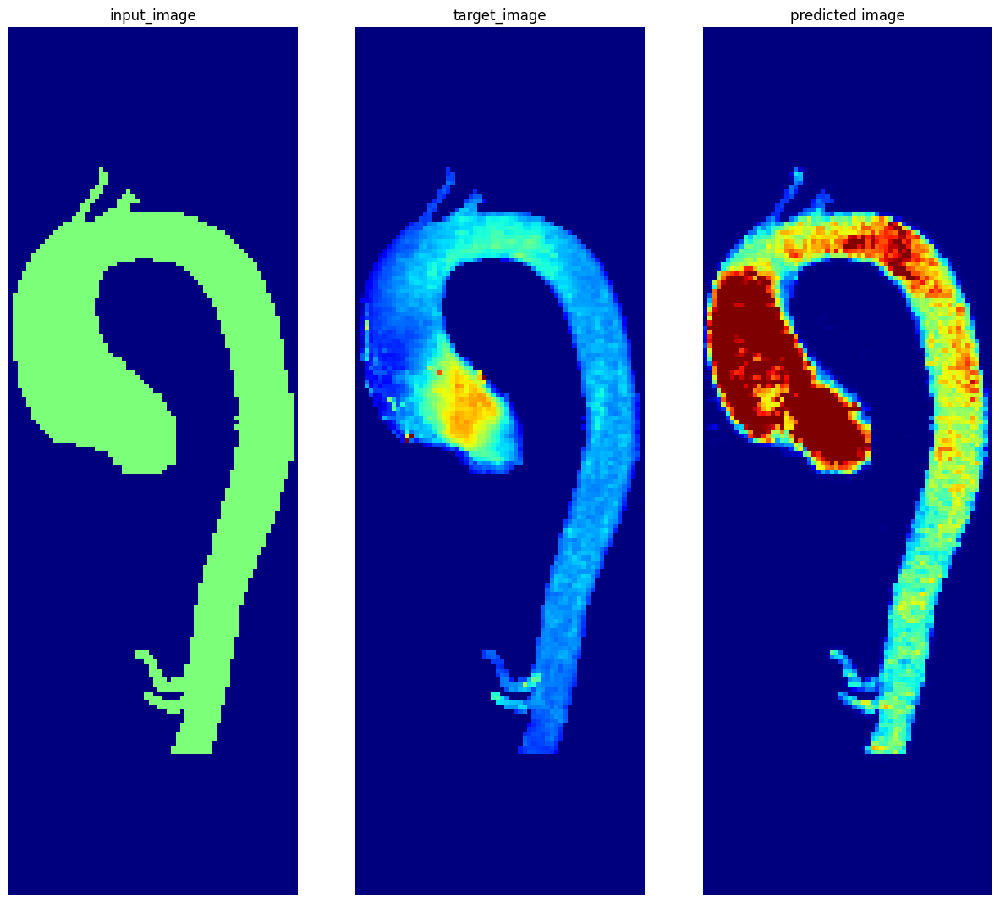

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 11:33:49.902034: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 893 of 909
2023-01-05 11:33:50.065411: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:49,  7.43it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.38it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:24,  7.41it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:01<01:11,  7.37it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:14<00:58,  7.37it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.38it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.36it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.37it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.83it/s]


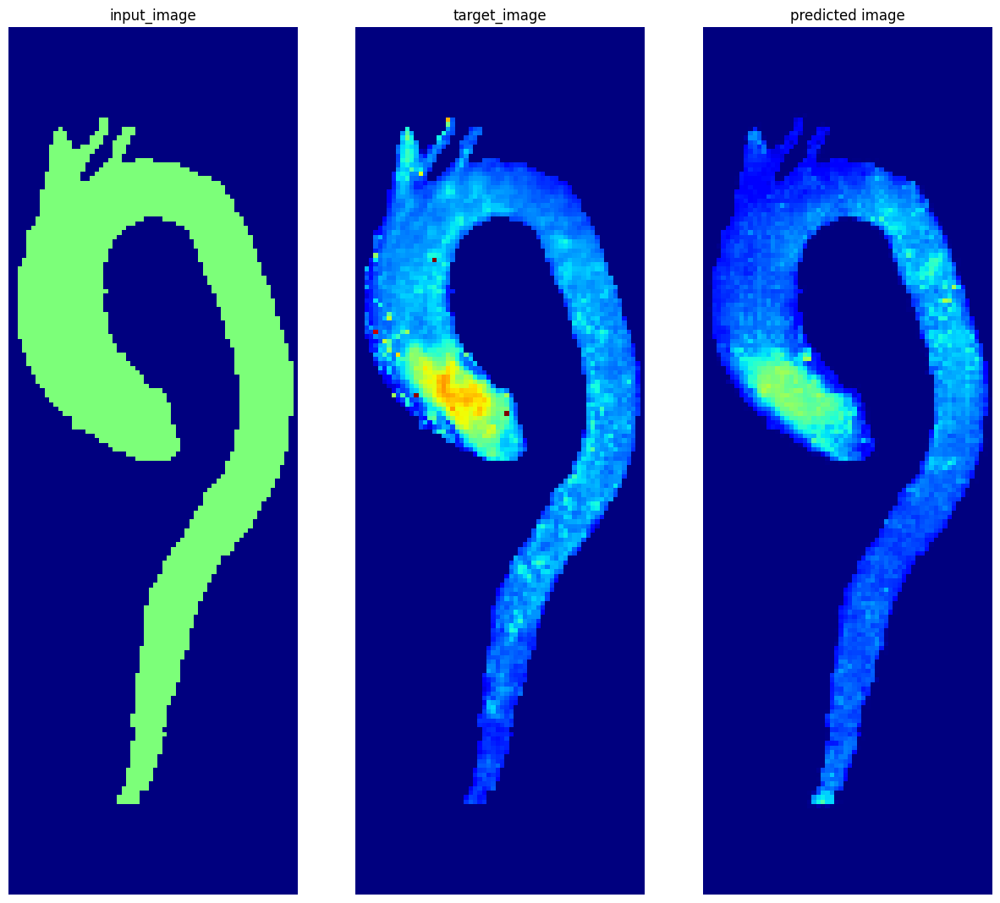

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 11:36:20.884180: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 831 of 909
2023-01-05 11:36:21.878657: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:50,  7.40it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.38it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:23,  7.42it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.37it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.37it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.37it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.38it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.39it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.79it/s]


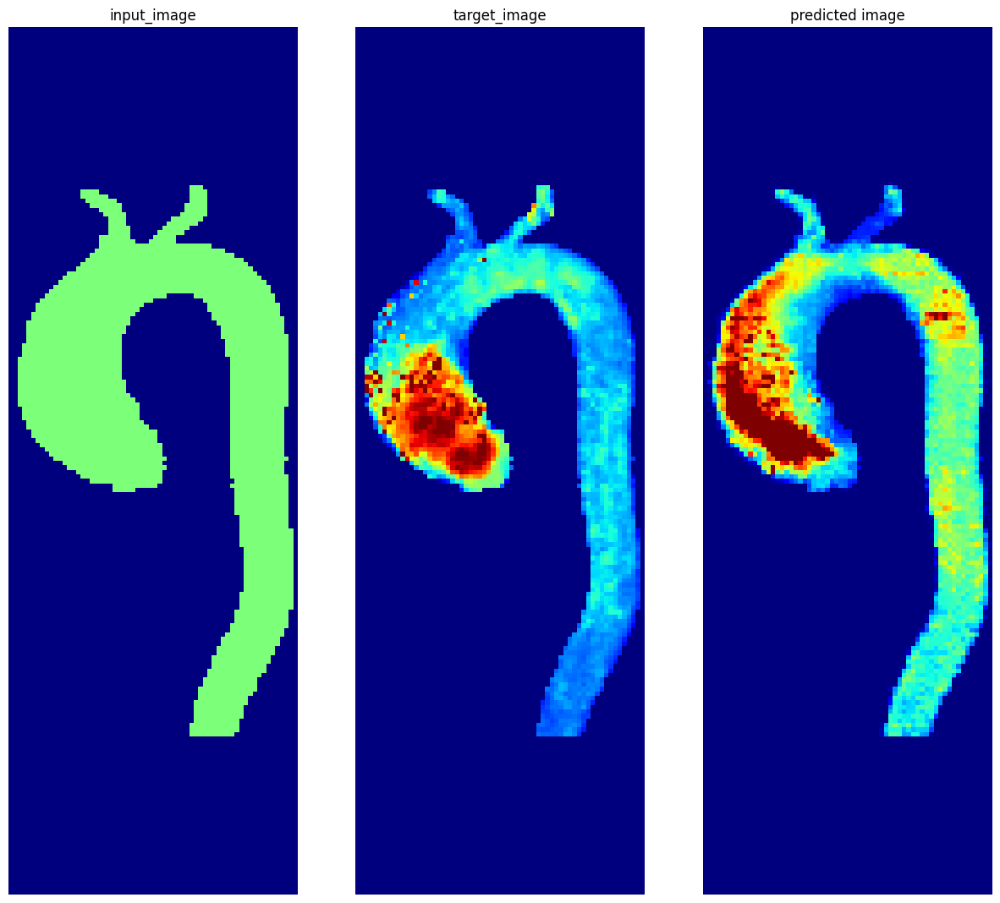

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 11:38:52.123154: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 809 of 909
2023-01-05 11:38:53.314117: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:50,  7.40it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.37it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.39it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.34it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:29<00:44,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.41it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.40it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.39it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:14<00:00,  6.78it/s]


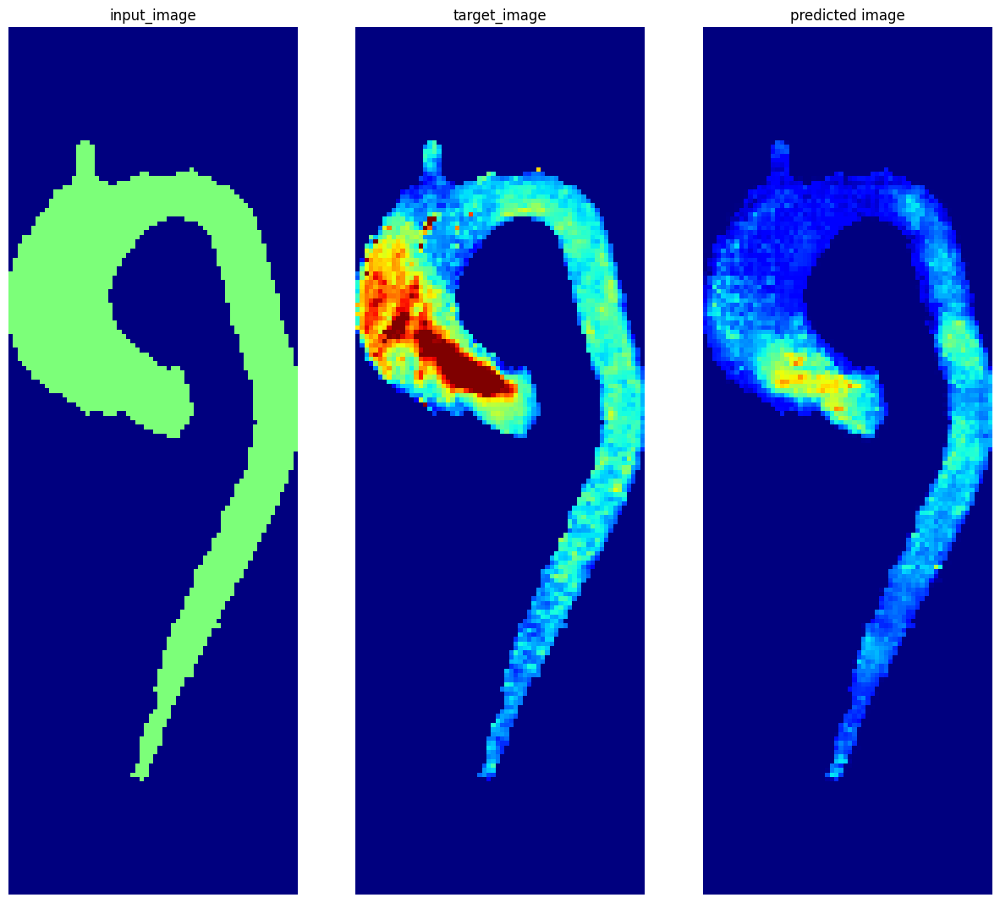

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 11:41:24.075096: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 810 of 909
2023-01-05 11:41:25.218244: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.44it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.40it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.41it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.37it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.30it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:29<00:45,  7.33it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.37it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.36it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.38it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:14<00:00,  6.78it/s]


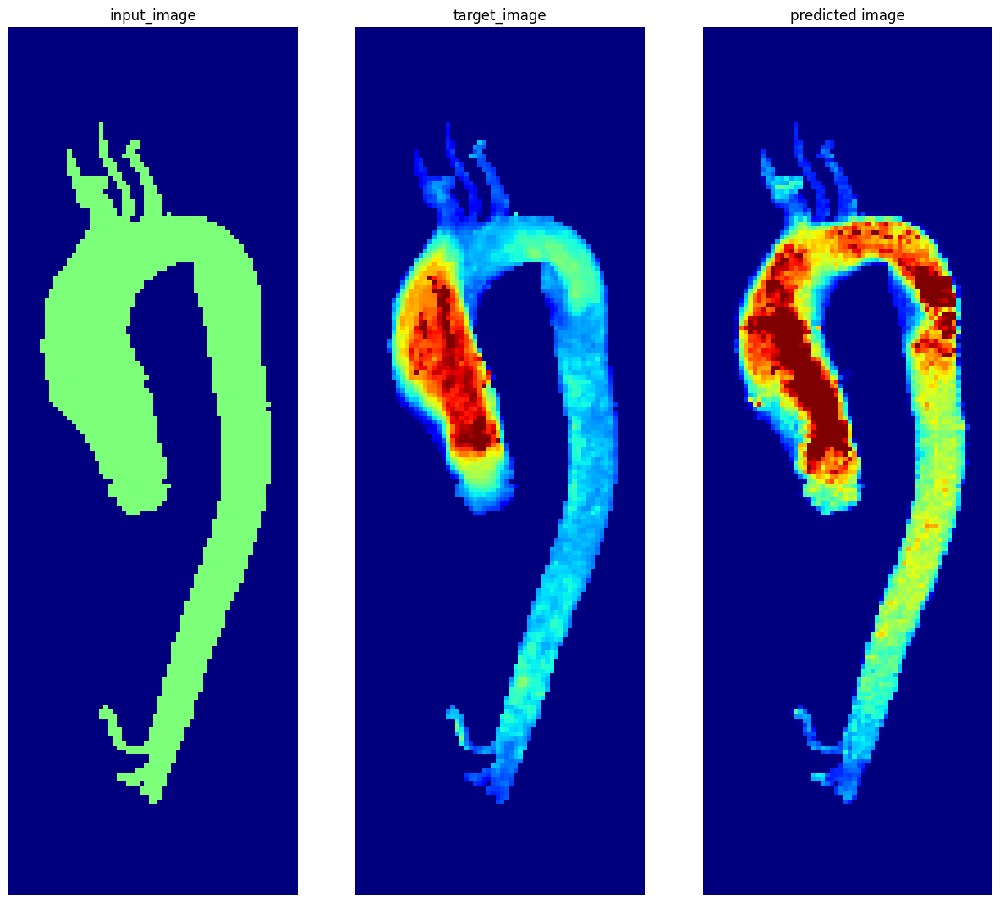

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 11:43:56.066482: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 835 of 909
2023-01-05 11:43:56.953885: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.45it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.38it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.40it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.37it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.37it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.40it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.39it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.38it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.41it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.79it/s]


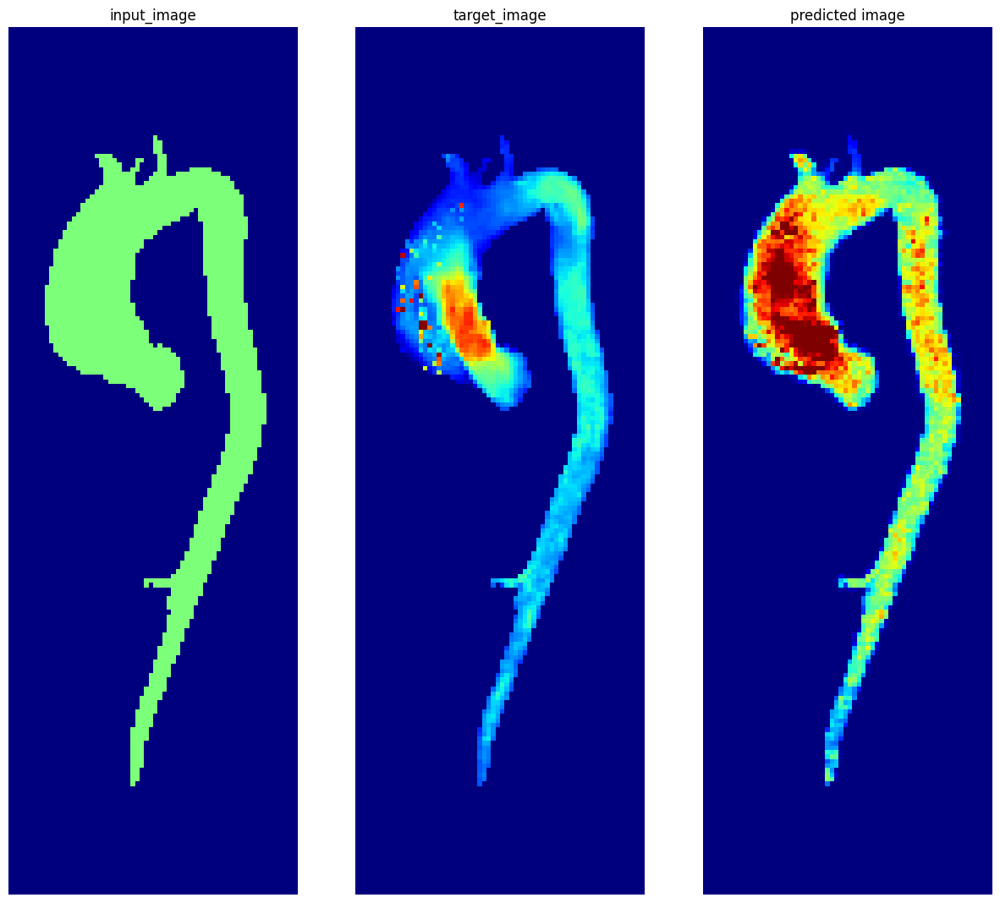

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 11:46:28.120671: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 755 of 909
2023-01-05 11:46:30.042266: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:24<01:51,  7.36it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:37<01:37,  7.39it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:50<01:24,  7.37it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:03<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:16<00:58,  7.35it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:29<00:44,  7.39it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:32,  7.33it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:56<00:18,  7.39it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:09<00:05,  7.38it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:14<00:00,  6.74it/s]


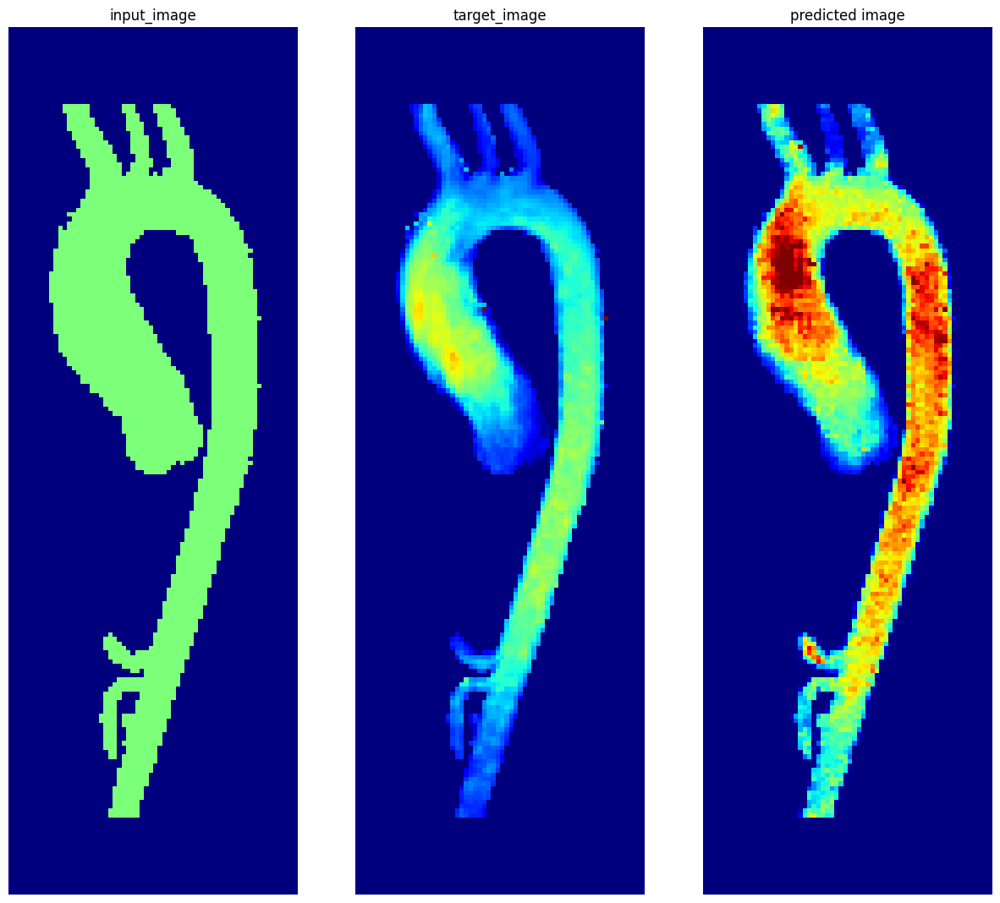

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 11:49:00.922942: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 882 of 909
2023-01-05 11:49:01.233982: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:49,  7.46it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.40it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:24,  7.41it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:01<01:10,  7.42it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.40it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:32,  7.33it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.37it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.39it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.82it/s]


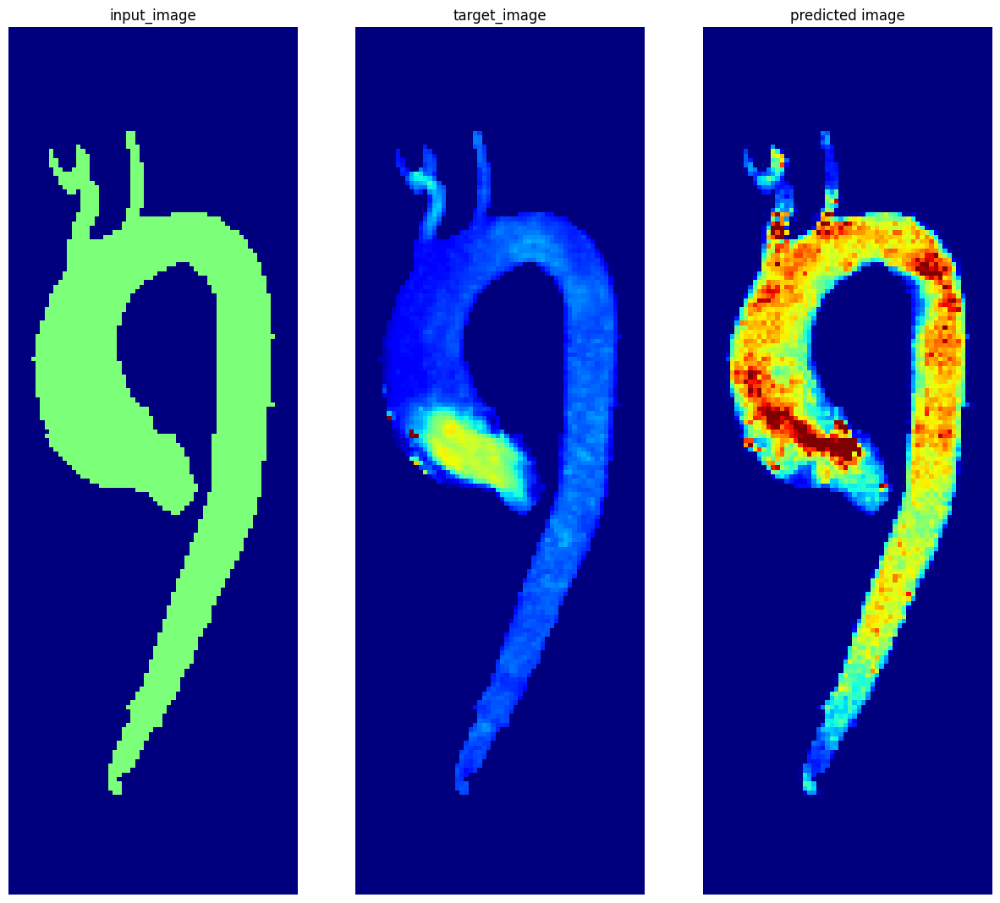

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 11:51:31.084658: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 837 of 909
2023-01-05 11:51:31.899746: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:50,  7.41it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:38,  7.29it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.38it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.37it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.37it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.38it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.35it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.79it/s]


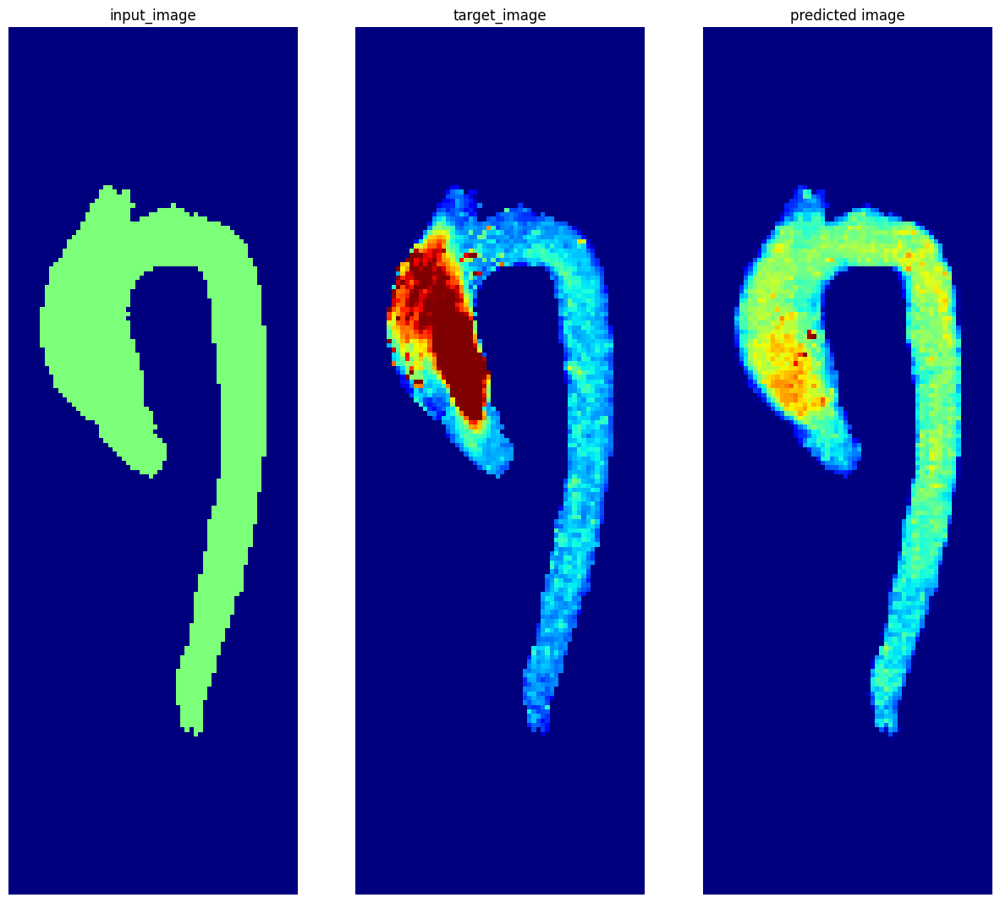

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 11:54:02.973918: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 827 of 909
2023-01-05 11:54:03.890145: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:50,  7.40it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:36,  7.43it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.38it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.36it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.28it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.35it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.39it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.40it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.79it/s]


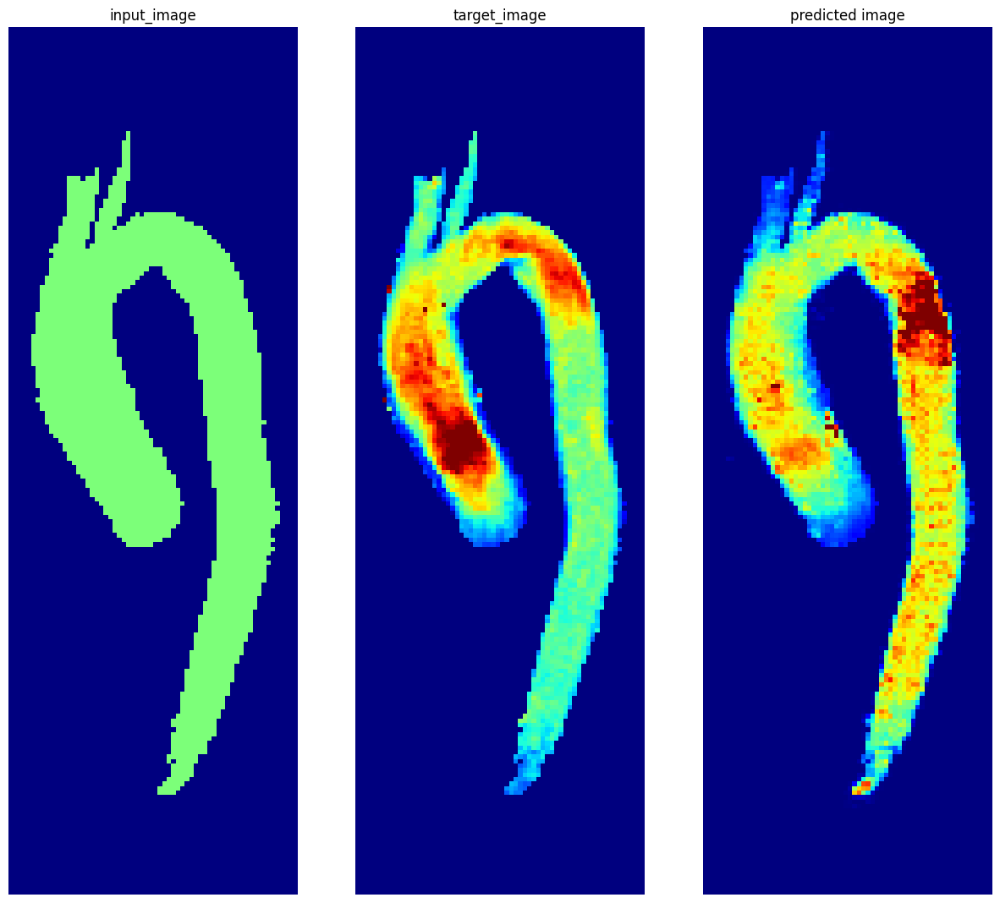

Inner Epoch:  10%|███                          | 95/909 [00:22<01:49,  7.42it/s]


Inner Epoch:  21%|█████▉                      | 192/909 [00:35<01:37,  7.38it/s]


Inner Epoch:  32%|████████▉                   | 289/909 [00:48<01:24,  7.37it/s]


Inner Epoch:  42%|███████████▉                | 386/909 [01:02<01:10,  7.38it/s]


Inner Epoch:  53%|██████████████▉             | 483/909 [01:15<00:57,  7.40it/s]


Inner Epoch:  64%|█████████████████▊          | 580/909 [01:28<00:44,  7.41it/s]


Inner Epoch:  74%|████████████████████▊       | 677/909 [01:41<00:31,  7.37it/s]


Inner Epoch:  85%|███████████████████████▊    | 774/909 [01:54<00:18,  7.38it/s]


Inner Epoch:  96%|██████████████████████████▊ | 871/909 [02:07<00:05,  7.38it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:12<00:00,  6.84it/s]


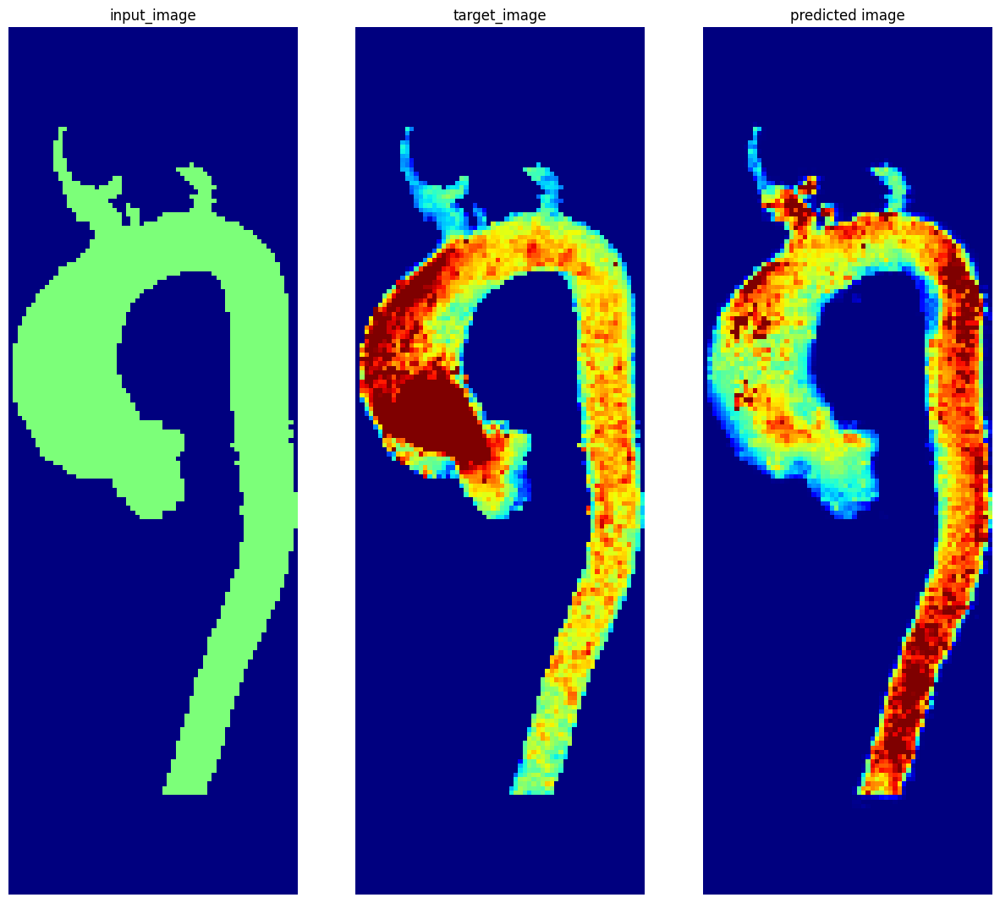

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 11:59:05.961673: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 818 of 909
2023-01-05 11:59:06.971517: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.43it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.38it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.36it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.40it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.35it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.37it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.36it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.37it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.38it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.79it/s]


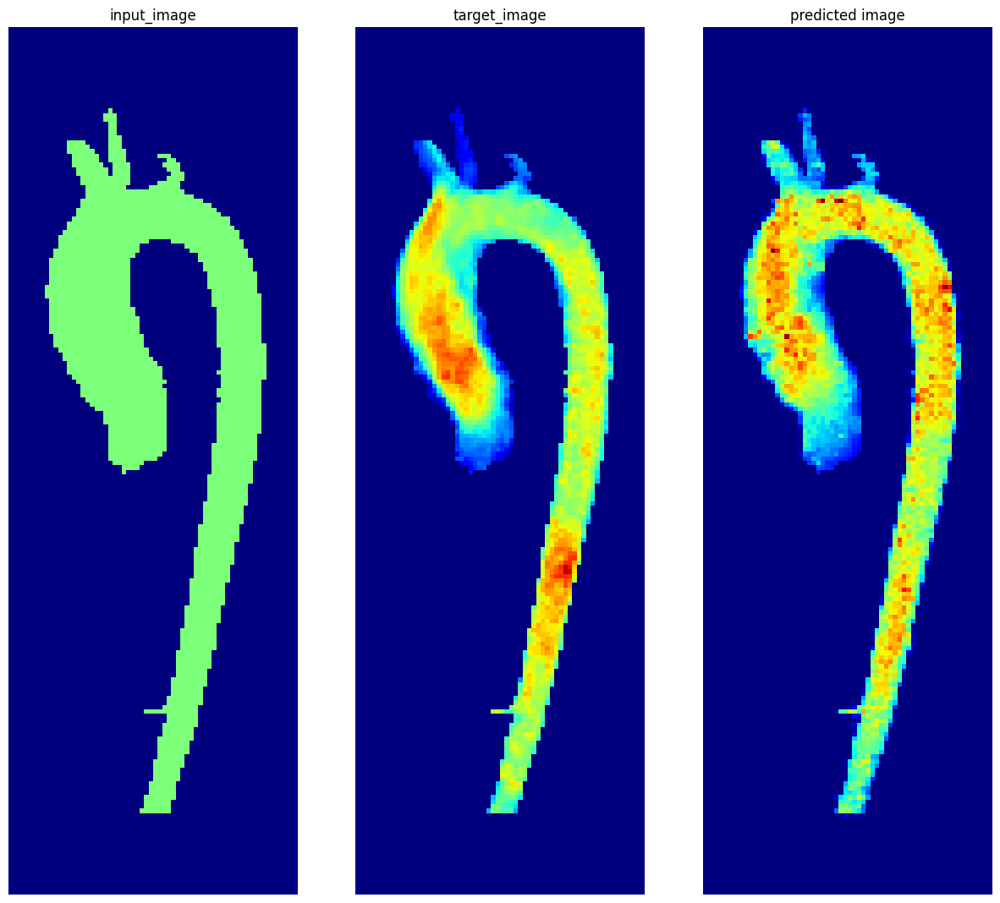

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 12:01:37.897748: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 841 of 909
2023-01-05 12:01:38.666949: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.43it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:36,  7.43it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.38it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.37it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.37it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.34it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.38it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.40it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.35it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.80it/s]


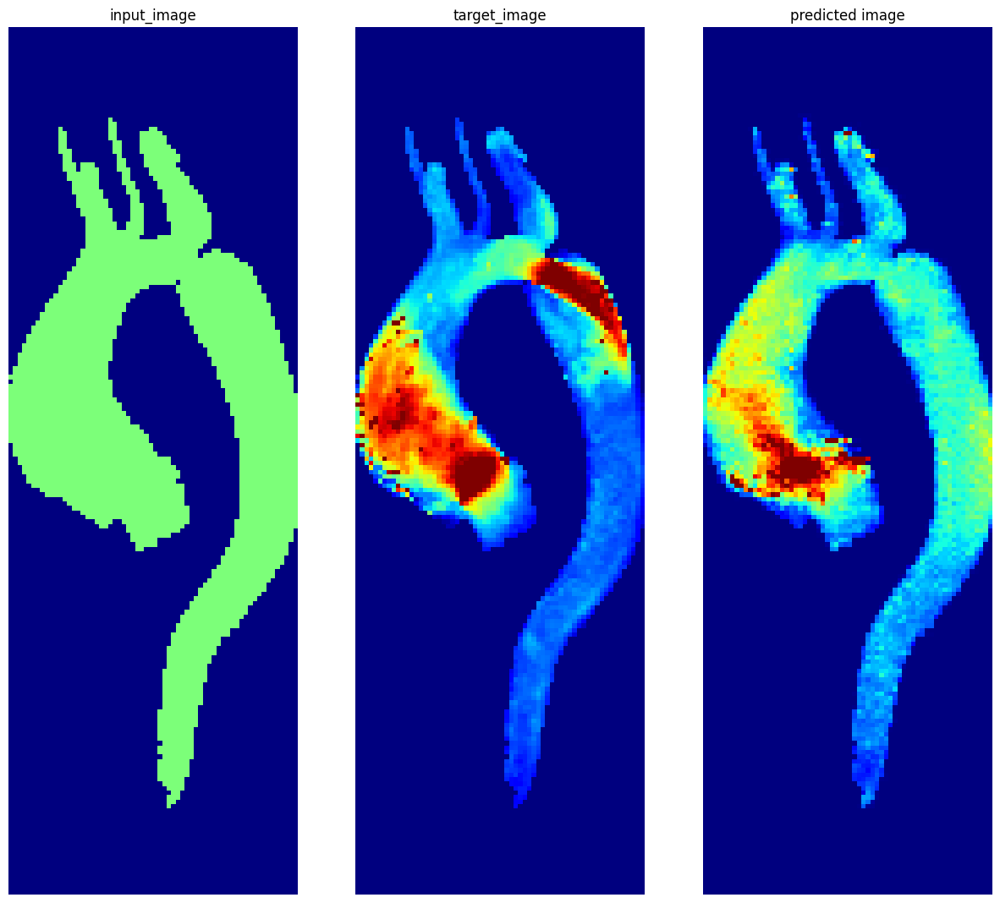

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 12:04:10.917820: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 882 of 909
2023-01-05 12:04:11.199619: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:49,  7.45it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.39it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:24,  7.40it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:01<01:11,  7.39it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:14<00:57,  7.40it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.35it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.40it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.40it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.83it/s]


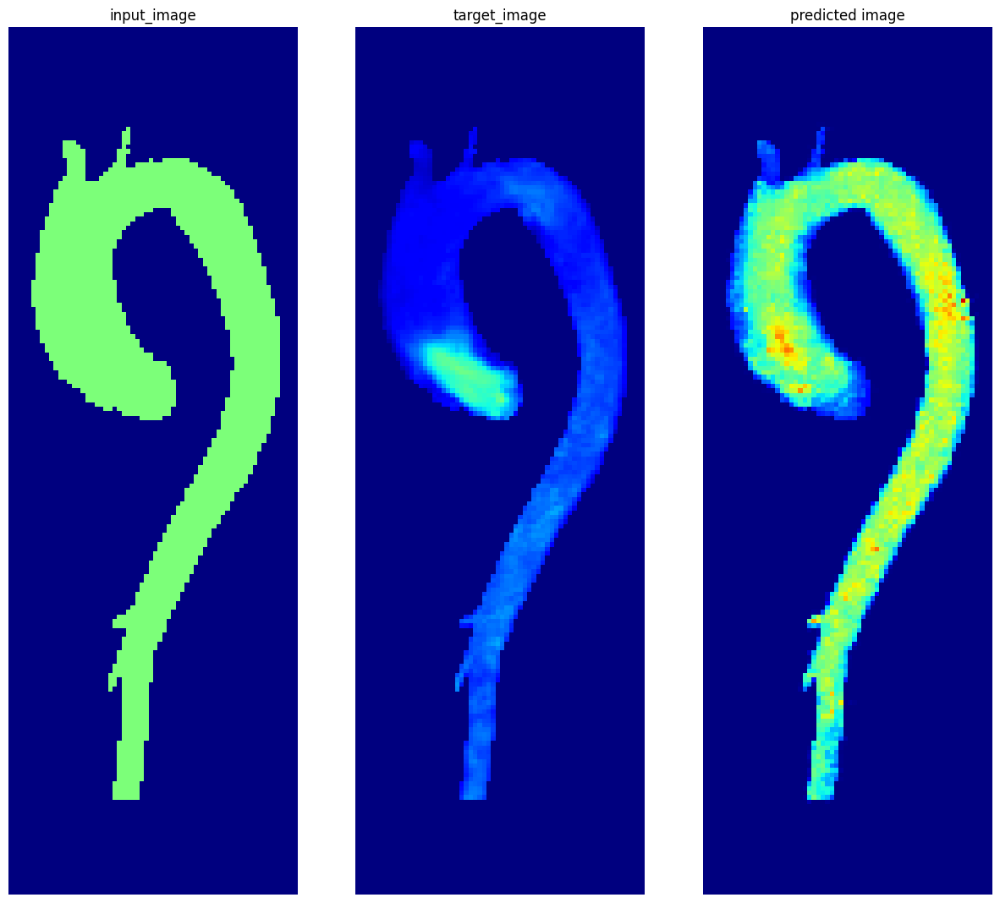

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 12:06:41.902066: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 852 of 909
2023-01-05 12:06:42.565064: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:50,  7.43it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.40it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.42it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.39it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.34it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.39it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.38it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.39it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.37it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.81it/s]


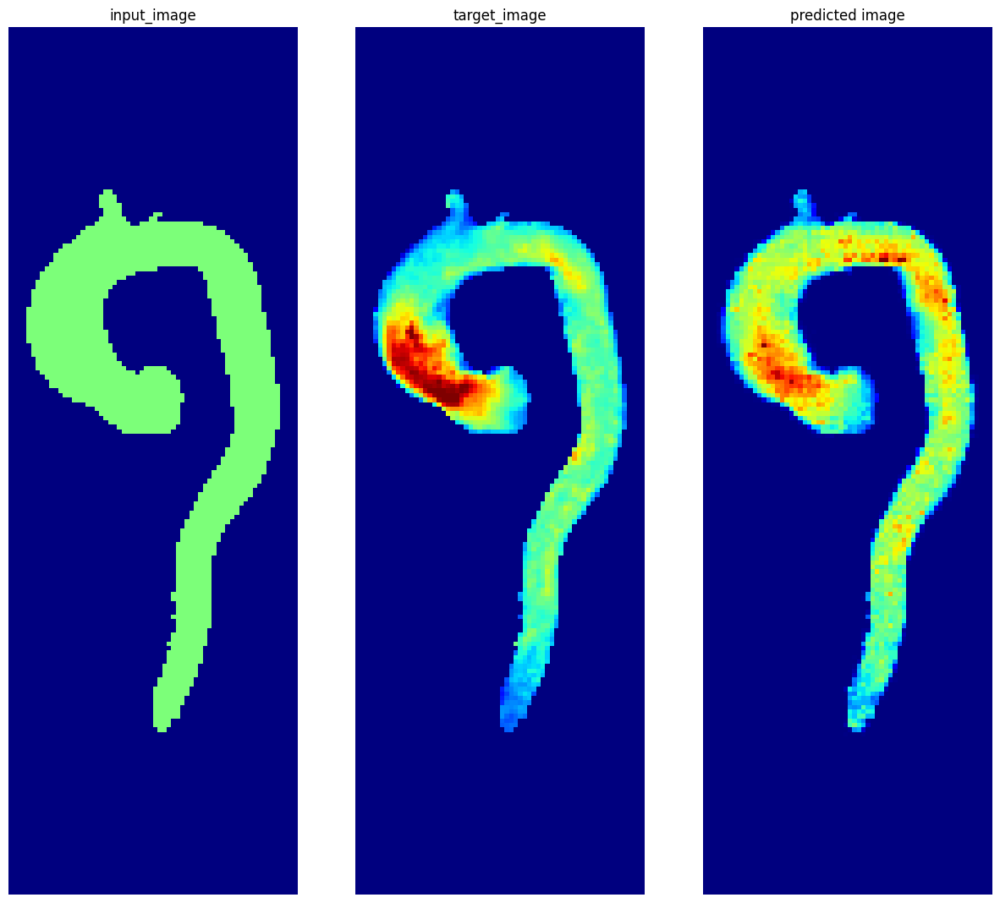

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 12:09:13.652574: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 855 of 909
2023-01-05 12:09:14.291389: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:49,  7.44it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.40it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.39it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.36it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.36it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.39it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.40it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.81it/s]


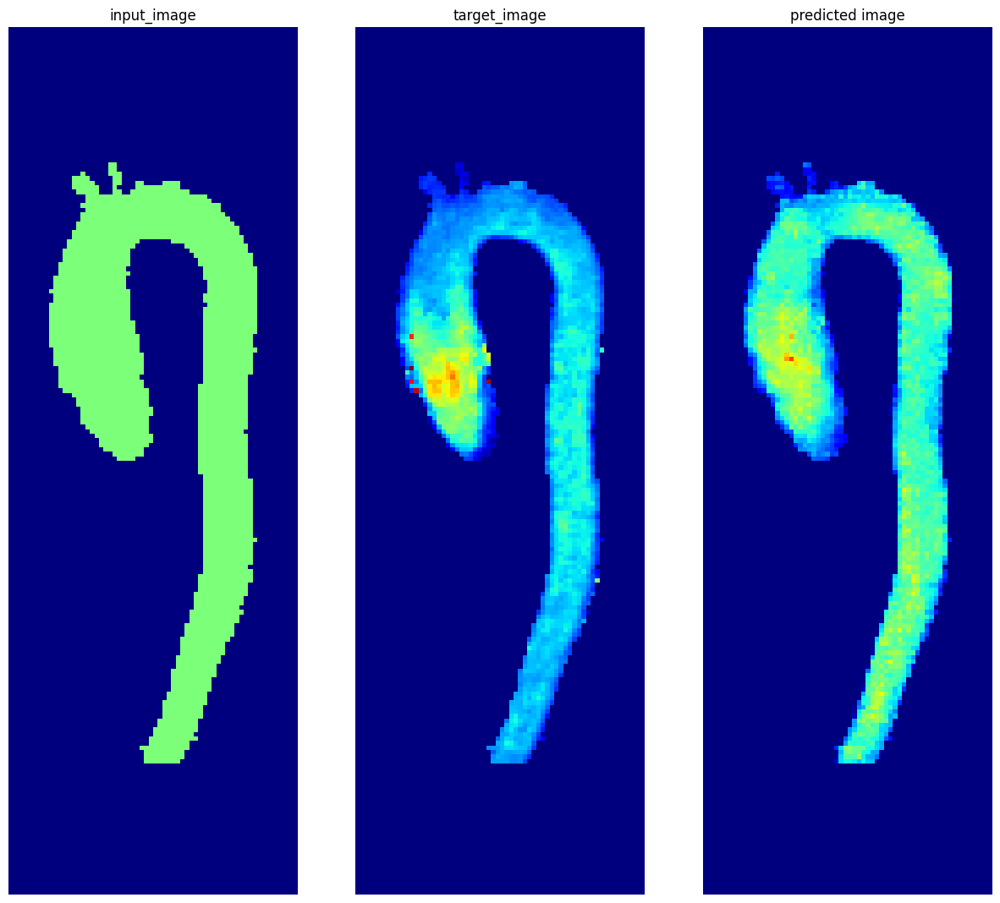

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 12:11:45.017683: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 861 of 909
2023-01-05 12:11:45.538369: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:50,  7.41it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.41it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:24,  7.36it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.37it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.39it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.41it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.38it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.35it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.81it/s]


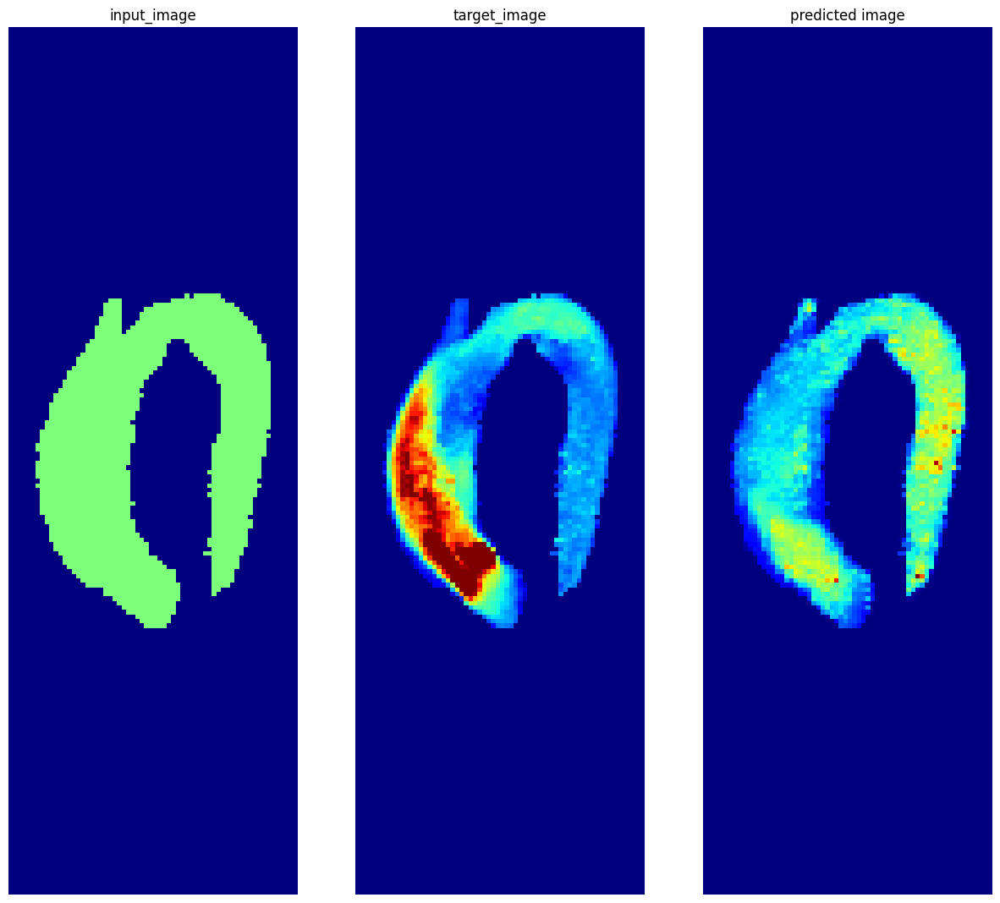

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 12:14:16.271033: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 840 of 909
2023-01-05 12:14:17.032948: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.43it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.37it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.39it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.37it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.36it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.36it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.36it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.33it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.37it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.80it/s]


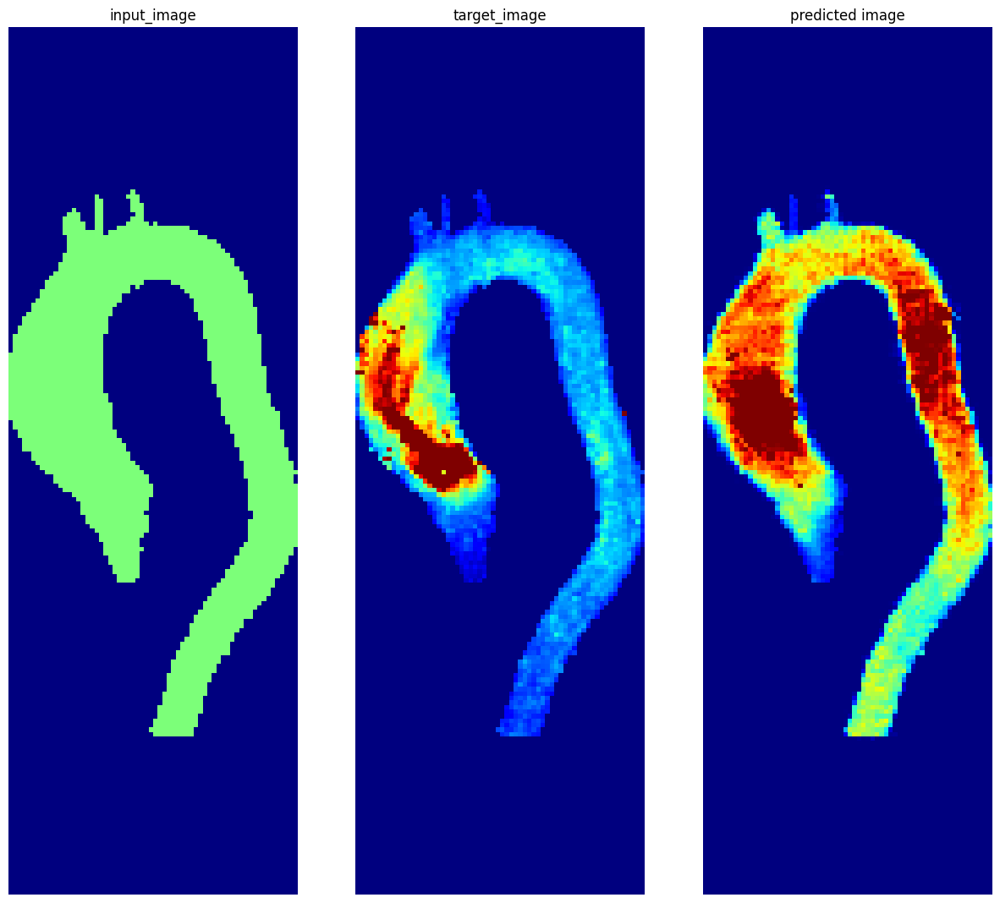

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 12:16:47.787181: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 835 of 909
2023-01-05 12:16:48.637865: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.44it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.36it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.38it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.37it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.40it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.39it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.36it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.79it/s]


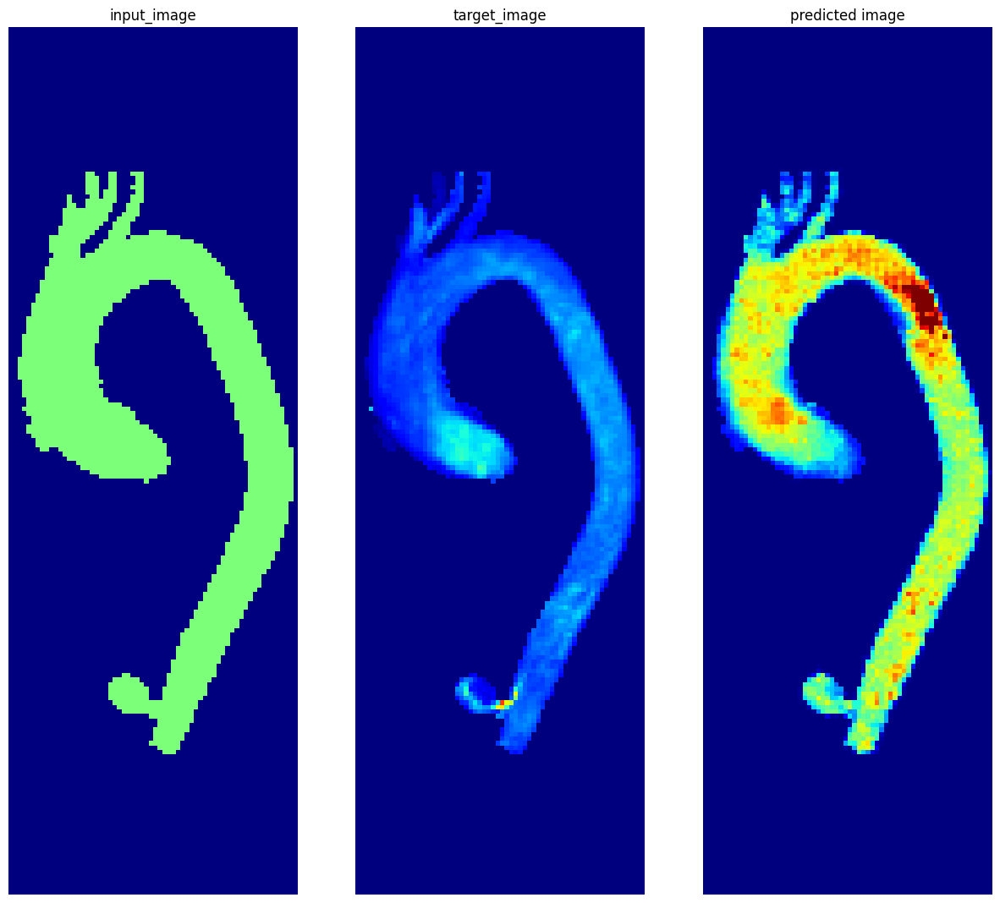

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 12:19:19.385412: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 857 of 909
2023-01-05 12:19:19.989598: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:49,  7.43it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.41it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.39it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.39it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.36it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.36it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.37it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.38it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.37it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.81it/s]


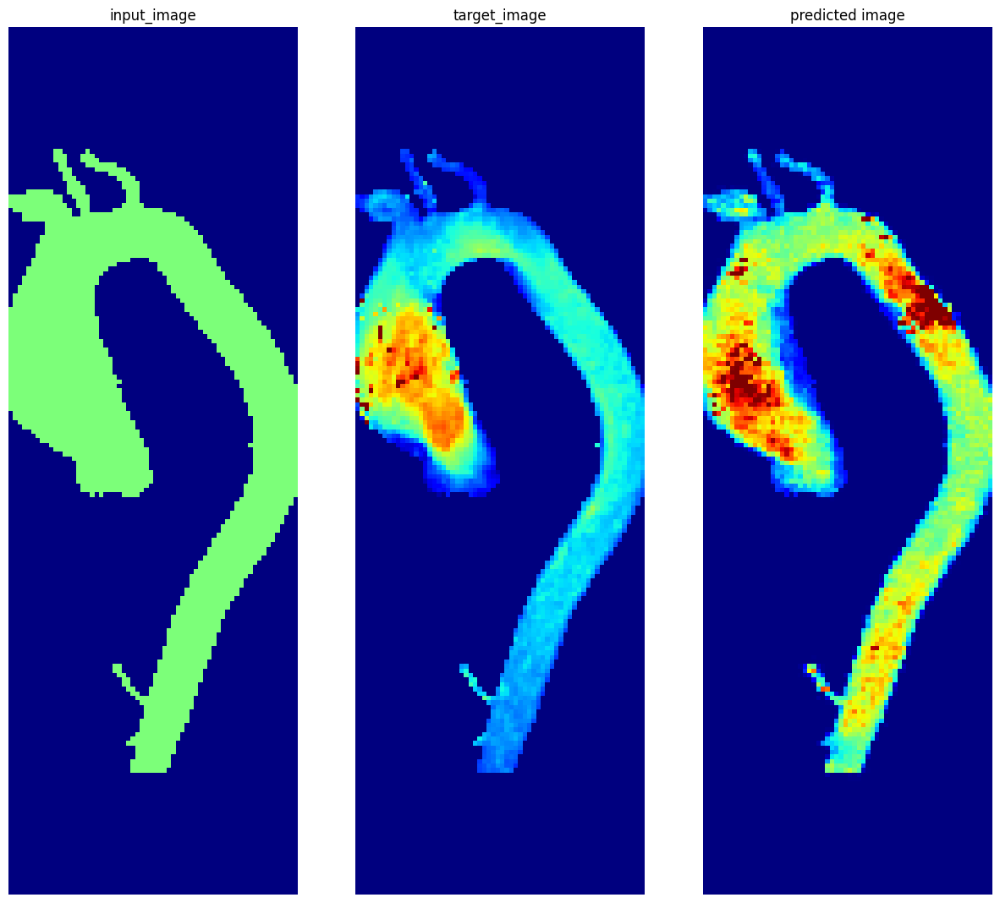

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 12:21:50.819039: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 845 of 909
2023-01-05 12:21:51.548705: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:50,  7.41it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:38,  7.31it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.39it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:57,  7.42it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.42it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.38it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.38it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.40it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.80it/s]


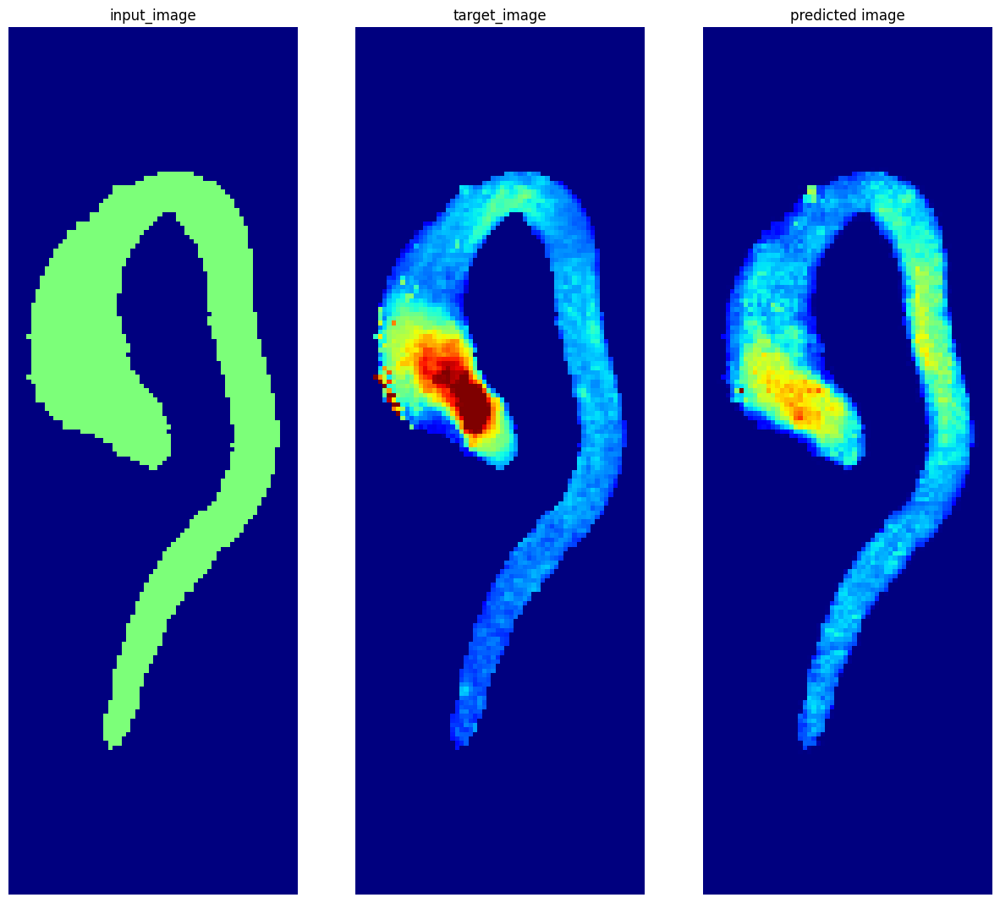

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 12:24:22.666462: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 833 of 909
2023-01-05 12:24:23.539952: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.43it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.36it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.42it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.39it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.35it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.40it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.37it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.40it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.37it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.79it/s]


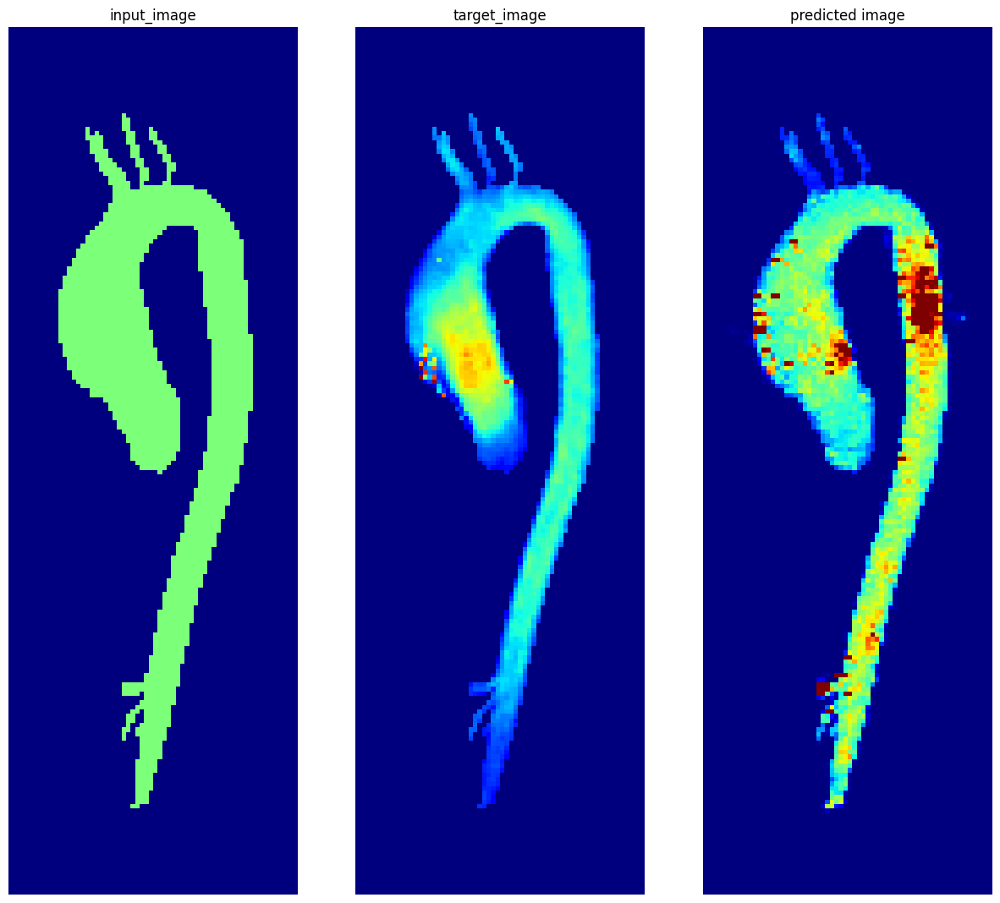

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 12:26:54.421815: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 852 of 909
2023-01-05 12:26:54.999435: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:50,  7.42it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.41it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.38it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.36it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.36it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.37it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.37it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.36it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.81it/s]


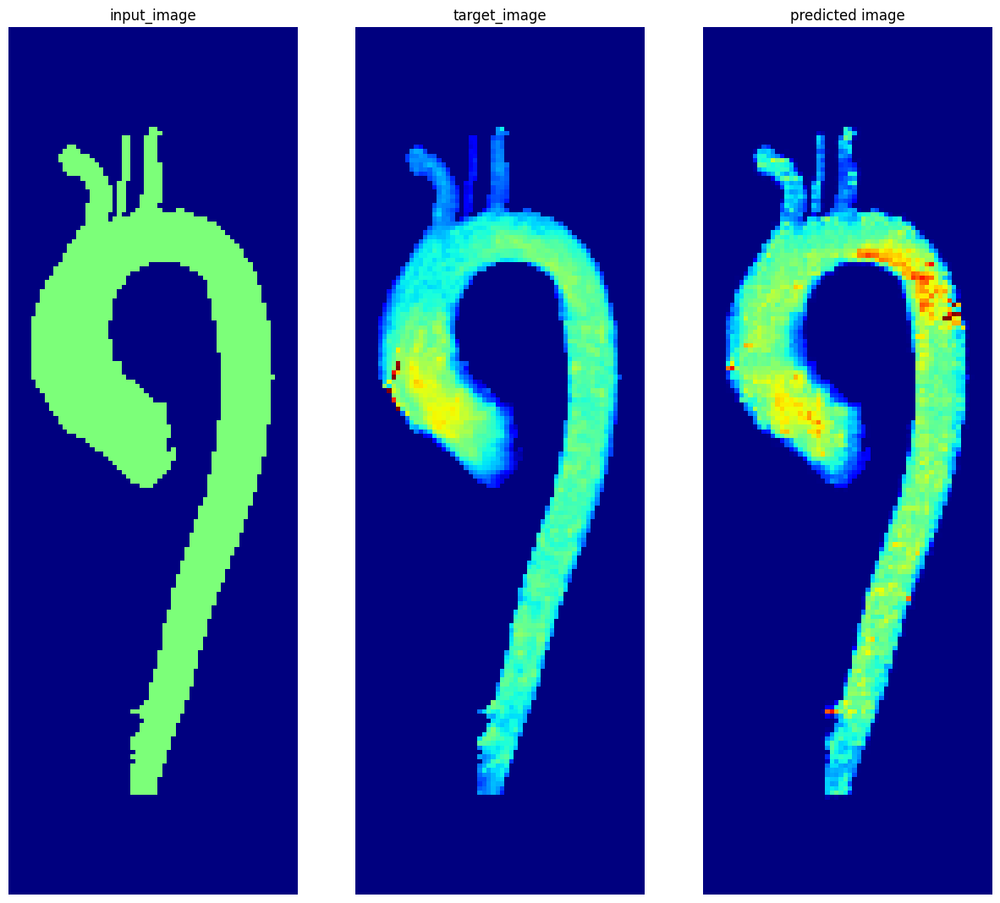

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 12:29:26.067011: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 806 of 909
2023-01-05 12:29:27.249533: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.43it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.40it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.36it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.40it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.39it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:29<00:45,  7.37it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.37it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.39it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.39it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:14<00:00,  6.78it/s]


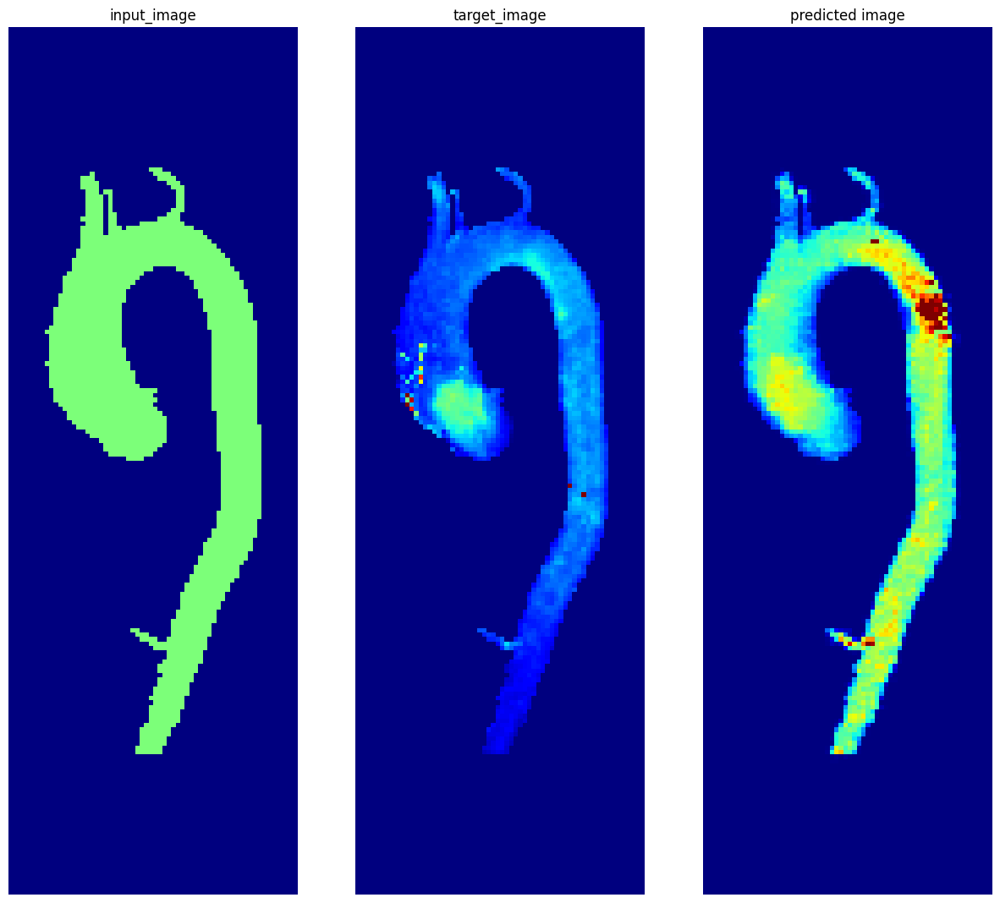

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 12:31:58.268377: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 785 of 909
2023-01-05 12:31:59.919393: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:50,  7.42it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.41it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:50<01:24,  7.38it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:03<01:11,  7.37it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:16<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:29<00:44,  7.40it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.36it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.37it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:09<00:05,  7.38it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:14<00:00,  6.75it/s]


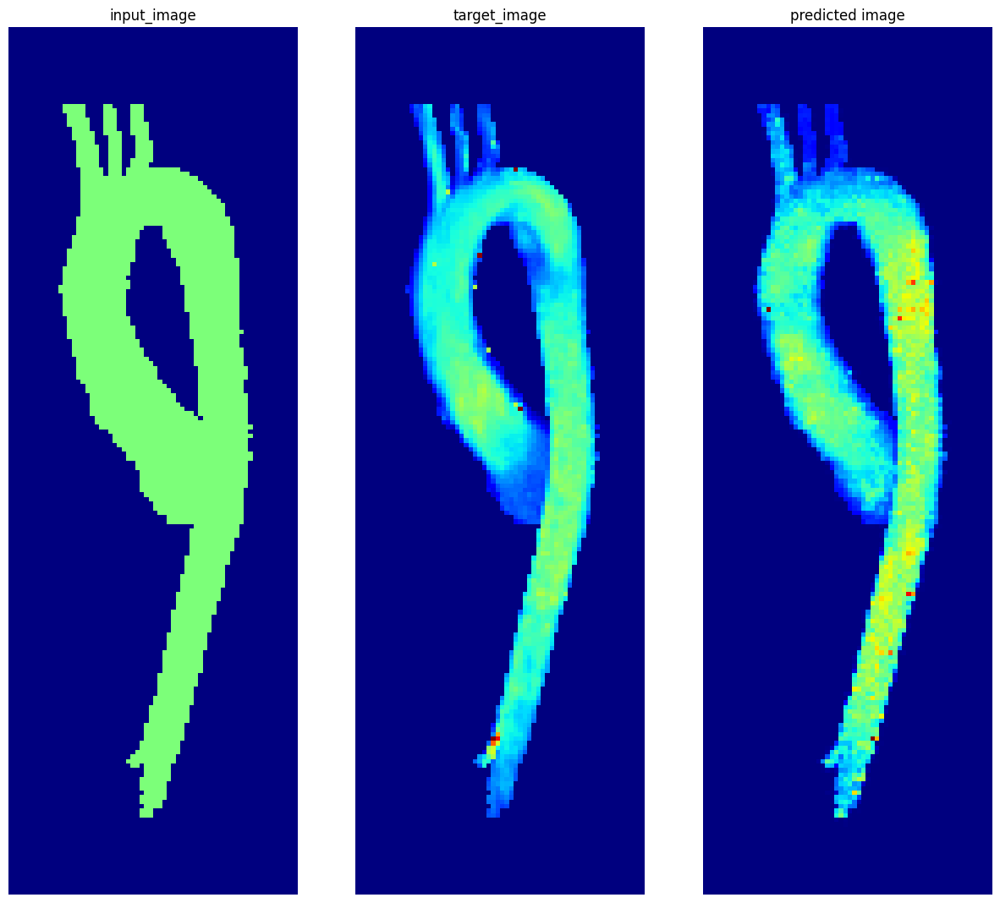

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 12:34:32.115234: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 828 of 909
2023-01-05 12:34:32.984582: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:50,  7.42it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.40it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.37it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.40it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:57,  7.41it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.39it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.40it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.37it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.42it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.80it/s]


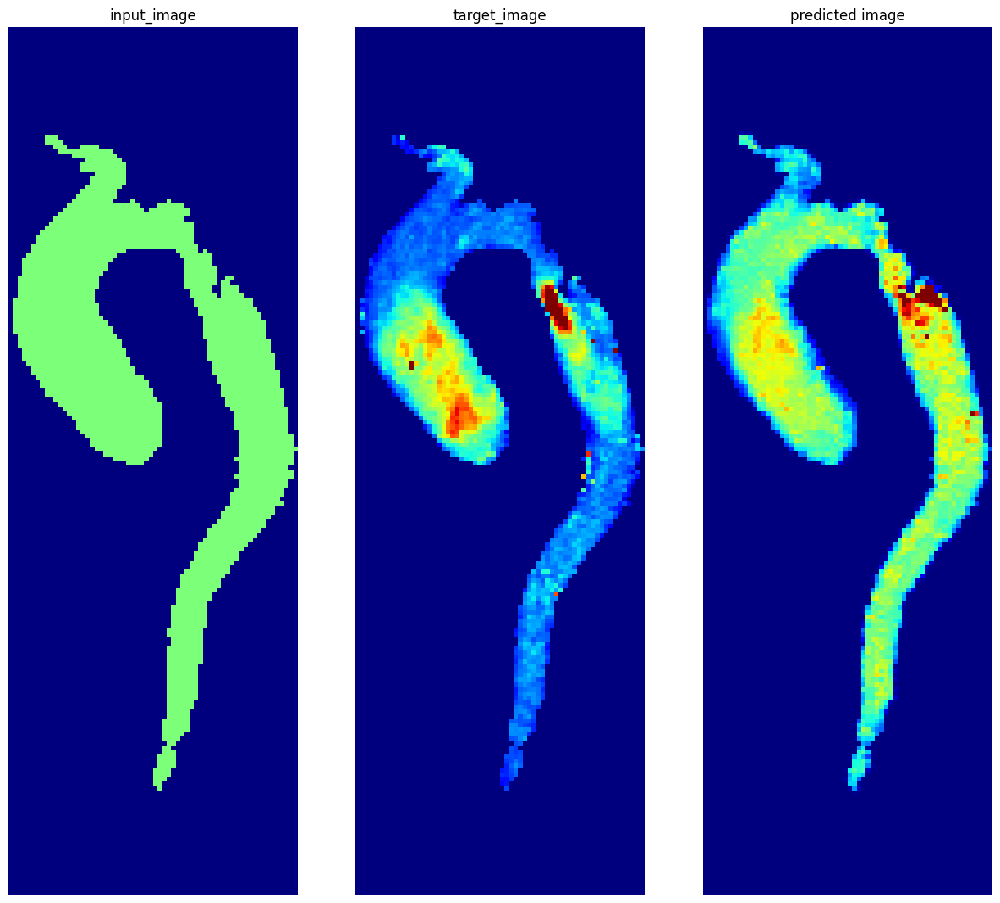

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 12:37:03.670519: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 780 of 909
2023-01-05 12:37:05.344783: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:50,  7.42it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.39it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:50<01:24,  7.36it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:03<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:16<00:58,  7.36it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:29<00:45,  7.37it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.38it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.36it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.39it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:14<00:00,  6.76it/s]


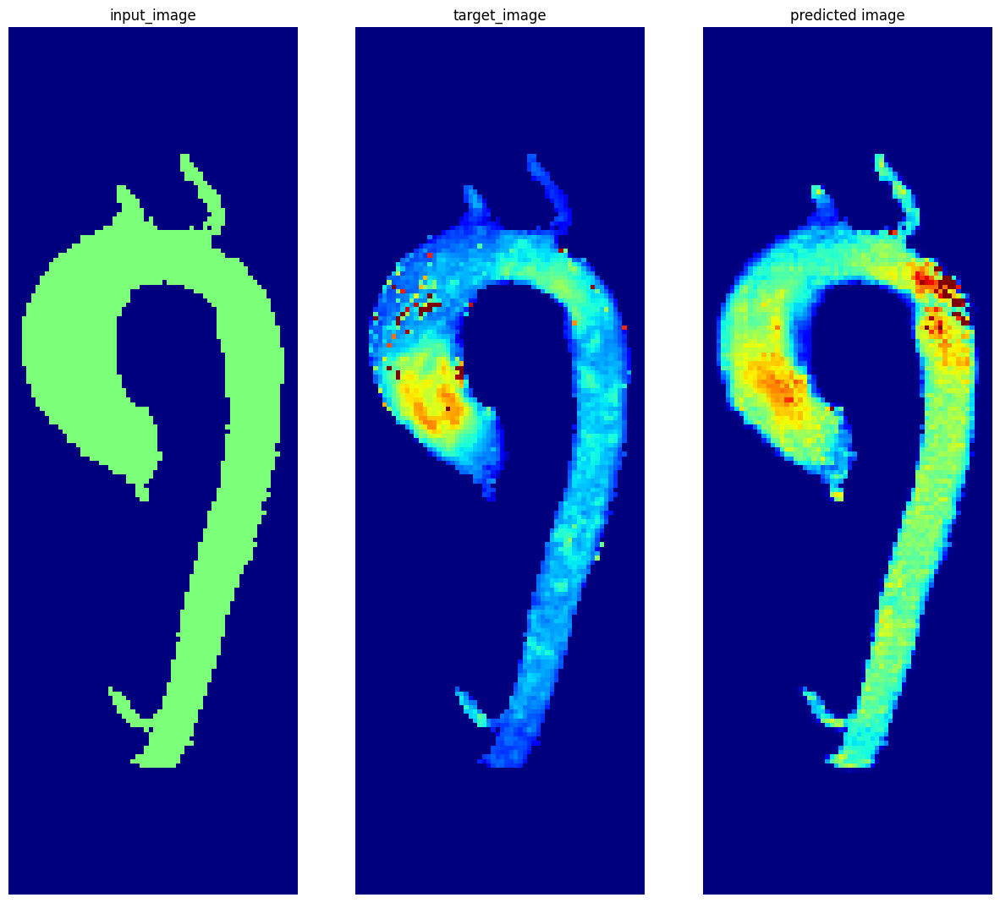

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 12:39:35.914052: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 813 of 909
2023-01-05 12:39:37.033576: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.45it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.39it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.40it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.40it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:29<00:45,  7.35it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.40it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.39it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.39it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:14<00:00,  6.78it/s]


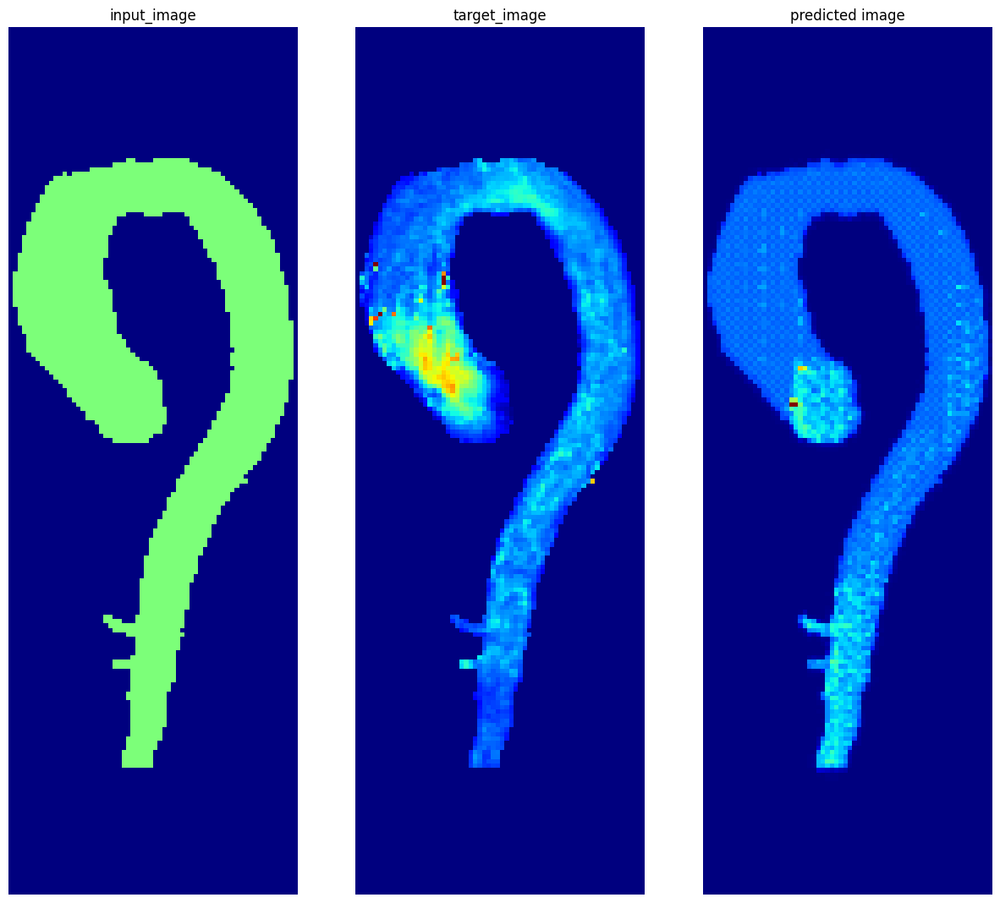

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 12:42:07.863746: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 850 of 909
2023-01-05 12:42:08.514870: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:51,  7.33it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.38it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.39it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.39it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.36it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.38it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.36it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.80it/s]


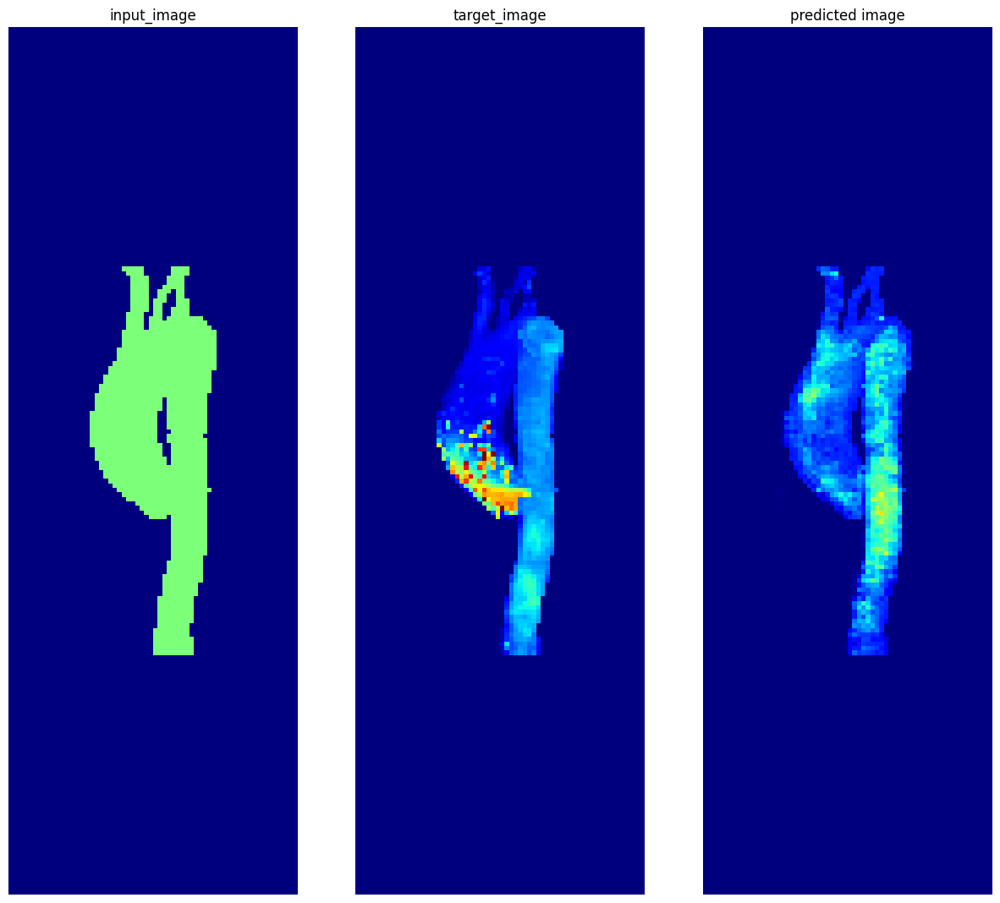

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 12:44:39.237501: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 866 of 909
2023-01-05 12:44:39.718399: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:50,  7.39it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.40it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:24,  7.39it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.40it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.37it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.37it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.37it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.38it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.40it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.81it/s]


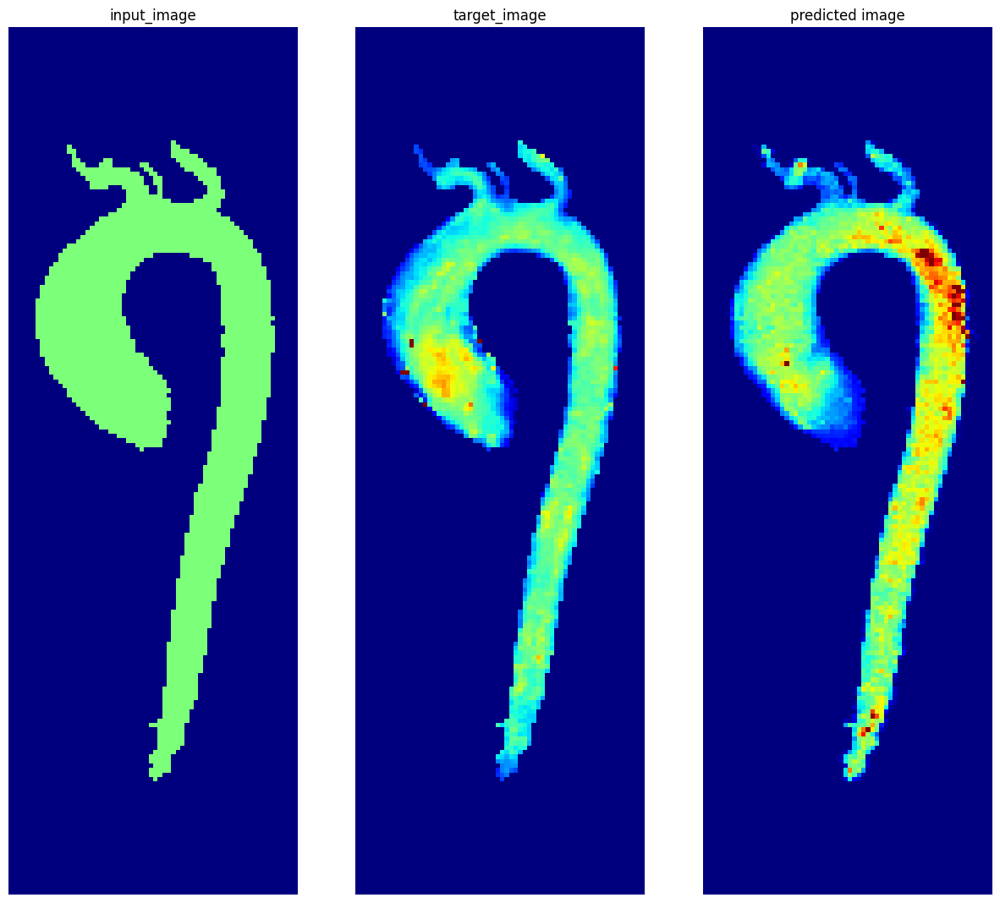

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 12:47:10.552199: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 825 of 909
2023-01-05 12:47:11.608221: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.44it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.38it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.38it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.39it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.37it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:45,  7.37it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.38it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.38it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.36it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:14<00:00,  6.78it/s]


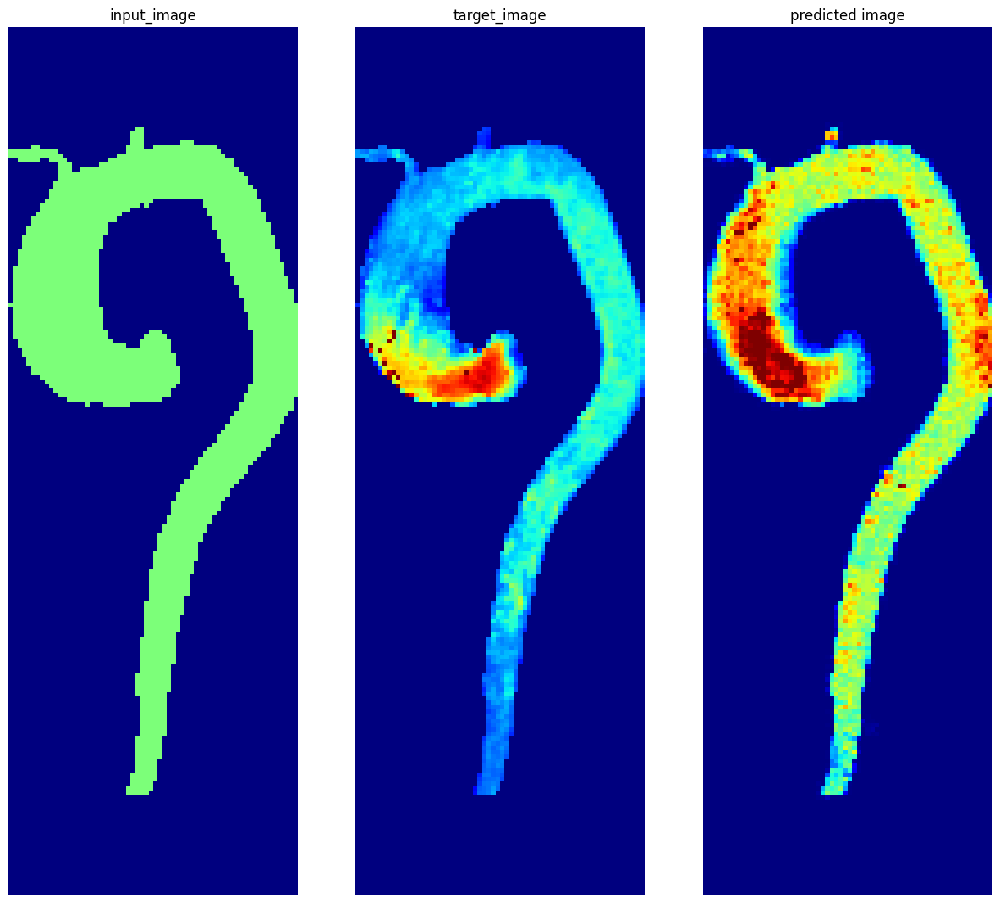

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 12:49:42.366546: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 822 of 909
2023-01-05 12:49:43.383803: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.43it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.39it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.36it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.36it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.39it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.39it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.38it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.37it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.37it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.79it/s]


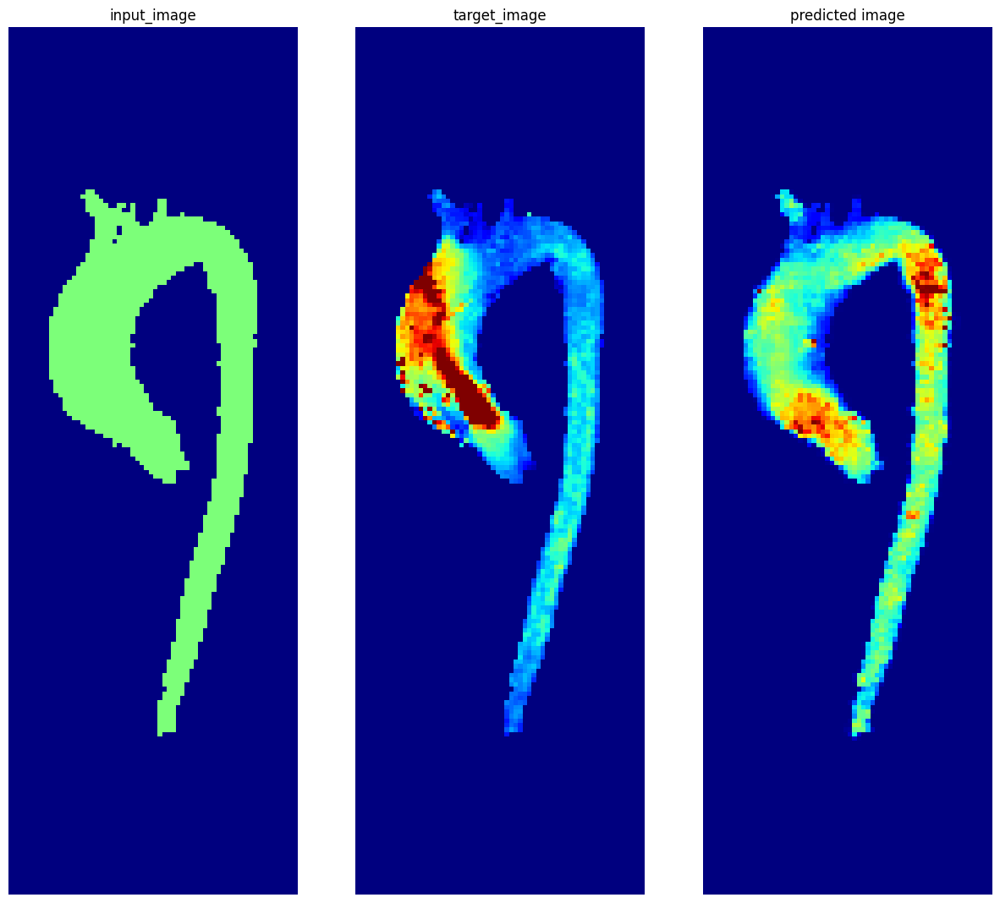

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 12:52:14.146083: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 808 of 909
2023-01-05 12:52:15.366566: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.45it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.37it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.38it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:29<00:44,  7.41it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.39it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.40it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.39it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:14<00:00,  6.78it/s]


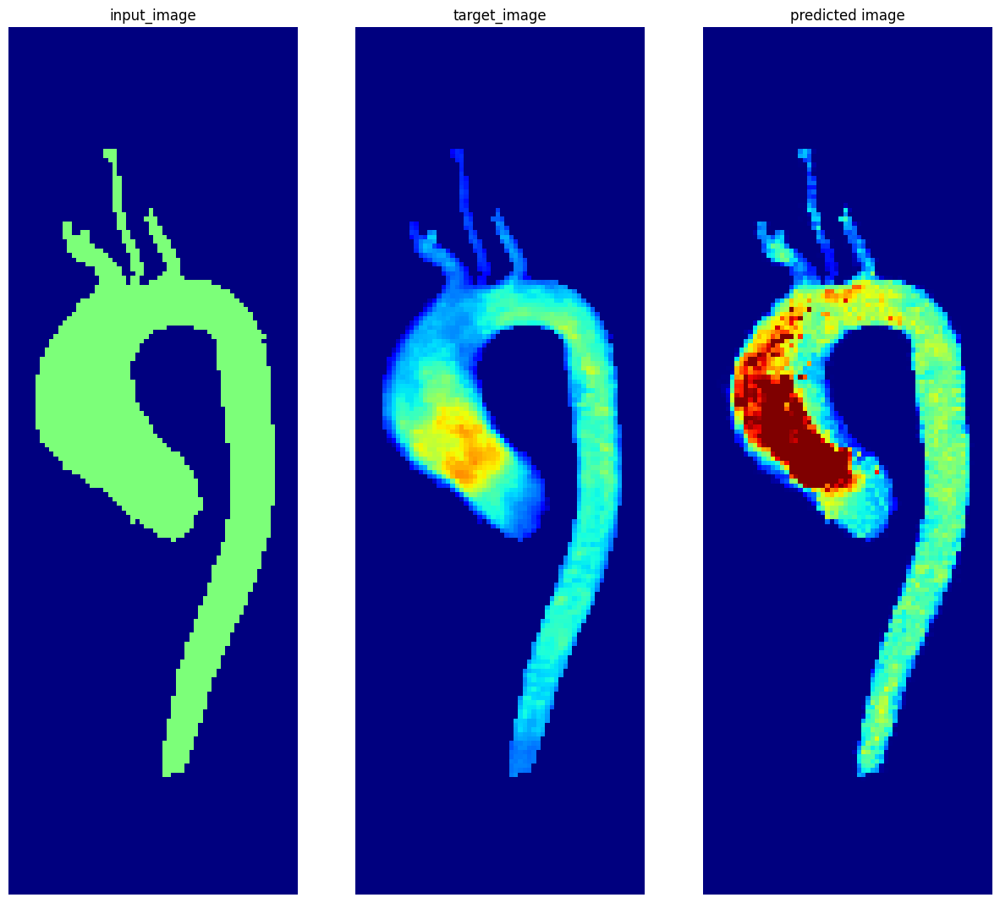

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 12:54:45.995249: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 798 of 909
2023-01-05 12:54:47.360294: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.44it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.37it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.38it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.39it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:16<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:29<00:44,  7.39it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.39it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.38it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.38it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:14<00:00,  6.77it/s]


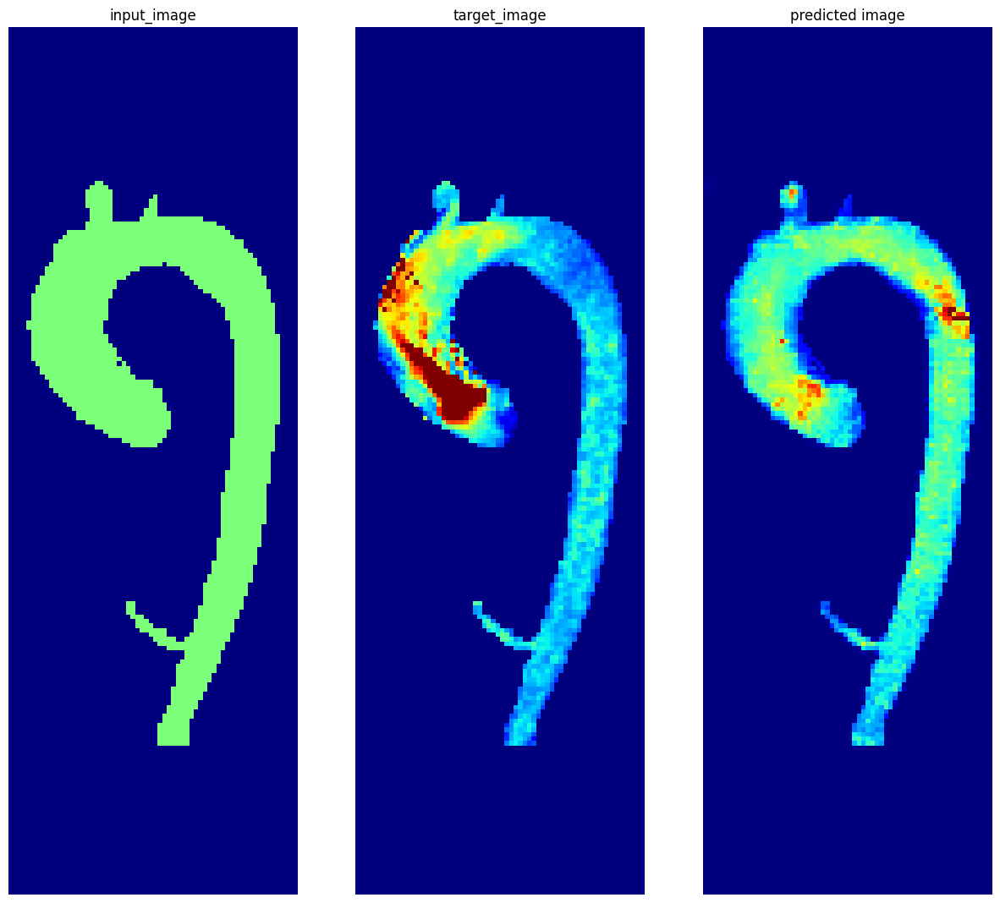

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 12:57:19.293786: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 818 of 909
2023-01-05 12:57:20.410976: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.46it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.41it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.40it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.41it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.40it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.37it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.38it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.79it/s]


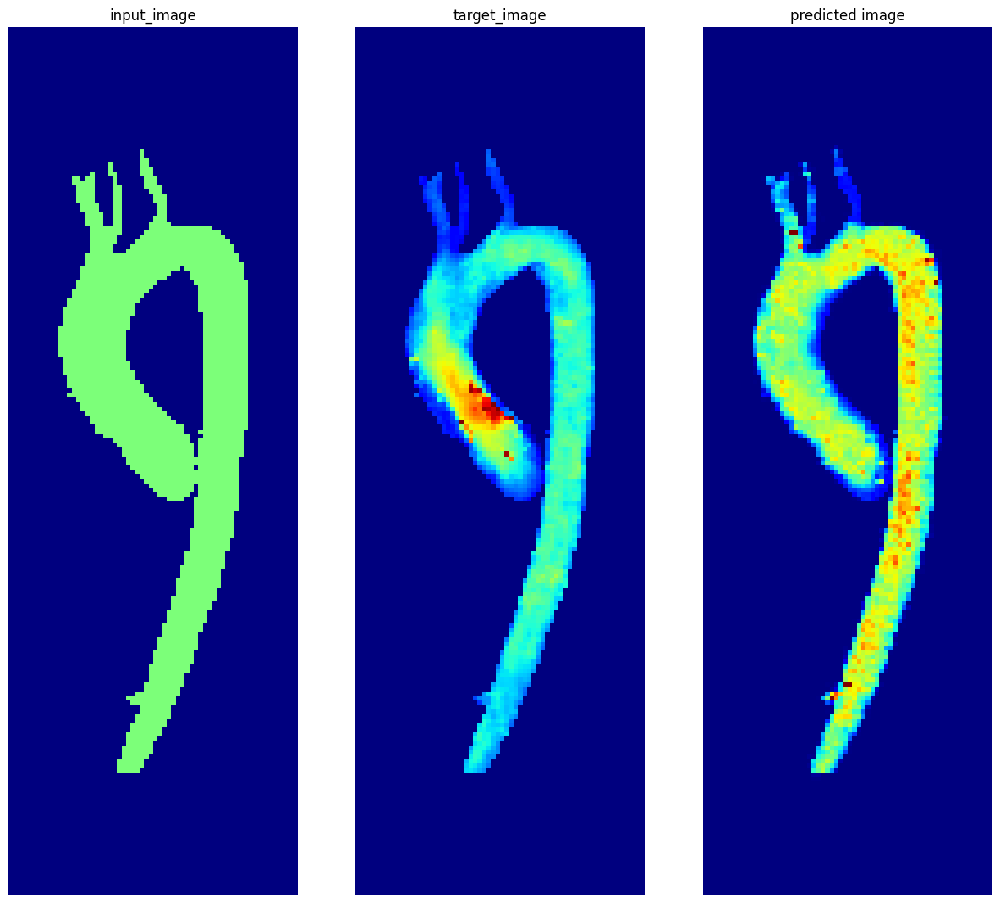

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 12:59:52.414049: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 781 of 909
2023-01-05 12:59:53.958798: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.45it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.38it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:50<01:24,  7.36it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:03<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:16<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:29<00:44,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.39it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.29it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.40it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:14<00:00,  6.76it/s]


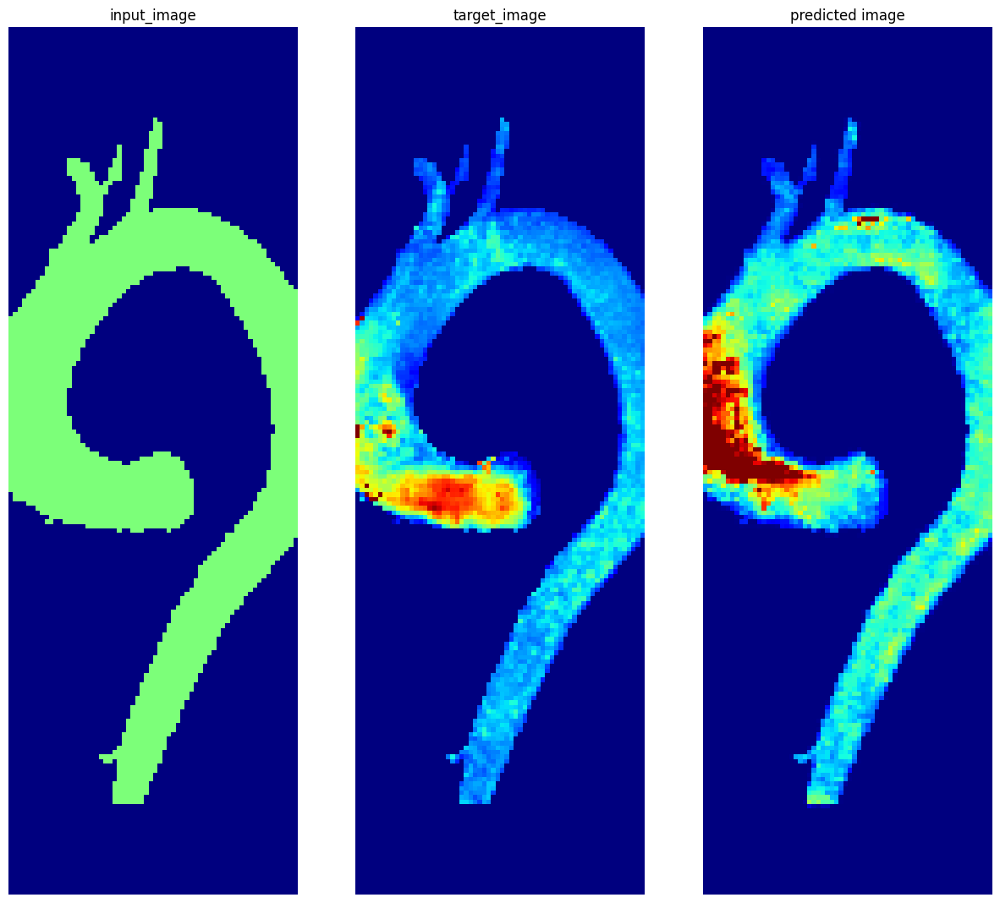

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 13:02:26.166450: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 792 of 909
2023-01-05 13:02:27.683871: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:49,  7.43it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.40it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.39it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:03<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:16<00:58,  7.39it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:29<00:45,  7.36it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.37it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.39it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.41it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:14<00:00,  6.76it/s]


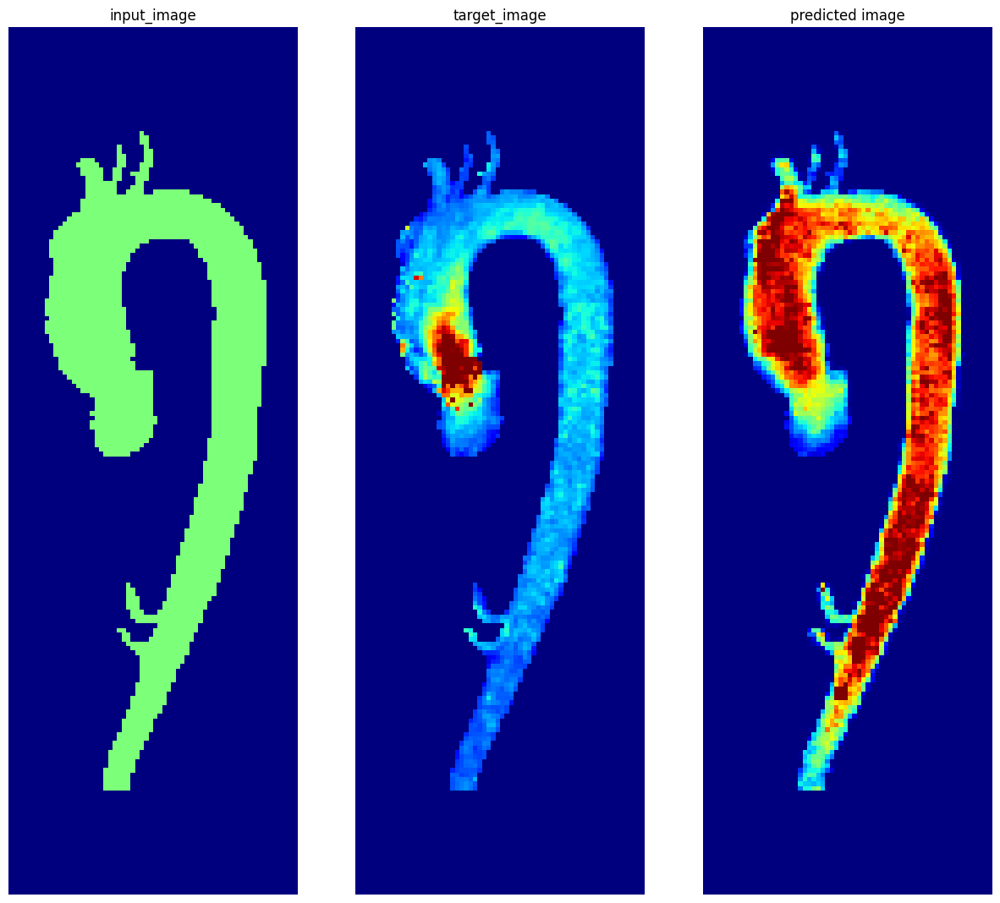

Inner Epoch:  10%|███                          | 95/909 [00:22<01:49,  7.42it/s]


Inner Epoch:  21%|█████▉                      | 192/909 [00:35<01:36,  7.40it/s]


Inner Epoch:  32%|████████▉                   | 289/909 [00:48<01:24,  7.37it/s]


Inner Epoch:  42%|███████████▉                | 386/909 [01:01<01:11,  7.36it/s]


Inner Epoch:  53%|██████████████▉             | 483/909 [01:15<00:57,  7.37it/s]


Inner Epoch:  64%|█████████████████▊          | 580/909 [01:28<00:44,  7.39it/s]


Inner Epoch:  74%|████████████████████▊       | 677/909 [01:41<00:31,  7.41it/s]


Inner Epoch:  85%|███████████████████████▊    | 774/909 [01:54<00:18,  7.39it/s]


Inner Epoch:  96%|██████████████████████████▊ | 871/909 [02:07<00:05,  7.39it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:12<00:00,  6.84it/s]


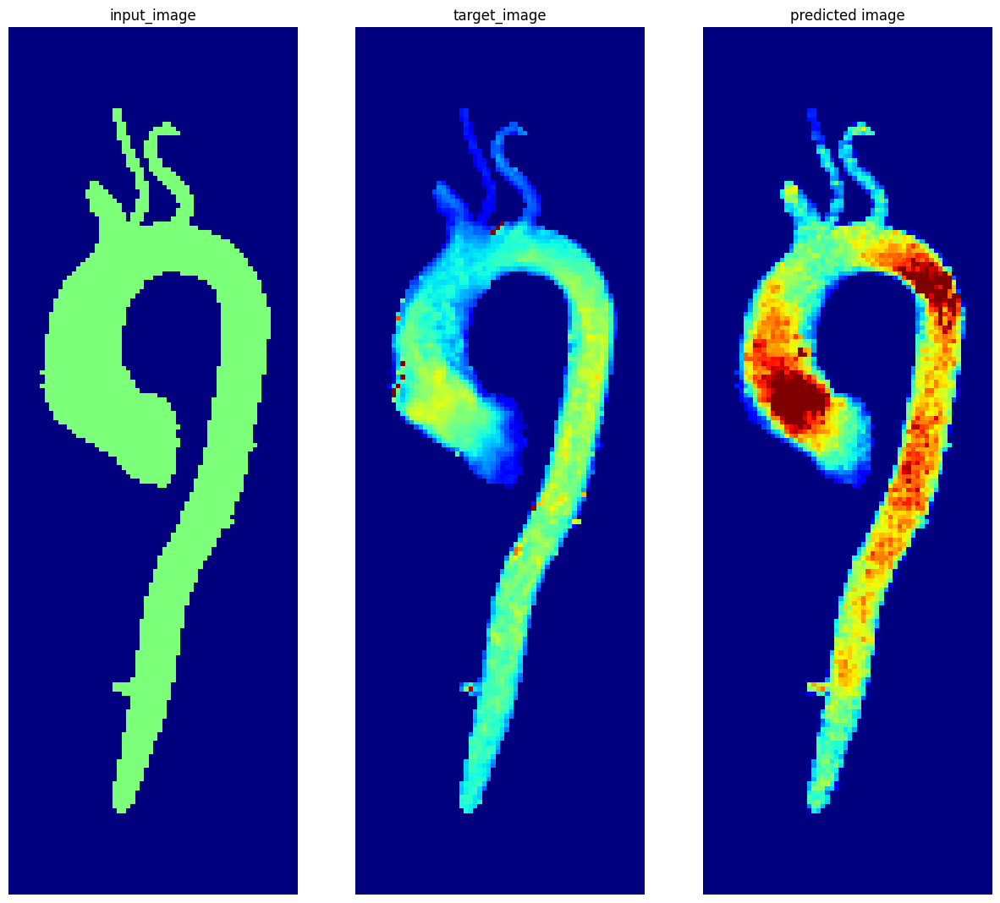

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 13:07:30.528492: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 867 of 909
2023-01-05 13:07:31.045760: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:50,  7.42it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.41it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:24,  7.39it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.39it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.39it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:28<00:44,  7.40it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.38it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.39it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.37it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:13<00:00,  6.82it/s]


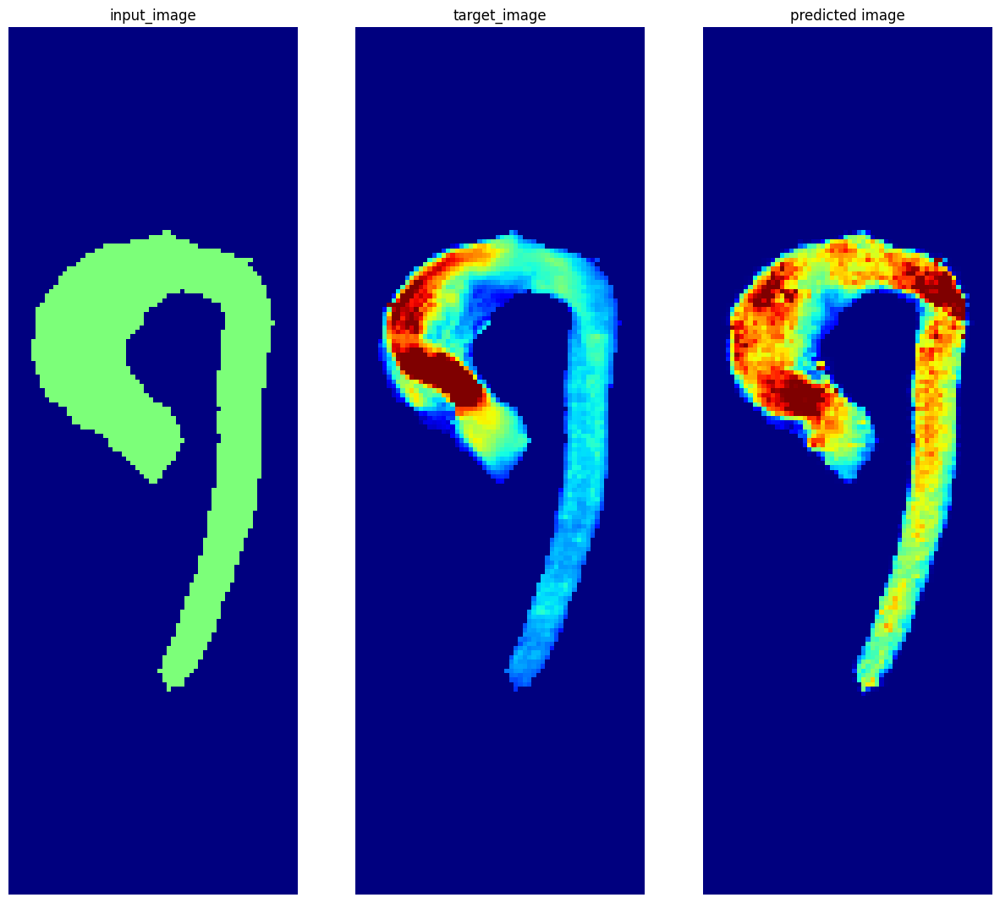

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 13:10:02.635058: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 902 of 909
2023-01-05 13:10:02.727799: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:50,  7.42it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:36,  7.44it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:24,  7.38it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:01<01:11,  7.38it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:14<00:57,  7.42it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:27<00:44,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.40it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.40it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.38it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:12<00:00,  6.84it/s]


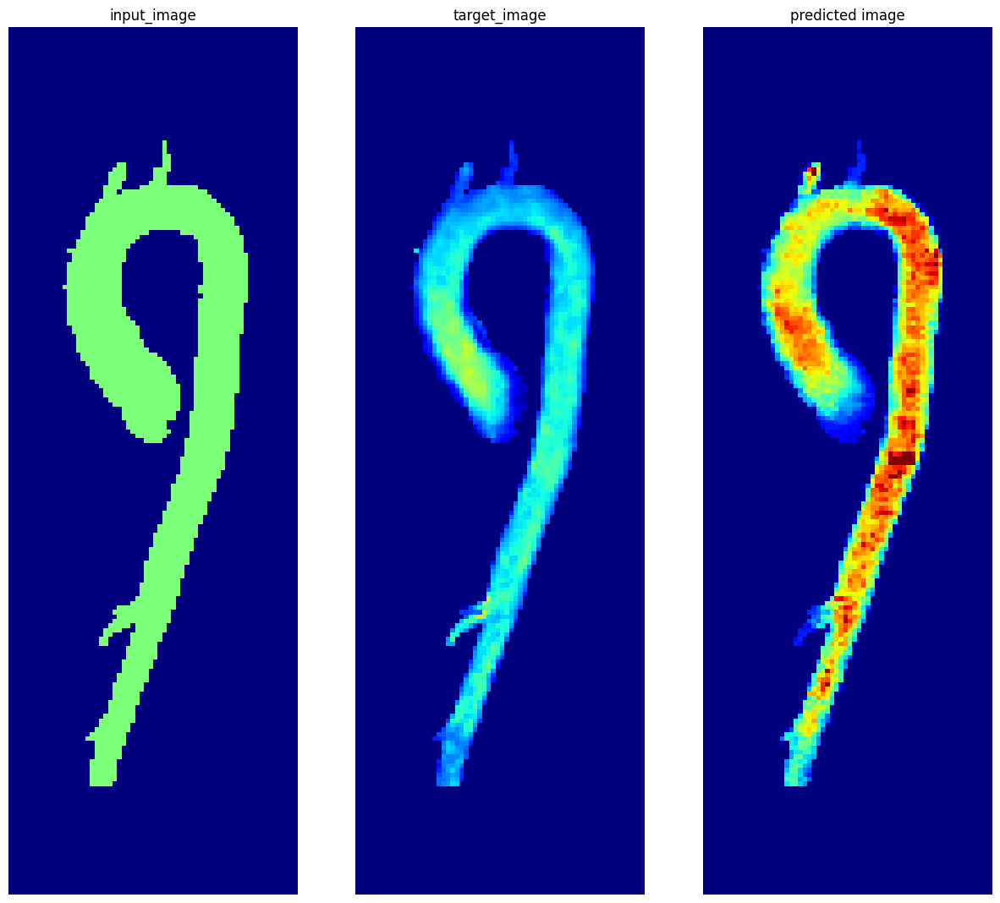

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 13:12:33.893582: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 902 of 909
2023-01-05 13:12:33.971524: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:22<01:49,  7.44it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:35<01:37,  7.39it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:48<01:24,  7.37it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:01<01:11,  7.37it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:14<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:27<00:45,  7.37it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:41<00:31,  7.40it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:54<00:18,  7.39it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:07<00:05,  7.30it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:12<00:00,  6.84it/s]


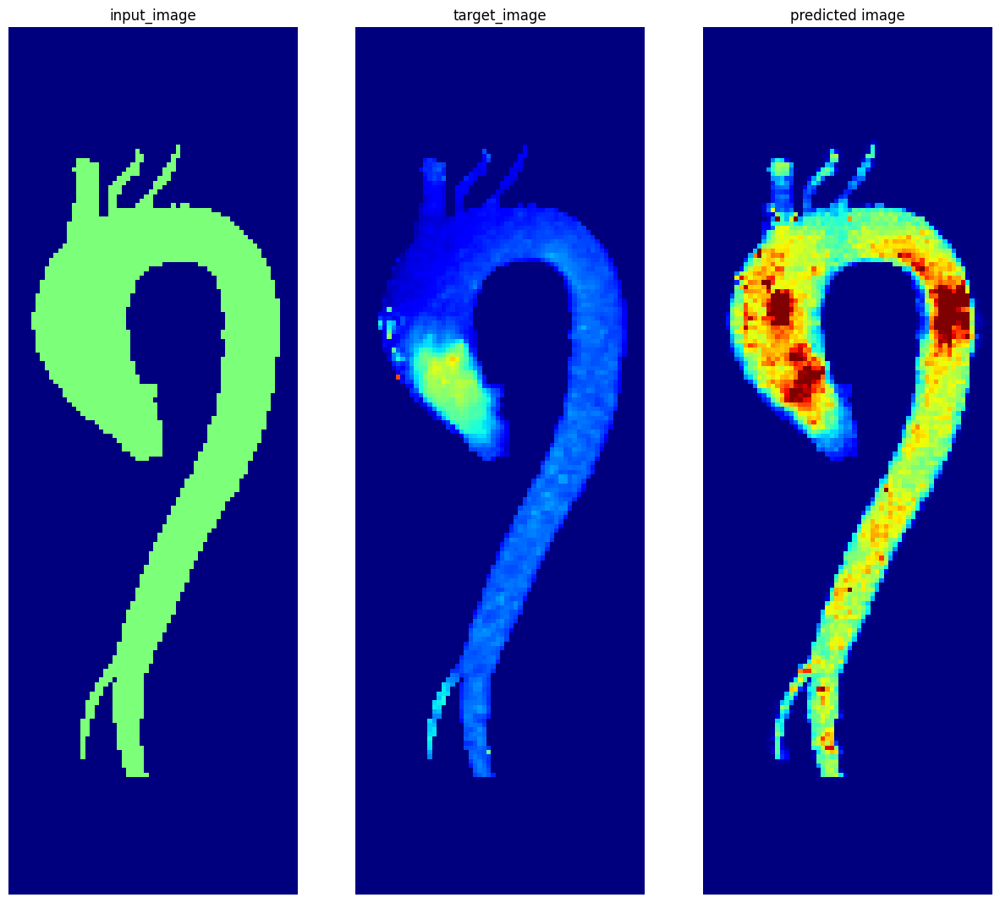

Inner Epoch:   0%|                                      | 0/909 [00:00<?, ?it/s]2023-01-05 13:15:04.759014: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 812 of 909
2023-01-05 13:15:05.946343: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.

Inner Epoch:  10%|██▉                          | 92/909 [00:23<01:50,  7.36it/s]


Inner Epoch:  21%|█████▊                      | 189/909 [00:36<01:37,  7.38it/s]


Inner Epoch:  31%|████████▊                   | 286/909 [00:49<01:24,  7.35it/s]


Inner Epoch:  42%|███████████▊                | 383/909 [01:02<01:11,  7.39it/s]


Inner Epoch:  53%|██████████████▊             | 480/909 [01:15<00:58,  7.38it/s]


Inner Epoch:  63%|█████████████████▊          | 577/909 [01:29<00:44,  7.38it/s]


Inner Epoch:  74%|████████████████████▊       | 674/909 [01:42<00:31,  7.37it/s]


Inner Epoch:  85%|███████████████████████▋    | 771/909 [01:55<00:18,  7.41it/s]


Inner Epoch:  95%|██████████████████████████▋ | 868/909 [02:08<00:05,  7.39it/s]


Inner Epoch: 100%|████████████████████████████| 909/909 [02:14<00:00,  6.78it/s]


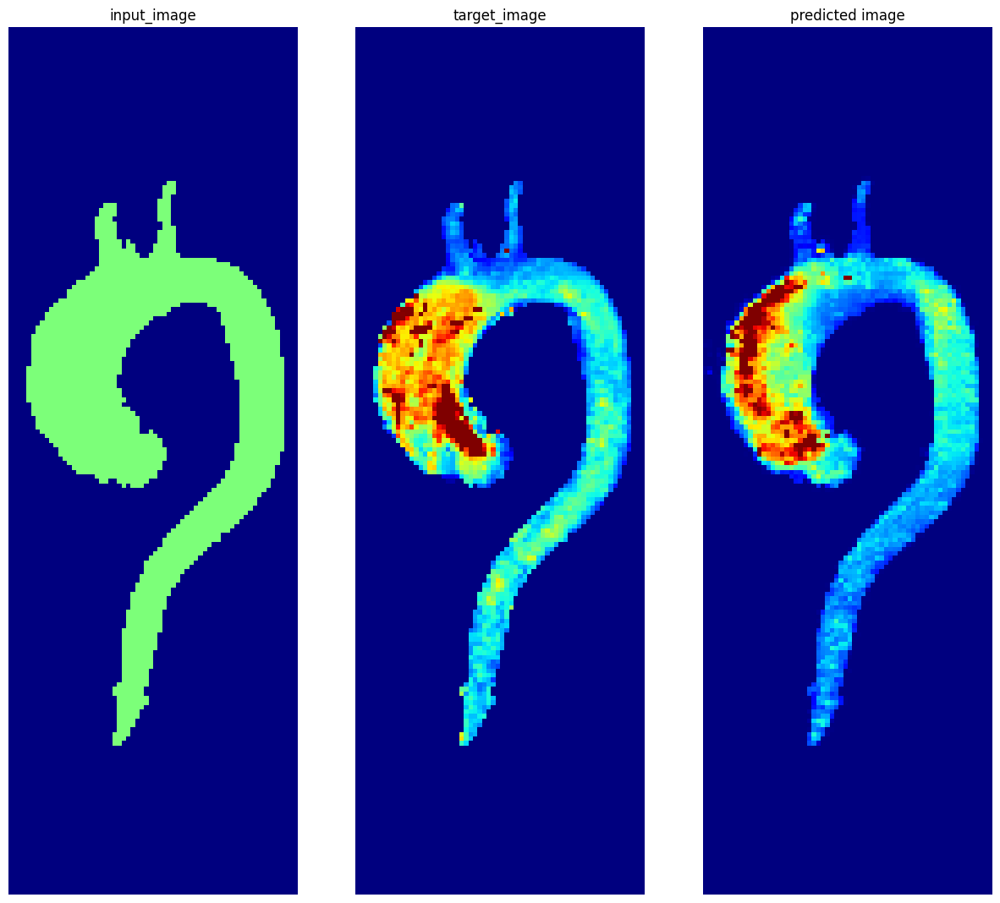

Outer Epoch: 100%|███████████████████████████| 98/98 [4:07:30<00:00, 151.53s/it]


In [27]:
import tqdm 
import scipy.io
epochs = 98 # specifiy number of epochs to train the network
sample_dir = tf.io.gfile.join(output_dir,'samples_training') # directory to save example .mat files
if not tf.io.gfile.isdir(sample_dir):
    tf.io.gfile.mkdir(sample_dir)
# Restoring the latest checkpoint in checkpoint_dir
checkpoint_address = tf.train.latest_checkpoint(checkpoint_dir) # returns the address of last checkpoint
epochs_so_far = 0 
if checkpoint_address: # verifies if the checkpoint exists
    checkpoint.restore(checkpoint_address) # restores to the last checkpoint
    hyphen = checkpoint_address.index('-') # finds the location of hyphen in the checkpoint address
    epochs_so_far = int(checkpoint_address[hyphen+1:]) # finds the number trained epochs
    print("Restored the model from epoch {}".format(epochs_so_far))

for epoch in tqdm.trange(epochs_so_far+1,epochs+epochs_so_far+1,desc="Outer Epoch",total=epochs):
    for anatomy,flow in tqdm.tqdm(dataset_train,desc="Inner Epoch",total=DATA_SIZE):
        train_step(anatomy,flow)
    checkpoint.save(file_prefix=checkpoint_prefix) # save a checkpoint after each epoch
    example_anatomy,example_flow = next(dataset_test) # load an example test dataset after each epoch
    generate_images(generator,example_anatomy,example_flow) # generate example images after each epoch
    for ii in range(len(Asample)):
        A = tf.reshape(Asample[ii],(1,DATA_HEIGHT,DATA_WIDTH,DATA_DEPTH,1))
        B = tf.reshape(Bsample[ii],(1,DATA_HEIGHT,DATA_WIDTH,DATA_DEPTH,1))
        A2B = generator(A,training=True)
        anatomy = tf.squeeze(A.numpy())
        flow = tf.squeeze(B.numpy())
        anatomy2flow = tf.squeeze(A2B.numpy())  
        filename1 = tf.io.gfile.join(sample_dir,'iter-%03u-%02u.mat' % (epoch,ii))
        scipy.io.savemat(filename1,{'anatomy':anatomy.numpy(),
                        'flow':flow.numpy(),
                        'anatomy2flow':anatomy2flow.numpy()})